## New Adversaray Model - CTKD with WIDER

In [2]:
import time
import torch
import json
import warnings
import torchvision
import os
import torchvision.transforms as transforms
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
import torchvision.models as models

from pathlib import Path
from tqdm import tqdm
from PIL import Image
from sklearn import metrics
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report, precision_recall_fscore_support
from torch.utils.data import Dataset, DataLoader
from torchvision.models import EfficientNet
from utils.loss_functions import tkd_kdloss
from torch.optim import lr_scheduler

# Suppress all warnings
warnings.filterwarnings("ignore")

In [3]:
# Hyperparameters / Inputs
teacher_learning_rate = 0.0005 # 0.096779
student_learning_rate = teacher_learning_rate
teacher_epochs = 200
student_epochs = teacher_epochs
teacher_patience = 3
student_patience = 10
temperature = 20.0
alpha = 0.9
momentum = 0.9
batch_size = 64
num_workers = 4
weight_decay = 1e-5
epsilon = 0.05
margin = 0.01
num_classes = 16
base_save_dir = "Test_Dir10"

# # list of lambda values to loop through for grid search
# teacher_lambda_factor_list = [0]
# student_lambda_factor_list = [0,20,40,80,100,150]

# # list of lambda values to loop through for grid search
# teacher_lambda_factor_list = [0]
# student_lambda_factor_list = [0,5,10,15,20,25,30,40,80,100,150]

teacher_lambda_factor_list = [0]
student_lambda_factor_list = [0.5,1,1.5,2,3]
                              

# # list of lambda values to loop through for grid search
# teacher_lambda_factor_list = [0]
# student_lambda_factor_list = [0,20,40,60,80,100,120,140,160,180,200]

In [4]:
# labels used including for plotting
class_labels = [0, 1, 3, 4, 6, 7, 11, 15, 17, 18, 19, 20, 22, 25, 27, 28, 30, 31, 33, 35, 36, 37, 39, 43, 44, 50, 51, 54, 57, 58]
class_labels_new = torch.tensor([i for i in range(len(class_labels))])
class_names_new = [f"Class {label}" for label in range(num_classes)]


In [5]:
# set device to cuda if available
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [6]:
file_path = 'data/WIDER/Annotations/wider_attribute_trainval.json'

with open(file_path, 'r') as file:
    # Load the JSON data from the file
    data = json.load(file)

class_idx = data['scene_id_map']

In [7]:
new_label_mapping = {
    0: "Team_Sports",
    1: "Celebration",
    2: "Parade",
    3: "Waiter_Or_Waitress",
    4: "Individual_Sports",
    5: "Surgeons",
    6: "Spa",
    7: "Law_Enforcement",
    8: "Business",
    9: "Dresses",
    10: "Water_Activities",
    11: "Picnic",
    12: "Rescue",
    13: "Cheering",
    14: "Performance_And_Entertainment",
    15: "Family"
}

# Ensure that all 16 new classes are covered
# If some classes are not explicitly mentioned in new_label_mapping, add them
for i in range(num_classes):
    if i not in new_label_mapping:
        new_label_mapping[i] = "Additional Category {}".format(i)

class_idx = new_label_mapping

In [8]:
class DataSet(Dataset):
    def __init__(self, ann_files, augs, img_size, dataset):

        # Create a mapping from old labels to new labels
        self.label_mapping = {old_label: new_label for new_label, old_label in enumerate(sorted(class_labels))}

        self.new_label_mapping = {
            0: 2,  # Parade
            1: 8,  # Business
            2: 7,  # Law Enforcement
            3: 14,  # Performance and Entertainment
            4: 1,  # Celebration
            5: 13,  # Cheering
            6: 8,  # Business
            7: 8,  # Business
            8: 1,  # Celebration
            9: 14,  # Performance and Entertainment
            10: 15, # Family
            11: 15, # Family
            12: 11, # Picnic
            13: 7, # Law Enforcement
            14: 6, # Spa
            15: 13, # Cheering
            16: 5, # Surgeons
            17: 3, # Waiter or Waitress
            18: 4, # Individual Sports
            19: 0, # Team Sports
            20: 0, # Team Sports
            21: 0, # Team Sports
            22: 4, # Individual Sports
            23: 10, # Water Activities
            24: 4, # Individual Sports
            25: 1, # Celebration
            26: 9, # Dresses
            27: 12, # Rescue
            28: 10,# Water Activities
            29: 0  # Team Sports
        }

        self.dataset = dataset
        self.ann_files = ann_files
        self.augment = self.augs_function(augs, img_size)
        # Initialize transformations directly
        self.transform = transforms.Compose(
            [
                transforms.ToTensor(),
                transforms.Normalize(mean=[0, 0, 0], std=[1, 1, 1])
            ] 
        )
        if self.dataset == "wider":
            self.transform = transforms.Compose(
                [
                    transforms.ToTensor(),
                    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])                ] 
            )        

        self.anns = []
        self.load_anns()
        print(self.augment)

    def augs_function(self, augs, img_size):            
        t = []
        if 'randomflip' in augs:
            t.append(transforms.RandomHorizontalFlip())
        if 'ColorJitter' in augs:
            t.append(transforms.ColorJitter(brightness=0.5, contrast=0.5, saturation=0.5, hue=0))
        if 'resizedcrop' in augs:
            t.append(transforms.RandomResizedCrop(img_size, scale=(0.7, 1.0)))
        if 'RandAugment' in augs:
            t.append(transforms.RandAugment())

        t.append(transforms.Resize((img_size, img_size)))

        return transforms.Compose(t)
    
    def load_anns(self):
        self.anns = []
        for ann_file in self.ann_files:
            json_data = json.load(open(ann_file, "r"))
            self.anns += json_data

    def __len__(self):
        return len(self.anns)

    def __getitem__(self, idx):
        # Make sure the index is within bounds
        idx = idx % len(self)
        ann = self.anns[idx]
        
        try:
            # Attempt to open the image file
            img = Image.open(f'data/WIDER/Image/{ann["file_name"]}').convert("RGB")

            # If this is the wider dataset, proceed with specific processing
            # x, y, w, h = ann['bbox']
            # img_area = img.crop([x, y, x+w, y+h])
            img_area = self.augment(img)
            img_area = self.transform(img_area)
            attributes_list = [target['attribute'] for target in ann['targets']]
            attributes_list = [[max(0, element) for element in inner_list] for inner_list in attributes_list]
            num_people = len(attributes_list)
            attributes_distribution = [max(sum(attribute), 0)/num_people for attribute in zip(*attributes_list)]
            # Extract label from image path
            img_path = f'data/WIDER/Image/{ann["file_name"]}'
            label = self.extract_label(img_path)  # You might need to implement this method
            
            return {
                "label": label,
                "target": torch.tensor([attributes_distribution[0]], dtype=torch.float32),
                "img": img_area
            }
            
        except Exception as e:
            # If any error occurs during the processing of an image, log the error and the index
            print(f"Error processing image at index {idx}: {e}")
            # Instead of returning None, raise the exception
            raise

    def extract_label(self, img_path):
        original_label = None
    
        if "data/WIDER/Image/train" in img_path:
            label_str = img_path.split("data/WIDER/Image/train/")[1].split("/")[0]
            original_label = int(label_str.split("--")[0])
        elif "data/WIDER/Image/test" in img_path:
            label_str = img_path.split("data/WIDER/Image/test/")[1].split("/")[0]
            original_label = int(label_str.split("--")[0])
        elif "data/WIDER/Image/val" in img_path:  # Handle validation images
            label_str = img_path.split("data/WIDER/Image/val/")[1].split("/")[0]
            original_label = int(label_str.split("--")[0])
    
        if original_label is not None:
            remapped_label = self.label_mapping[original_label]
            new_label_mapping = self.new_label_mapping[remapped_label]
            return new_label_mapping
        else:
            raise ValueError(f"Label could not be extracted from path: {img_path}")


In [9]:
train_file = ['data/wider/trainval_wider.json']
test_file = ['data/wider/test_wider.json']


In [10]:
def custom_collate(batch):
    # Filter out any None items in the batch
    batch = [item for item in batch if item is not None]
    # If after filtering the batch is empty, handle this case by either returning an empty tensor or raising an exception
    if len(batch) == 0:
        raise ValueError("Batch is empty after filtering out None items.")
    return torch.utils.data.dataloader.default_collate(batch)


In [11]:
# train_dataset = DataSet(train_file, augs = ['RandAugment'], img_size = 226, dataset = 'wider')
train_dataset = DataSet(train_file, augs = [], img_size = 226, dataset = 'wider')
test_dataset = DataSet(test_file, augs = [], img_size = 226, dataset = 'wider')

trainloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, 
                         num_workers=num_workers, collate_fn=custom_collate)
testloader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=num_workers, collate_fn=custom_collate)


Compose(
    Resize(size=(226, 226), interpolation=bilinear, max_size=None, antialias=warn)
)
Compose(
    Resize(size=(226, 226), interpolation=bilinear, max_size=None, antialias=warn)
)


In [12]:
def one_hot_encode(labels, num_classes):
    return np.eye(num_classes)[labels]

def calculate_recall_multiclass(conf_matrix):
    recalls = np.diag(conf_matrix) / np.sum(conf_matrix, axis=1)
    recalls[np.isnan(recalls)] = 0
    return recalls

def evaluate_model_with_gender_multiclass(pred, label, gender, num_classes):
    predictions = pred.cpu()
    true_labels = label.cpu()
    gender = gender.cpu()

    # Identify male and female indices based on the gender threshold
    male_indices = np.where(gender >= 0.5)[0]
    female_indices = np.where(gender < 0.5)[0]

    # Convert labels to one-hot encoding
    one_hot_labels = one_hot_encode(true_labels, num_classes=num_classes)
    one_hot_preds = one_hot_encode(predictions, num_classes=num_classes)

    # Initialize recall arrays
    male_recall = np.zeros(num_classes)
    female_recall = np.zeros(num_classes)

    # Extract predictions and labels for male and female indices
    male_predictions = np.argmax(one_hot_preds[male_indices], axis=1)
    female_predictions = np.argmax(one_hot_preds[female_indices], axis=1)
    male_labels = np.argmax(one_hot_labels[male_indices], axis=1)
    female_labels = np.argmax(one_hot_labels[female_indices], axis=1)

    # Check if the class labels are within the expected range
    assert (0 <= male_predictions.min() < num_classes) and (0 <= male_predictions.max() < num_classes), "Invalid class indices in male predictions"
    assert (0 <= female_predictions.min() < num_classes) and (0 <= female_predictions.max() < num_classes), "Invalid class indices in female predictions"
    assert (0 <= male_labels.min() < num_classes) and (0 <= male_labels.max() < num_classes), "Invalid class indices in male labels"
    assert (0 <= female_labels.min() < num_classes) and (0 <= female_labels.max() < num_classes), "Invalid class indices in female labels"

    # Calculate confusion matrices for each gender
    male_conf_matrix = confusion_matrix(male_labels, male_predictions, labels=np.arange(num_classes))
    female_conf_matrix = confusion_matrix(female_labels, female_predictions, labels=np.arange(num_classes))

    # Calculate recall for each class and gender
    male_recall[:len(male_conf_matrix)] = calculate_recall_multiclass(male_conf_matrix)
    female_recall[:len(female_conf_matrix)] = calculate_recall_multiclass(female_conf_matrix)

    return male_recall - female_recall, male_conf_matrix, female_conf_matrix


In [13]:
class Critic(nn.Module):
    def __init__(self, input_size, hidden_size=256):
        super(Critic, self).__init__()
        self.fc1 = nn.Linear(input_size, hidden_size)
        self.fc2 = nn.Linear(hidden_size, 1)  # Outputting a single value for bias

    def forward(self, x):
        x = F.relu(self.fc1(x))
        x = torch.sigmoid(self.fc2(x))
        return x
        

In [14]:
def train_teacher(teacher, teacher_optimizer, teacher_loss_fn, patience=teacher_patience, 
                  epochs=teacher_epochs, device=device, base_save_dir=base_save_dir):
    
    train_accuracies = []
    train_disparities = []
    train_mean_non_zero_abs_disparities = []
    train_losses = []
    train_main_losses = []
    val_accuracies = []
    val_disparities = []
    val_mean_non_zero_abs_disparities = []
    val_losses = []
    val_main_losses = []
    
    patience_counter = 0 
    best_val_accuracy = 0
    best_val_loss = float('inf')
    best_val_mean_abs_disparity = 0
    teacher_best_model_state = None

    # Create a subdirectory for the current lambda_factor
    lambda_dir = os.path.join(base_save_dir, f'TEACHER_lambda_{lambda_factor}')
    os.makedirs(lambda_dir, exist_ok=True)

    print(f'Training Teacher with Lambda Value of {lambda_factor}')
    
    # Training and Validation Loop
    for epoch in range(epochs):
        # Initialize metrics for each epoch
        epoch_train_disparities = []
        epoch_train_losses = []
        epoch_train_accuracies = []
        epoch_val_disparities = []
        epoch_val_losses = []
        epoch_val_accuracies = []
    
        confusion_male = np.zeros((num_classes, num_classes))
        confusion_female = np.zeros((num_classes, num_classes))
        total_correct = 0
        total_samples = 0
        total_val_loss = 0.0
        num_batches = 0
        
        # Training
        for batch_data in tqdm(trainloader, desc=f'Epoch {epoch+1}/{epochs}, Training'):
            # Load data to device
            teacher.train()
            teacher.to(device)
            images = batch_data["img"].to(device)
            labels = batch_data["label"].to(device)
            gender_scores = batch_data["target"].to(device)
    
            teacher_optimizer.zero_grad()            
            # Forward pass through actor
            teacher_output = teacher(images)
    
            main_loss = teacher_loss_fn(teacher_output, labels)
            class_predictions = torch.argmax(teacher_output, dim=1)

            main_loss.backward()
            teacher_optimizer.step()
    
            # Calculate and accumulate metrics
            accuracy = (class_predictions == labels).float().mean().item()
            epoch_train_accuracies.append(accuracy)
    
            total_samples += labels.size(0)
            total_correct += (class_predictions == labels).sum().item()
            num_batches += 1
            recall_diff = evaluate_model_with_gender_multiclass(class_predictions, labels, gender_scores, num_classes=num_classes)
            confusion_male += recall_diff[1]
            confusion_female += recall_diff[2]
            bias = np.mean(recall_diff[0])
            epoch_train_disparities.append(bias)        
            # Record the losses
            epoch_train_losses.append(main_loss.item())
    
        confusion_male /= num_batches
        confusion_female /= num_batches
    
        # Calculate training metrics for the epoch
        train_epoch_disparity = calculate_recall_multiclass(confusion_male) - calculate_recall_multiclass(confusion_female)
        train_non_zero_abs_values = np.abs(train_epoch_disparity[train_epoch_disparity != 0])
        
        # Store average training metrics for the epoch
        train_accuracy = np.mean(epoch_train_accuracies)
        train_disparity = np.mean(epoch_train_disparities)
        train_mean_non_zero_abs_disparity = np.mean(train_non_zero_abs_values)
        train_main_loss = np.mean([x for x in epoch_train_losses])
        train_accuracies.append(train_accuracy)
        train_disparities.append(train_disparity)
        train_mean_non_zero_abs_disparities.append(train_mean_non_zero_abs_disparity)
        train_main_losses.append(train_main_loss)

        # Validation Phase
        confusion_male = np.zeros((num_classes, num_classes))
        confusion_female = np.zeros((num_classes, num_classes))
        total_correct = 0
        total_samples = 0
        num_batches = 0
        
        teacher.eval()
        with torch.no_grad():
            for batch_data in tqdm(testloader, desc=f'Epoch {epoch+1}/{epochs}, Validation'):
                # Load data to device
                images = batch_data["img"].to(device)
                labels = batch_data["label"].to(device)
                gender_scores = batch_data["target"].to(device)
        
                # Forward pass
                teacher_output = teacher(images)
                class_predictions = torch.argmax(teacher_output, dim=1)
        
                # Calculate and accumulate validation metrics
                accuracy = (class_predictions == labels).float().mean().item()
    
                # Compute bias
                num_batches += 1
                recall_diff = evaluate_model_with_gender_multiclass(class_predictions, labels, gender_scores, num_classes=num_classes)
                confusion_male += recall_diff[1]
                confusion_female += recall_diff[2]
                
                # Calculate validation losses (similar to training losses)
                batch_bias = np.mean(recall_diff[0])
                val_main_loss = teacher_loss_fn(teacher_output, labels)
            
                epoch_val_accuracies.append(accuracy)
                epoch_val_losses.append(val_main_loss.item())
                
            confusion_male /= num_batches
            confusion_female /= num_batches
    
            val_epoch_disparity = calculate_recall_multiclass(confusion_male) - calculate_recall_multiclass(confusion_female)
            val_non_zero_abs_values = np.abs(val_epoch_disparity[val_epoch_disparity != 0])
    
            # Store average training metrics for the epoch
            val_accuracy = np.mean(epoch_val_accuracies)
            val_disparity = np.mean(epoch_val_disparities)
            val_mean_non_zero_abs_disparity = np.mean(val_non_zero_abs_values)
            val_main_loss = np.mean([x for x in epoch_val_losses])

        
            val_accuracies.append(val_accuracy)
            val_disparities.append(val_disparity)
            val_mean_non_zero_abs_disparities.append(val_mean_non_zero_abs_disparity)
            val_main_losses.append(val_main_loss)


            # Check if current validation combined loss is lower than the best combined loss
        if val_main_loss < best_val_loss:
            best_val_loss = val_main_loss
            best_val_accuracy = val_accuracy
            best_val_mean_non_zero_abs_disparity = val_mean_non_zero_abs_disparity
        
            # Create a mapping of class recall disparities
            class_recall_mapping = {class_name: val_epoch_disparity[int(class_label)] for class_label, class_name in class_idx.items()}
        
            teacher_best_model_state = {
                'epoch': epoch,
                'teacher_state_dict': teacher.state_dict(),
                'best_val_loss': best_val_loss,
                'best_val_accuracy': best_val_accuracy,
                'best_val_mean_abs_disparity': best_val_mean_non_zero_abs_disparity,
                'class_recall_mapping': class_recall_mapping
            }
            save_path = os.path.join(lambda_dir, f'TEACHER_best_model_lambda_{lambda_factor}.pth')
            torch.save(teacher_best_model_state, save_path)
            patience_counter = 0
        else:
            patience_counter += 1

        if patience_counter >= patience:
            print(f"Early stopping triggered at epoch {epoch+1}")
            break

        print("\n" + "="*50)
        print(f"TEACHER - Lambda {lambda_factor} - Epoch {epoch + 1} Metrics:")
        print("-"*50)
        print(f"TRAINING Accuracy: {train_accuracy:.6f}, VALIDATION Accuracy: {val_accuracy:.4f}")
        print(f"TRAINING Disparity: {train_mean_non_zero_abs_disparity:.6f}, VALIDATION Disparity: {val_mean_non_zero_abs_disparity:.4f}")
        print(f"TRAINING Main Loss: {train_main_loss:.6f}, VALIDATION Main Loss: {val_main_loss:.4f}")
        print("-"*50 + "\n")
        # Print disparities by class label
        for class_label, recall_diff in class_recall_mapping.items():
            print(f"Class {class_label}: Val Disparity = {recall_diff}")
        print("="*50 + "\n")
      
        # Plotting
        plt.figure(figsize=(15, 10))
        
        # Plot Training and Validation Accuracy
        plt.subplot(2, 2, 1)
        plt.plot(train_accuracies, label='Training Accuracy')
        plt.plot(val_accuracies, label='Validation Accuracy')
        plt.title('Teacher Training and Validation Accuracy')
        plt.xlabel('Epoch')
        plt.ylabel('Accuracy')
        plt.legend()
        
        # Plot Training and Validation Disparity
        plt.subplot(2, 2, 2)
        plt.plot(train_mean_non_zero_abs_disparities, label='Training Mean Absolute Disparity')
        plt.plot(val_mean_non_zero_abs_disparities, label='Validation Mean Absolute Disparity')
        plt.title('Teacher Training and Validation Mean Absolute Disparity')
        plt.xlabel('Epoch')
        plt.ylabel('Mean Absolute Disparity')
        plt.legend()
        
        # Plot Training Loss Components, Including Combined Loss
        plt.subplot(2, 2, 3)
        plt.plot(train_main_losses, label='Training Main Loss')
        plt.title('Teacher Training Loss Components')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.legend()
    
        # Plot Validation Loss Components, Including Combined Loss
        plt.subplot(2, 2, 4)
        plt.plot(val_main_losses, label='Validation Main Loss')
        plt.title('Teacher Validation Loss Components')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.legend()
            
        plt.tight_layout()
        plt.show()

    best_epoch = teacher_best_model_state['epoch'] + 1 if teacher_best_model_state else epochs
    print(f"Finished Training TEACHER with lambda value of {lambda_factor}. Best epoch number: {best_epoch}")

    return teacher_best_model_state

In [15]:
def get_temperature(epoch, initial_temperature, alpha):
    return initial_temperature / (1 + alpha * epoch)


def knowledge_distillation_loss(outputs, labels, teacher_outputs, temp, alpha):
    return nn.KLDivLoss(reduction='batchmean')(F.log_softmax(outputs/temp, dim=1),
                                               F.softmax(teacher_outputs/temp, dim=1)) * (alpha * temp * temp) + \
           F.cross_entropy(outputs, labels) * (1. - alpha)


In [16]:
# ce_criterion = criterion
# kd_criterion = student_criterion


def train_student(student, teacher, student_optimizer, 
                  ce_criterion, kd_criterion,
                  critic, critic_optimizer, critic_loss_fn,
                  lambda_factor, initial_temperature, alpha, epsilon=epsilon, margin=margin, patience=student_patience, 
                  epochs=student_epochs, device=device, base_save_dir=base_save_dir,
                  student_scheduler=None, critic_scheduler=None):

    
    train_accuracies = []
    train_disparities = []
    train_mean_non_zero_abs_disparities = []
    train_losses = []
    train_main_losses = []
    train_critic_losses = []
    train_kd_losses = []
    val_accuracies = []
    val_disparities = []
    val_mean_non_zero_abs_disparities = []
    val_losses = []
    val_main_losses = []
    val_critic_losses = []
    val_kd_losses = []
    
    patience_counter = 0 
    best_val_accuracy = 0
    best_val_loss = float('inf')
    best_val_mean_abs_disparity = 0
    student_best_model_state = None

    teacher.eval()
    teacher.to(device)

    student.to(device)
    critic.to(device)
    
    # Create a subdirectory for the current lambda_factor
    lambda_dir = os.path.join(base_save_dir, f'STUDENT_lambda_{lambda_factor}')
    os.makedirs(lambda_dir, exist_ok=True)

    print(f'Training Student with Lambda Value of {lambda_factor}')
    
    # Training and Validation Loop
    for epoch in range(epochs):
        # Initialize metrics for each epoch
        epoch_train_disparities = []
        epoch_train_losses = []
        epoch_train_accuracies = []
        epoch_val_disparities = []
        epoch_val_losses = []
        epoch_val_accuracies = []
    
        confusion_male = np.zeros((num_classes, num_classes))
        confusion_female = np.zeros((num_classes, num_classes))
        total_correct = 0
        total_samples = 0
        total_val_loss = 0.0
        num_batches = 0

        # Training
        student.train()
        for batch_data in tqdm(trainloader, desc=f'Epoch {epoch+1}/{epochs}, Training'):
            # Load data to device
            images = batch_data["img"].to(device)
            labels = batch_data["label"].to(device)
            gender_scores = batch_data["target"].to(device)
            
            # Forward pass through student
            student_output = student(images)
            class_predictions = torch.argmax(student_output, dim=1)
            
            # Compute bias
            total_samples += labels.size(0)
            total_correct += (class_predictions == labels).sum().item()
            num_batches += 1
            recall_diff = evaluate_model_with_gender_multiclass(class_predictions, labels, gender_scores, num_classes=num_classes)
            confusion_male += recall_diff[1]
            confusion_female += recall_diff[2]
            bias = np.mean(recall_diff[0])
            bias_mean = torch.tensor([bias], device=device, dtype=torch.float32)

            critic_optimizer.zero_grad()
            
            for param in critic.parameters():
                param.requires_grad = True
            for param in student.parameters():
                param.requires_grad = False
                
            critic.train()
            student.eval()
            
            critic_output = critic(student_output)
            critic_loss = critic_loss_fn(critic_output, bias_mean)
            critic_loss.backward(retain_graph=True)
    
            critic_optimizer.step()
    
            for param in critic.parameters():
                param.requires_grad = False
            for param in student.parameters():
                param.requires_grad = True
                
            student.train()
            critic.eval()
            
            student_optimizer.zero_grad()

            temperature = get_temperature(epoch, initial_temperature, alpha)
            
            critic_output = critic(student_output)
            # main_loss = student_loss_fn(student_output, labels)

            # Compute cross-entropy loss with true labels
            main_loss = ce_criterion(student_output, labels)
            # Compute KL divergence loss with teacher outputs
            student_log_probs = F.log_softmax(student_output / temperature, dim=1)

            with torch.no_grad():
                teacher_output = teacher(images)
            
            # kd_loss = tkd_kdloss(student_output, teacher_output, temperature=temperature)
            teacher_probs = F.softmax(teacher_output / temperature, dim=1)
            kd_loss = kd_criterion(student_log_probs, teacher_probs)
            # Total loss
            # loss = alpha * kd_loss + (1 - alpha) * ce_loss

            if kd_loss.ndim != 0:
                kd_loss = kd_loss.sum()
            else:
                kd_loss = 0 
            
            # combined_loss = (alpha * kd_loss + (1 - alpha) * main_loss) * max(1, lambda_factor * (abs(critic_output[0][0]) - epsilon + margin) + 1)
            combined_loss = alpha * kd_loss + (1 - alpha) * max(1, lambda_factor * (abs(critic_output[0][0]) - epsilon + margin) + 1) * main_loss
            # combined_loss = max(1, lambda_factor * (abs(critic_output[0][0]) - epsilon + margin) + 1) * main_loss

            combined_loss.backward(retain_graph=True)
            student_optimizer.step()
            initial_temperature *= alpha
    
            # Calculate and accumulate metrics
            accuracy = (class_predictions == labels).float().mean().item()
            epoch_train_accuracies.append(accuracy)
            epoch_train_disparities.append(bias)
        
            # Record the losses
            epoch_train_losses.append((combined_loss.item(), main_loss.item(), critic_loss.item(), kd_loss))
    
        confusion_male /= num_batches
        confusion_female /= num_batches
    
        # Calculate training metrics for the epoch
        train_epoch_disparity = calculate_recall_multiclass(confusion_male) - calculate_recall_multiclass(confusion_female)
        train_non_zero_abs_values = np.abs(train_epoch_disparity[train_epoch_disparity != 0])
        
        # Store average training metrics for the epoch
        train_accuracy = np.mean(epoch_train_accuracies)
        train_disparity = np.mean(epoch_train_disparities)
        train_mean_non_zero_abs_disparity = np.mean(train_non_zero_abs_values)
        train_combined_loss = np.mean([x[0] for x in epoch_train_losses])
        train_main_loss = np.mean([x[1] for x in epoch_train_losses])
        train_critic_loss = np.mean([x[2] for x in epoch_train_losses])
        train_kd_loss = np.mean([x[3] for x in epoch_train_losses])

        train_accuracies.append(train_accuracy)
        train_disparities.append(train_disparity)
        train_mean_non_zero_abs_disparities.append(train_mean_non_zero_abs_disparity)
        train_losses.append(train_combined_loss)
        train_main_losses.append(train_main_loss)
        train_critic_losses.append(train_critic_loss)
        train_kd_losses.append(train_kd_loss)

        # Validation Phase
        confusion_male = np.zeros((num_classes, num_classes))
        confusion_female = np.zeros((num_classes, num_classes))
        total_correct = 0
        total_samples = 0
        num_batches = 0
        
        student.eval()
        with torch.no_grad():
            for batch_data in tqdm(testloader, desc=f'Epoch {epoch+1}/{epochs}, Validation'):
                # Load data to device
                images = batch_data["img"].to(device)
                labels = batch_data["label"].to(device)
                gender_scores = batch_data["target"].to(device)
        
                # Forward pass
                student_output = student(images)
                val_critic_output = critic(student_output)
                class_predictions = torch.argmax(student_output, dim=1)
                teacher_output = teacher(images)
                
                temperature = get_temperature(epoch, initial_temperature, alpha)
                
                # Calculate and accumulate validation metrics
                accuracy = (class_predictions == labels).float().mean().item()
    
                # Compute bias
                num_batches += 1
                recall_diff = evaluate_model_with_gender_multiclass(class_predictions, labels, gender_scores, num_classes=num_classes)
                confusion_male += recall_diff[1]
                confusion_female += recall_diff[2]
                
                # Calculate validation losses (similar to training losses)
                batch_bias = np.mean(recall_diff[0])
                mean_batch_bias = torch.tensor([batch_bias], device=device, dtype=torch.float32)
                # val_main_loss = student_loss_fn(student_output, labels)
                val_critic_loss = critic_loss_fn(val_critic_output, mean_batch_bias)
                # val_kd_loss = tkd_kdloss(student_output, teacher_output, temperature=temperature)

                val_main_loss = ce_criterion(student_output, labels)
                val_student_log_probs = F.log_softmax(student_output / temperature, dim=1)
                
                # kd_loss = tkd_kdloss(student_output, teacher_output, temperature=temperature)
                val_teacher_probs = F.softmax(teacher_output / temperature, dim=1)
                val_kd_loss = kd_criterion(student_log_probs, teacher_probs)
                # Total loss
                # loss = alpha * kd_loss + (1 - alpha) * ce_loss
    
                if val_kd_loss.ndim != 0:
                    val_kd_loss = val_kd_loss.sum()
                else:
                    val_kd_loss = 0 
            
                # val_combined_loss = (alpha * val_kd_loss + (1 - alpha) * val_main_loss) * max(1, lambda_factor * (abs(val_critic_output[0][0]) - epsilon + margin) + 1)
                val_combined_loss = alpha * val_kd_loss + (1 - alpha) * max(1, lambda_factor * (abs(val_critic_output[0][0]) - epsilon + margin) + 1) * val_main_loss
                # val_combined_loss = max(1, lambda_factor * (abs(val_critic_output[0][0]) - epsilon + margin) + 1) * val_main_loss

                initial_temperature *= alpha

                epoch_val_accuracies.append(accuracy)
                epoch_val_losses.append((val_combined_loss.item(), val_main_loss.item(), val_critic_loss.item(), val_kd_loss))
                
            confusion_male /= num_batches
            confusion_female /= num_batches
    
            val_epoch_disparity = calculate_recall_multiclass(confusion_male) - calculate_recall_multiclass(confusion_female)
            val_non_zero_abs_values = np.abs(val_epoch_disparity[val_epoch_disparity != 0])
    
            # Store average training metrics for the epoch
            val_accuracy = np.mean(epoch_val_accuracies)
            val_disparity = np.mean(epoch_val_disparities)
            val_mean_non_zero_abs_disparity = np.mean(val_non_zero_abs_values)
            val_combined_loss = np.mean([x[0] for x in epoch_val_losses])
            val_main_loss = np.mean([x[1] for x in epoch_val_losses])
            val_critic_loss = np.mean([x[2] for x in epoch_val_losses])
            val_kd_loss = np.mean([x[3] for x in epoch_val_losses])

            val_accuracies.append(val_accuracy)
            val_disparities.append(val_disparity)
            val_mean_non_zero_abs_disparities.append(val_mean_non_zero_abs_disparity)
            val_losses.append(val_combined_loss)
            val_main_losses.append(val_main_loss)
            val_critic_losses.append(val_critic_loss)
            val_kd_losses.append(val_kd_loss)

            critic_scheduler.step(val_critic_loss)
            student_scheduler.step(val_main_loss)
        
            # Check if current validation combined loss is lower than the best combined loss
        if val_combined_loss < best_val_loss:
            best_val_loss = val_combined_loss
            best_val_accuracy = val_accuracy
            best_val_mean_non_zero_abs_disparity = val_mean_non_zero_abs_disparity
        
            # Create a mapping of class recall disparities
            class_recall_mapping = {class_name: val_epoch_disparity[int(class_label)] for class_label, class_name in class_idx.items()}
        
            student_best_model_state = {
                'epoch': epoch,
                'student_state_dict': student.state_dict(),
                'critic_state_dict': critic.state_dict(),
                'best_val_loss': best_val_loss,
                'best_val_accuracy': best_val_accuracy,
                'best_val_mean_abs_disparity': best_val_mean_non_zero_abs_disparity,
                'class_recall_mapping': class_recall_mapping
            }
            save_path = os.path.join(lambda_dir, f'STUDENT_best_model_lambda_{lambda_factor}.pth')
            torch.save(student_best_model_state, save_path)
            patience_counter = 0
        else:
            patience_counter += 1

        if patience_counter >= patience:
            print(f"Early stopping triggered at epoch {epoch+1}")
            break

        print("\n" + "="*50)
        print(f"STUDENT - Lambda {lambda_factor} - Epoch {epoch + 1} Metrics:")
        print("-"*50)
        print(f"TRAINING Accuracy: {train_accuracy:.6f}, VALIDATION Accuracy: {val_accuracy:.4f}")
        print(f"TRAINING Disparity: {train_mean_non_zero_abs_disparity:.6f}, VALIDATION Disparity: {val_mean_non_zero_abs_disparity:.4f}")
        print(f"TRAINING Combined Loss: {train_combined_loss:.6f}, VALIDATION Combined Loss: {val_combined_loss:.4f}")
        print("-"*50 + "\n")
        # Print disparities by class label
        for class_label, recall_diff in class_recall_mapping.items():
            print(f"Class {class_label}: Val Disparity = {recall_diff}")
        print("="*50 + "\n")
      
        # Plotting
        plt.figure(figsize=(15, 10))
        
        # Plot Training and Validation Accuracy
        plt.subplot(2, 2, 1)
        plt.plot(train_accuracies, label='Training Accuracy')
        plt.plot(val_accuracies, label='Validation Accuracy')
        plt.title('Student Training and Validation Accuracy')
        plt.xlabel('Epoch')
        plt.ylabel('Accuracy')
        plt.legend()
        
        # Plot Training and Validation Disparity
        plt.subplot(2, 2, 2)
        plt.plot(train_mean_non_zero_abs_disparities, label='Training Mean Absolute Disparity')
        plt.plot(val_mean_non_zero_abs_disparities, label='Validation Mean Absolute Disparity')
        plt.title('Student Training and Validation Mean Absolute Disparity')
        plt.xlabel('Epoch')
        plt.ylabel('Mean Absolute Disparity')
        plt.legend()
        
        # Plot Training Loss Components, Including Combined Loss
        plt.subplot(2, 2, 3)
        plt.plot(train_losses, label='Training Combined Loss')
        plt.plot(train_main_losses, label='Training Main Loss')
        plt.plot(train_critic_losses, label='Training Critic Loss')
        plt.plot(train_kd_losses, label='Training KD Loss')
        plt.title('Student Training Loss Components')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.legend()
    
        # Plot Validation Loss Components, Including Combined Loss
        plt.subplot(2, 2, 4)
        plt.plot(val_losses, label='Validation Combined Loss')
        plt.plot(val_main_losses, label='Validation Main Loss')
        plt.plot(val_critic_losses, label='Validation Critic Loss')
        plt.plot(val_kd_losses, label='Validation KD Loss')
        plt.title('Student Validation Loss Components')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.legend()
            
        plt.tight_layout()
        plt.show()

    best_epoch = student_best_model_state['epoch'] + 1 if student_best_model_state else epochs
    print(f"Finished Training STUDENT with lambda value of {lambda_factor}. Best epoch number: {best_epoch}")

    return student_best_model_state

Training Teacher with Lambda Value of 0


Epoch 1/200, Validation: 100%|█████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.89it/s]



TEACHER - Lambda 0 - Epoch 1 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.510513, VALIDATION Accuracy: 0.6328
TRAINING Disparity: 0.081369, VALIDATION Disparity: 0.1145
TRAINING Main Loss: 1.609622, VALIDATION Main Loss: 1.1926
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.11067285720523379
Class Celebration: Val Disparity = 0.1907283537718319
Class Parade: Val Disparity = -0.021629533257440103
Class Waiter_Or_Waitress: Val Disparity = 0.029166666666666674
Class Individual_Sports: Val Disparity = -0.10062160062160042
Class Surgeons: Val Disparity = 0.05550239234449761
Class Spa: Val Disparity = 0.18272425249169444
Class Law_Enforcement: Val Disparity = 0.07738095238095244
Class Business: Val Disparity = 0.1744956106576313
Class Dresses: Val Disparity = -0.3848920863309352
Class Water_Activities: Val Disparity = 0.07038327526132404
Class Picnic: Val Disparity = 0.08333333333333326
Class Rescue: Val Disparity

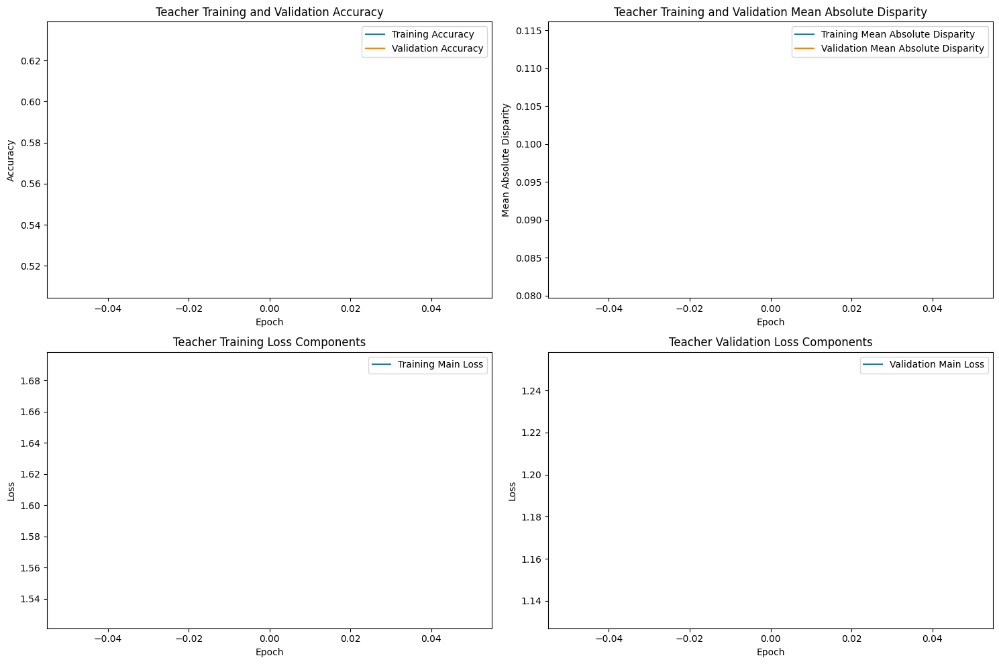

Epoch 2/200, Validation: 100%|█████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.89it/s]



TEACHER - Lambda 0 - Epoch 2 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.725965, VALIDATION Accuracy: 0.6480
TRAINING Disparity: 0.070098, VALIDATION Disparity: 0.1110
TRAINING Main Loss: 0.897341, VALIDATION Main Loss: 1.1673
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.07300566172296852
Class Celebration: Val Disparity = 0.11371237458193972
Class Parade: Val Disparity = -0.02726730633707375
Class Waiter_Or_Waitress: Val Disparity = 0.029166666666666674
Class Individual_Sports: Val Disparity = -0.13947163947163965
Class Surgeons: Val Disparity = -0.0880382775119617
Class Spa: Val Disparity = 0.20598006644518274
Class Law_Enforcement: Val Disparity = 0.008387445887445999
Class Business: Val Disparity = 0.21392268596950564
Class Dresses: Val Disparity = -0.31294964028776995
Class Water_Activities: Val Disparity = 0.15766550522648082
Class Picnic: Val Disparity = -0.01388888888888895
Class Rescue: Val Dispa

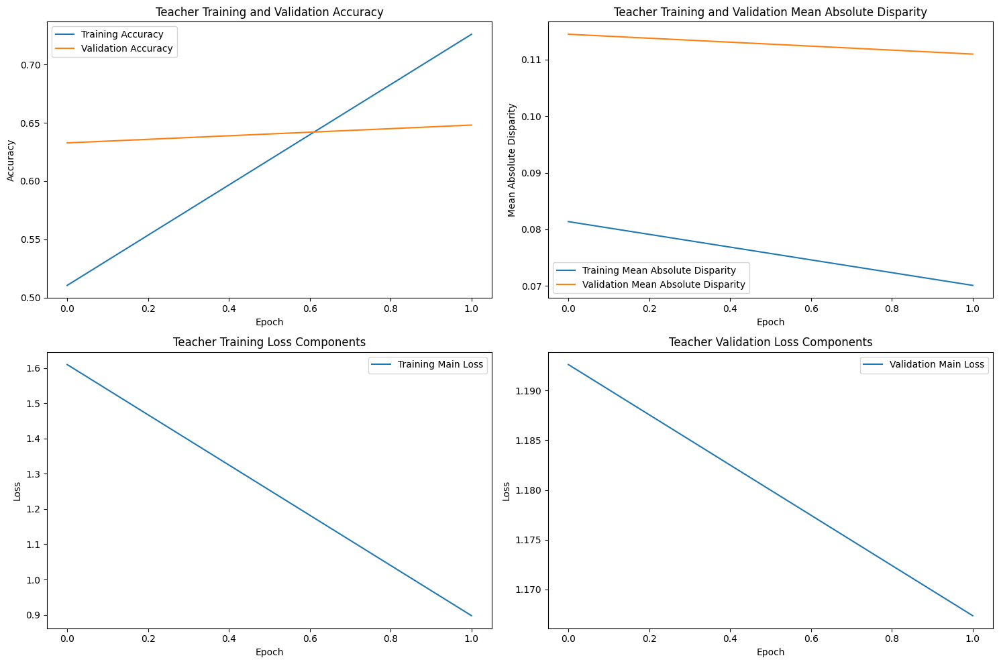

Epoch 3/200, Validation: 100%|█████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.87it/s]



TEACHER - Lambda 0 - Epoch 3 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.853800, VALIDATION Accuracy: 0.6342
TRAINING Disparity: 0.049956, VALIDATION Disparity: 0.0916
TRAINING Main Loss: 0.479917, VALIDATION Main Loss: 1.3427
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.07300566172296852
Class Celebration: Val Disparity = 0.11371237458193972
Class Parade: Val Disparity = -0.02726730633707375
Class Waiter_Or_Waitress: Val Disparity = 0.029166666666666674
Class Individual_Sports: Val Disparity = -0.13947163947163965
Class Surgeons: Val Disparity = -0.0880382775119617
Class Spa: Val Disparity = 0.20598006644518274
Class Law_Enforcement: Val Disparity = 0.008387445887445999
Class Business: Val Disparity = 0.21392268596950564
Class Dresses: Val Disparity = -0.31294964028776995
Class Water_Activities: Val Disparity = 0.15766550522648082
Class Picnic: Val Disparity = -0.01388888888888895
Class Rescue: Val Dispa

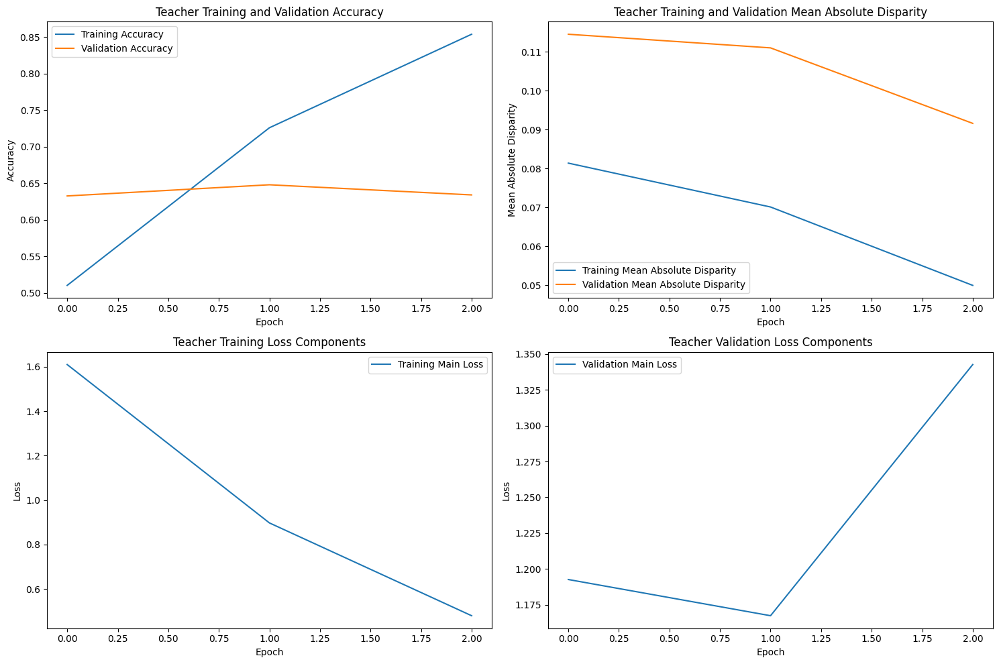

Epoch 4/200, Validation: 100%|█████████████████████████████████████████████████| 55/55 [00:18<00:00,  2.90it/s]



TEACHER - Lambda 0 - Epoch 4 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.920968, VALIDATION Accuracy: 0.6361
TRAINING Disparity: 0.028547, VALIDATION Disparity: 0.1157
TRAINING Main Loss: 0.258683, VALIDATION Main Loss: 1.4473
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.07300566172296852
Class Celebration: Val Disparity = 0.11371237458193972
Class Parade: Val Disparity = -0.02726730633707375
Class Waiter_Or_Waitress: Val Disparity = 0.029166666666666674
Class Individual_Sports: Val Disparity = -0.13947163947163965
Class Surgeons: Val Disparity = -0.0880382775119617
Class Spa: Val Disparity = 0.20598006644518274
Class Law_Enforcement: Val Disparity = 0.008387445887445999
Class Business: Val Disparity = 0.21392268596950564
Class Dresses: Val Disparity = -0.31294964028776995
Class Water_Activities: Val Disparity = 0.15766550522648082
Class Picnic: Val Disparity = -0.01388888888888895
Class Rescue: Val Dispa

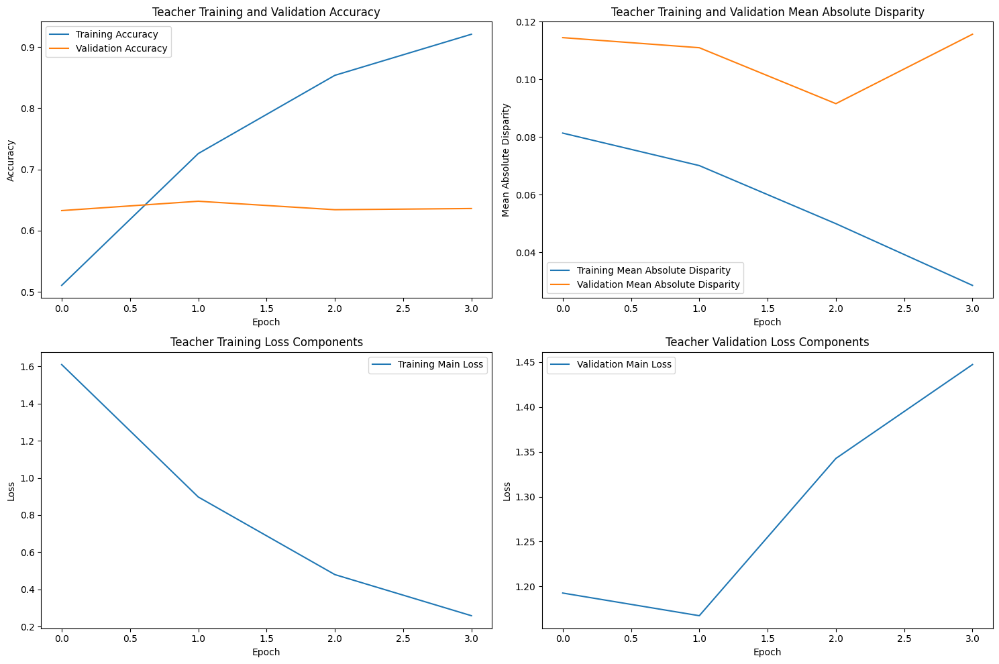

Epoch 5/200, Validation: 100%|█████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.81it/s]

Early stopping triggered at epoch 5
Finished Training TEACHER with lambda value of 0. Best epoch number: 2


In [17]:
# TEACHER
# Create dict to store best model states
teacher_model_states_best = {}

# Loop through the lambda_factor_list
for lambda_factor in teacher_lambda_factor_list:
    # Load EfficientNet B3 model for Teacher
    teacher = models.efficientnet_b3(pretrained=True)
    
    # Determine the number of output features from the feature extractor part of EfficientNet B3
    num_ftrs = teacher.classifier[1].in_features
    
    # Modify the classifier layer of the EfficientNet model to match number of classes
    teacher.classifier[1] = nn.Linear(num_ftrs, num_classes)
    
    teacher_optimizer = optim.Adam(teacher.parameters(), lr=teacher_learning_rate)
    teacher_loss_fn = nn.CrossEntropyLoss()

    # Train the model
    best_model_state = train_teacher(teacher, teacher_optimizer, teacher_loss_fn,
                                   teacher_patience, teacher_epochs, device, base_save_dir=base_save_dir)
    teacher_model_states_best[lambda_factor] = best_model_state

# Save the collective best model states to a file
teacher_collective_save_path = os.path.join(base_save_dir, 'teacher_model_states_best.pth')
torch.save(teacher_model_states_best, teacher_collective_save_path)


Training Student with Lambda Value of 0.5


Epoch 1/200, Validation: 100%|█████████████████████████████████████████████████| 55/55 [00:20<00:00,  2.67it/s]



STUDENT - Lambda 0.5 - Epoch 1 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.503356, VALIDATION Accuracy: 0.6000
TRAINING Disparity: 0.082727, VALIDATION Disparity: 0.1171
TRAINING Combined Loss: 0.171561, VALIDATION Combined Loss: 0.1287
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.18290712736693493
Class Celebration: Val Disparity = 0.0695837978446674
Class Parade: Val Disparity = -0.024990513362606492
Class Waiter_Or_Waitress: Val Disparity = 0.015624999999999889
Class Individual_Sports: Val Disparity = -0.16472416472416496
Class Surgeons: Val Disparity = 0.000956937799043156
Class Spa: Val Disparity = -0.14617940199335533
Class Law_Enforcement: Val Disparity = 0.06872294372294374
Class Business: Val Disparity = 0.26721084244571086
Class Dresses: Val Disparity = -0.36457892509521783
Class Water_Activities: Val Disparity = 0.07073170731707323
Class Picnic: Val Disparity = 0.04166666666666663
Class Rescue:

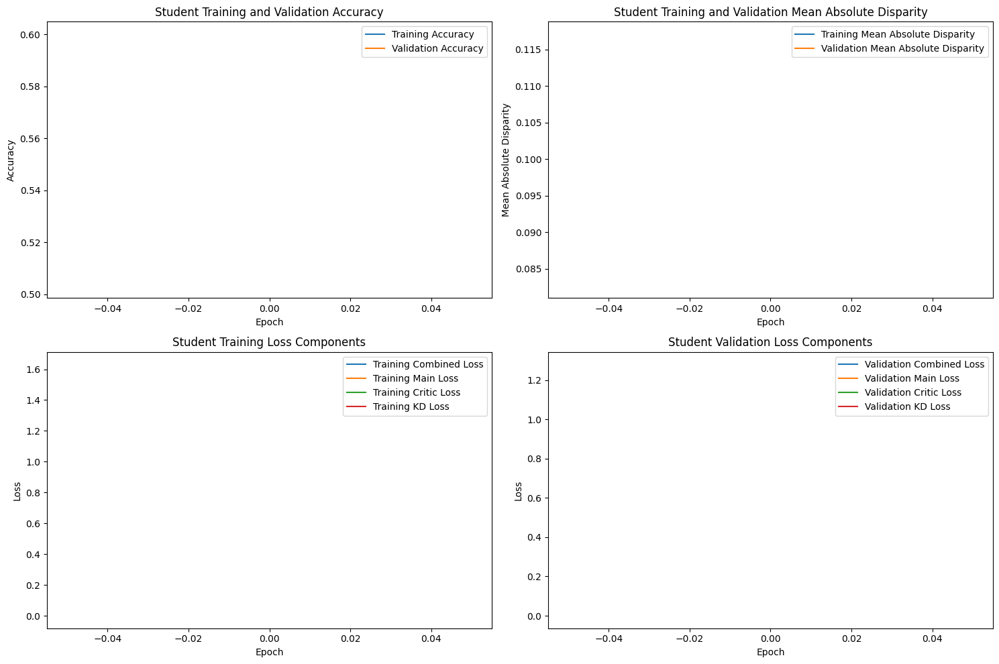

Epoch 2/200, Validation: 100%|█████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.76it/s]



STUDENT - Lambda 0.5 - Epoch 2 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.688310, VALIDATION Accuracy: 0.6344
TRAINING Disparity: 0.082651, VALIDATION Disparity: 0.1090
TRAINING Combined Loss: 0.103973, VALIDATION Combined Loss: 0.1224
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.059251604639993016
Class Celebration: Val Disparity = 0.09123002601263464
Class Parade: Val Disparity = -0.004607795305469509
Class Waiter_Or_Waitress: Val Disparity = -0.00520833333333337
Class Individual_Sports: Val Disparity = -0.13092463092463102
Class Surgeons: Val Disparity = -0.03732057416267942
Class Spa: Val Disparity = -0.0764119601328902
Class Law_Enforcement: Val Disparity = 0.10633116883116889
Class Business: Val Disparity = 0.34360080086246725
Class Dresses: Val Disparity = -0.36521371138383407
Class Water_Activities: Val Disparity = 0.06236933797909405
Class Picnic: Val Disparity = 0.05555555555555558
Class Rescue

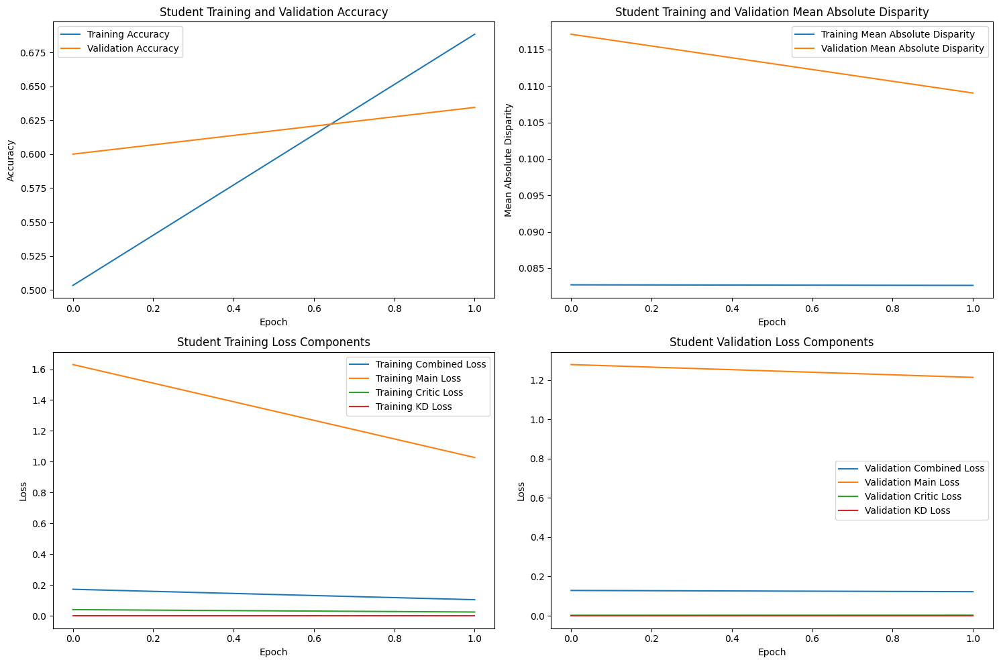

Epoch 3/200, Validation: 100%|█████████████████████████████████████████████████| 55/55 [00:20<00:00,  2.72it/s]



STUDENT - Lambda 0.5 - Epoch 3 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.793094, VALIDATION Accuracy: 0.6245
TRAINING Disparity: 0.064094, VALIDATION Disparity: 0.1026
TRAINING Combined Loss: 0.067734, VALIDATION Combined Loss: 0.1390
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.059251604639993016
Class Celebration: Val Disparity = 0.09123002601263464
Class Parade: Val Disparity = -0.004607795305469509
Class Waiter_Or_Waitress: Val Disparity = -0.00520833333333337
Class Individual_Sports: Val Disparity = -0.13092463092463102
Class Surgeons: Val Disparity = -0.03732057416267942
Class Spa: Val Disparity = -0.0764119601328902
Class Law_Enforcement: Val Disparity = 0.10633116883116889
Class Business: Val Disparity = 0.34360080086246725
Class Dresses: Val Disparity = -0.36521371138383407
Class Water_Activities: Val Disparity = 0.06236933797909405
Class Picnic: Val Disparity = 0.05555555555555558
Class Rescue

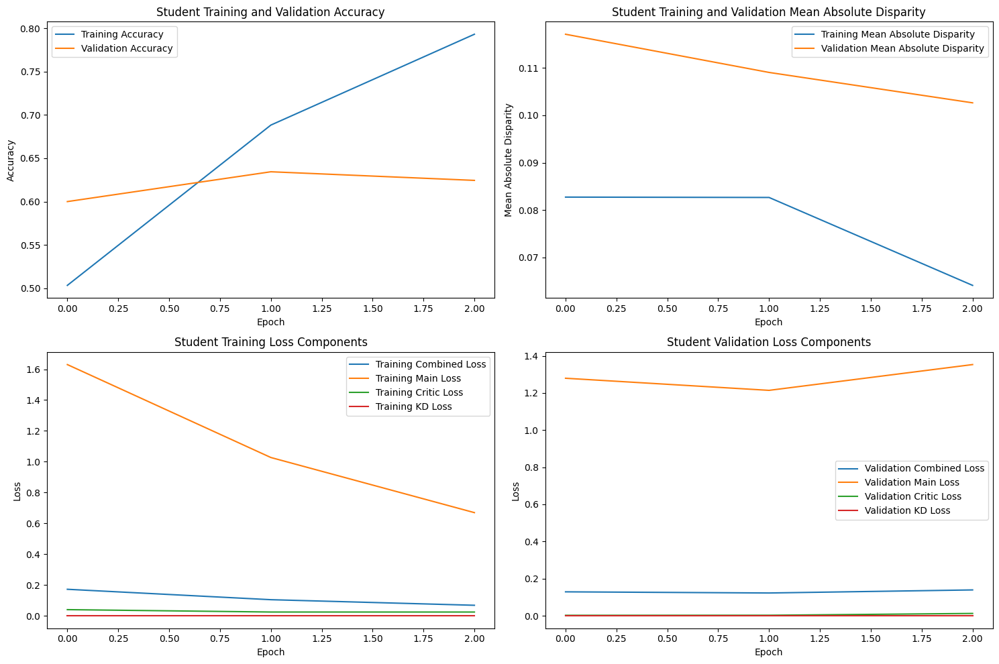

Epoch 4/200, Validation: 100%|█████████████████████████████████████████████████| 55/55 [00:21<00:00,  2.59it/s]



STUDENT - Lambda 0.5 - Epoch 4 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.867400, VALIDATION Accuracy: 0.6015
TRAINING Disparity: 0.045038, VALIDATION Disparity: 0.1024
TRAINING Combined Loss: 0.042682, VALIDATION Combined Loss: 0.1605
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.059251604639993016
Class Celebration: Val Disparity = 0.09123002601263464
Class Parade: Val Disparity = -0.004607795305469509
Class Waiter_Or_Waitress: Val Disparity = -0.00520833333333337
Class Individual_Sports: Val Disparity = -0.13092463092463102
Class Surgeons: Val Disparity = -0.03732057416267942
Class Spa: Val Disparity = -0.0764119601328902
Class Law_Enforcement: Val Disparity = 0.10633116883116889
Class Business: Val Disparity = 0.34360080086246725
Class Dresses: Val Disparity = -0.36521371138383407
Class Water_Activities: Val Disparity = 0.06236933797909405
Class Picnic: Val Disparity = 0.05555555555555558
Class Rescue

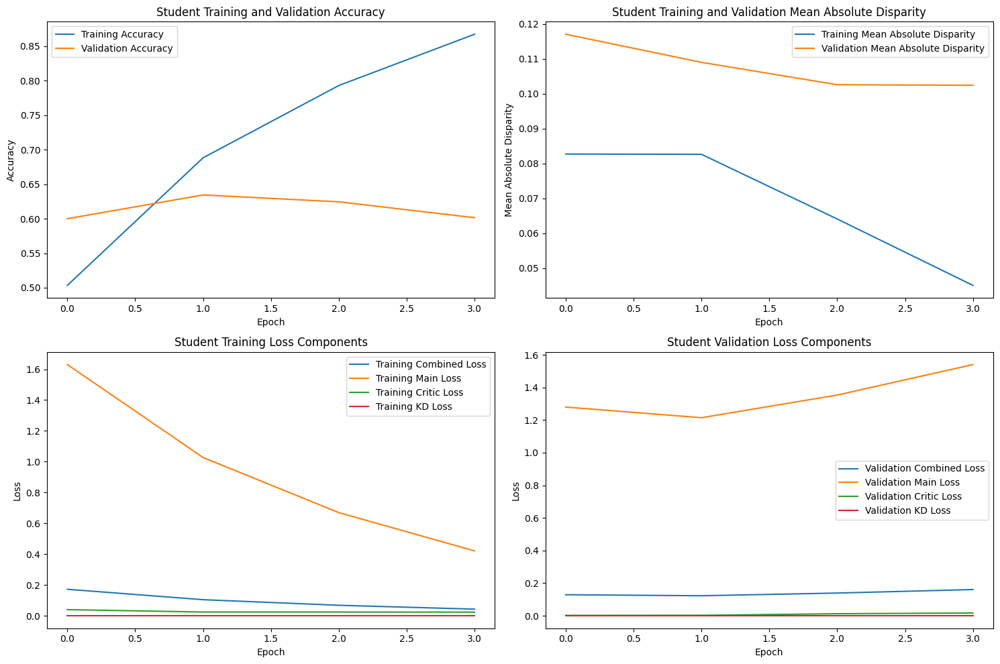

Epoch 5/200, Validation: 100%|█████████████████████████████████████████████████| 55/55 [00:20<00:00,  2.69it/s]



STUDENT - Lambda 0.5 - Epoch 5 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.898708, VALIDATION Accuracy: 0.6211
TRAINING Disparity: 0.039098, VALIDATION Disparity: 0.1163
TRAINING Combined Loss: 0.031499, VALIDATION Combined Loss: 0.1697
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.059251604639993016
Class Celebration: Val Disparity = 0.09123002601263464
Class Parade: Val Disparity = -0.004607795305469509
Class Waiter_Or_Waitress: Val Disparity = -0.00520833333333337
Class Individual_Sports: Val Disparity = -0.13092463092463102
Class Surgeons: Val Disparity = -0.03732057416267942
Class Spa: Val Disparity = -0.0764119601328902
Class Law_Enforcement: Val Disparity = 0.10633116883116889
Class Business: Val Disparity = 0.34360080086246725
Class Dresses: Val Disparity = -0.36521371138383407
Class Water_Activities: Val Disparity = 0.06236933797909405
Class Picnic: Val Disparity = 0.05555555555555558
Class Rescue

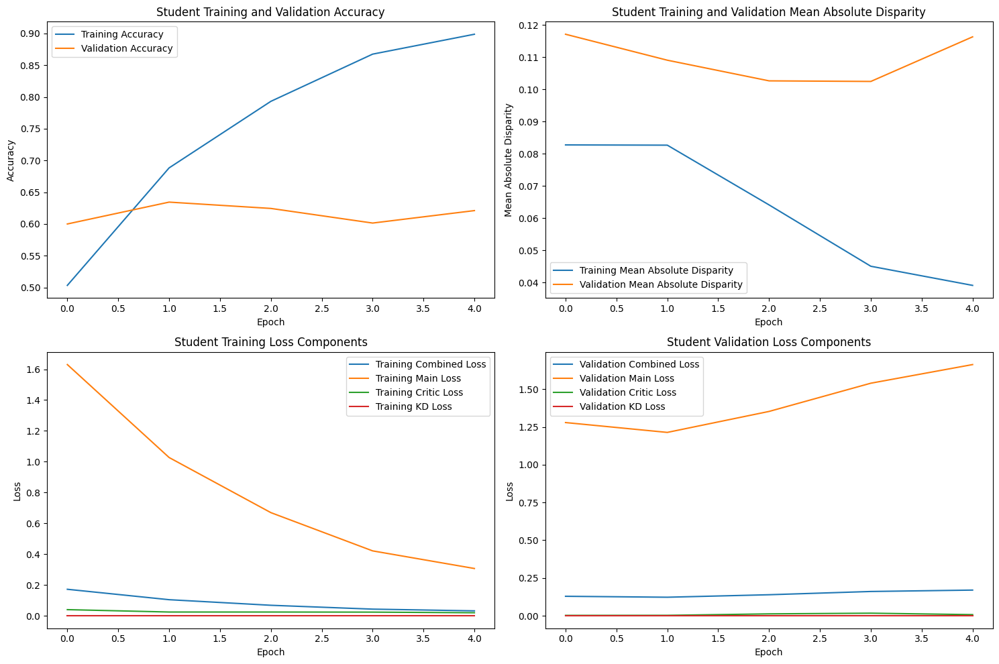

Epoch 6/200, Validation: 100%|█████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.81it/s]



STUDENT - Lambda 0.5 - Epoch 6 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.925617, VALIDATION Accuracy: 0.6066
TRAINING Disparity: 0.021446, VALIDATION Disparity: 0.1134
TRAINING Combined Loss: 0.023132, VALIDATION Combined Loss: 0.1964
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.059251604639993016
Class Celebration: Val Disparity = 0.09123002601263464
Class Parade: Val Disparity = -0.004607795305469509
Class Waiter_Or_Waitress: Val Disparity = -0.00520833333333337
Class Individual_Sports: Val Disparity = -0.13092463092463102
Class Surgeons: Val Disparity = -0.03732057416267942
Class Spa: Val Disparity = -0.0764119601328902
Class Law_Enforcement: Val Disparity = 0.10633116883116889
Class Business: Val Disparity = 0.34360080086246725
Class Dresses: Val Disparity = -0.36521371138383407
Class Water_Activities: Val Disparity = 0.06236933797909405
Class Picnic: Val Disparity = 0.05555555555555558
Class Rescue

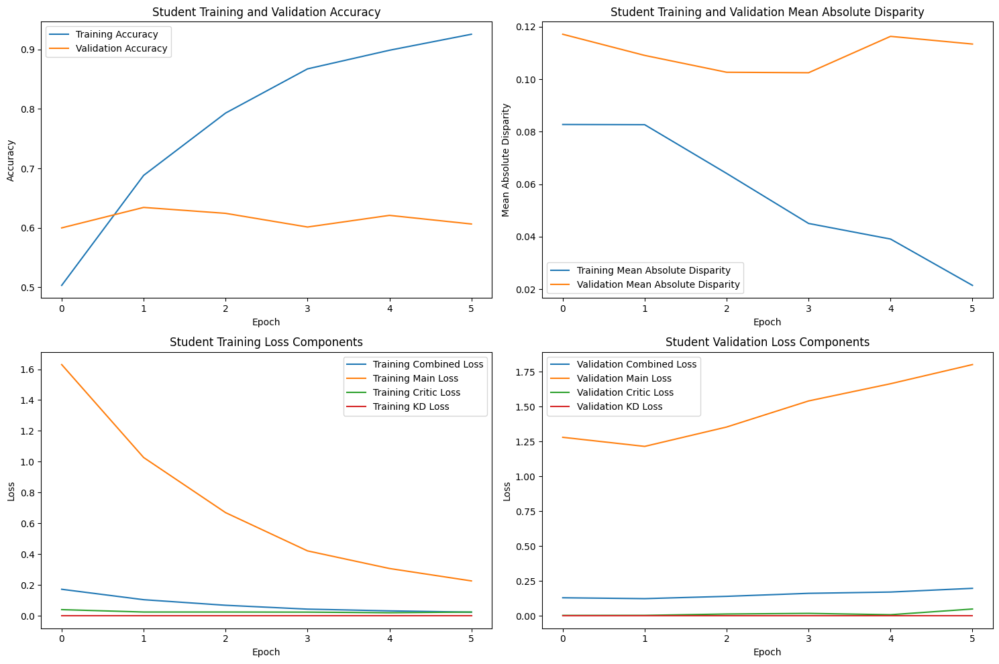

Epoch 7/200, Validation: 100%|█████████████████████████████████████████████████| 55/55 [00:20<00:00,  2.66it/s]



STUDENT - Lambda 0.5 - Epoch 7 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.946142, VALIDATION Accuracy: 0.6194
TRAINING Disparity: 0.022676, VALIDATION Disparity: 0.1023
TRAINING Combined Loss: 0.017026, VALIDATION Combined Loss: 0.1870
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.059251604639993016
Class Celebration: Val Disparity = 0.09123002601263464
Class Parade: Val Disparity = -0.004607795305469509
Class Waiter_Or_Waitress: Val Disparity = -0.00520833333333337
Class Individual_Sports: Val Disparity = -0.13092463092463102
Class Surgeons: Val Disparity = -0.03732057416267942
Class Spa: Val Disparity = -0.0764119601328902
Class Law_Enforcement: Val Disparity = 0.10633116883116889
Class Business: Val Disparity = 0.34360080086246725
Class Dresses: Val Disparity = -0.36521371138383407
Class Water_Activities: Val Disparity = 0.06236933797909405
Class Picnic: Val Disparity = 0.05555555555555558
Class Rescue

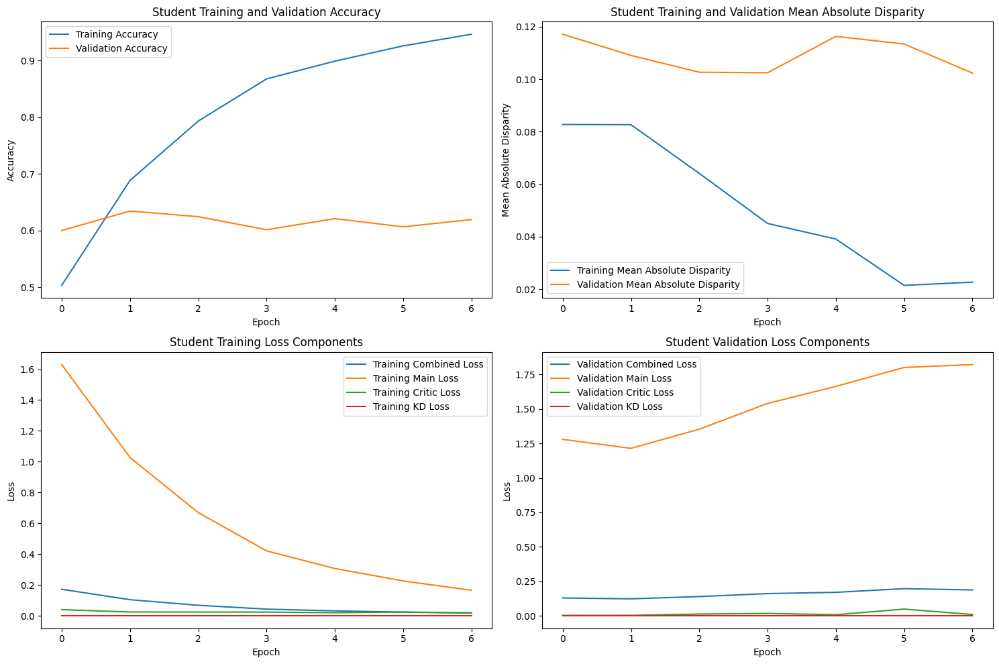

Epoch 8/200, Validation: 100%|█████████████████████████████████████████████████| 55/55 [00:20<00:00,  2.66it/s]



STUDENT - Lambda 0.5 - Epoch 8 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.946586, VALIDATION Accuracy: 0.6168
TRAINING Disparity: 0.025639, VALIDATION Disparity: 0.1088
TRAINING Combined Loss: 0.016070, VALIDATION Combined Loss: 0.2102
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.059251604639993016
Class Celebration: Val Disparity = 0.09123002601263464
Class Parade: Val Disparity = -0.004607795305469509
Class Waiter_Or_Waitress: Val Disparity = -0.00520833333333337
Class Individual_Sports: Val Disparity = -0.13092463092463102
Class Surgeons: Val Disparity = -0.03732057416267942
Class Spa: Val Disparity = -0.0764119601328902
Class Law_Enforcement: Val Disparity = 0.10633116883116889
Class Business: Val Disparity = 0.34360080086246725
Class Dresses: Val Disparity = -0.36521371138383407
Class Water_Activities: Val Disparity = 0.06236933797909405
Class Picnic: Val Disparity = 0.05555555555555558
Class Rescue

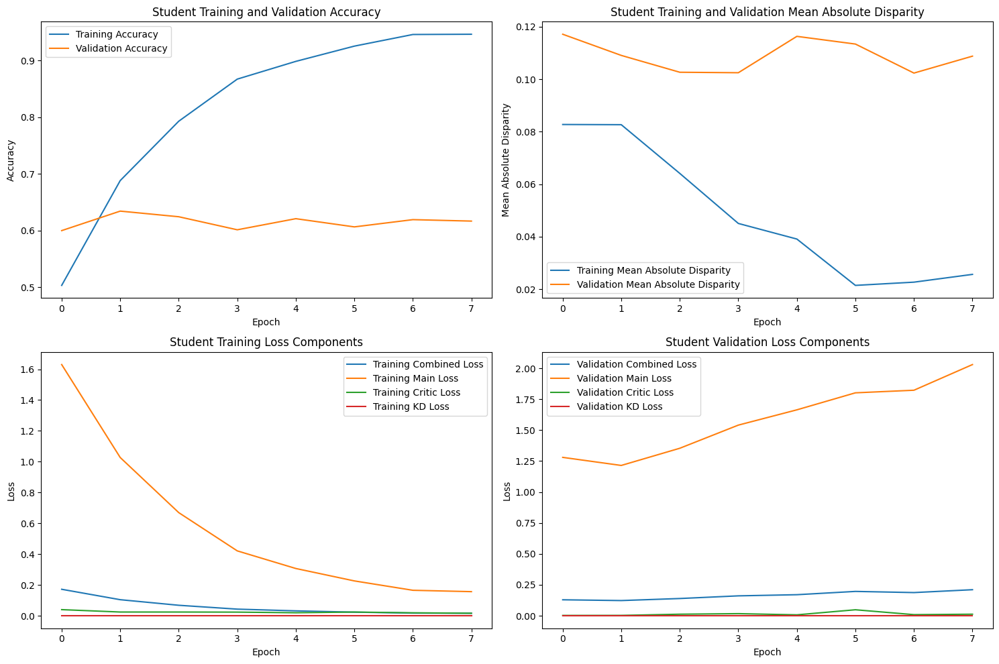

Epoch 9/200, Validation: 100%|█████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.84it/s]



STUDENT - Lambda 0.5 - Epoch 9 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.972975, VALIDATION Accuracy: 0.6402
TRAINING Disparity: 0.013689, VALIDATION Disparity: 0.0810
TRAINING Combined Loss: 0.009233, VALIDATION Combined Loss: 0.1822
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.059251604639993016
Class Celebration: Val Disparity = 0.09123002601263464
Class Parade: Val Disparity = -0.004607795305469509
Class Waiter_Or_Waitress: Val Disparity = -0.00520833333333337
Class Individual_Sports: Val Disparity = -0.13092463092463102
Class Surgeons: Val Disparity = -0.03732057416267942
Class Spa: Val Disparity = -0.0764119601328902
Class Law_Enforcement: Val Disparity = 0.10633116883116889
Class Business: Val Disparity = 0.34360080086246725
Class Dresses: Val Disparity = -0.36521371138383407
Class Water_Activities: Val Disparity = 0.06236933797909405
Class Picnic: Val Disparity = 0.05555555555555558
Class Rescue

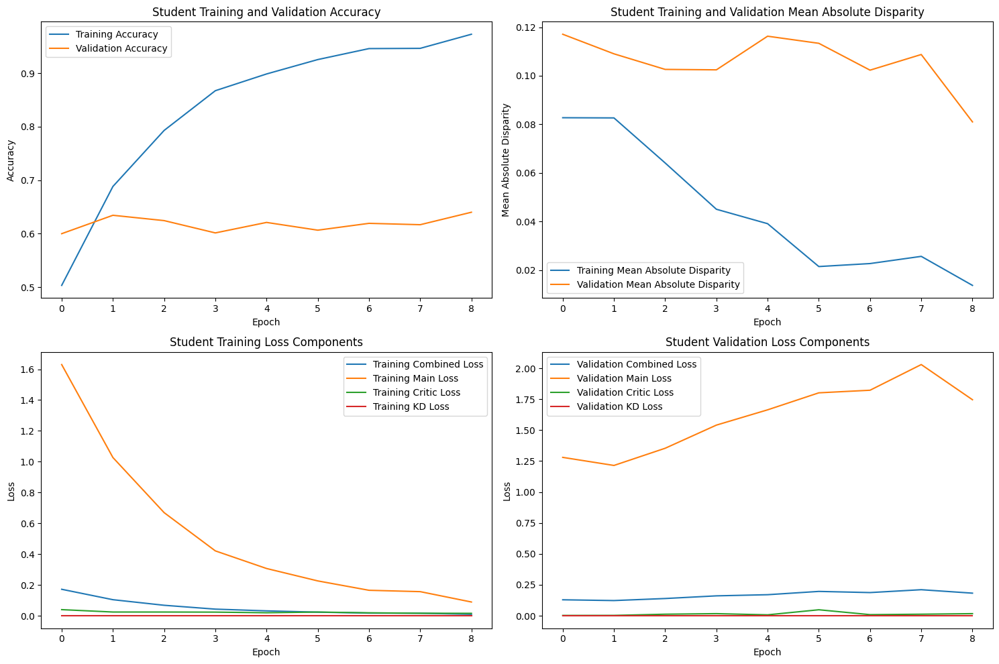

Epoch 10/200, Validation: 100%|████████████████████████████████████████████████| 55/55 [00:20<00:00,  2.73it/s]



STUDENT - Lambda 0.5 - Epoch 10 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.988812, VALIDATION Accuracy: 0.6530
TRAINING Disparity: 0.009039, VALIDATION Disparity: 0.0933
TRAINING Combined Loss: 0.004415, VALIDATION Combined Loss: 0.1821
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.059251604639993016
Class Celebration: Val Disparity = 0.09123002601263464
Class Parade: Val Disparity = -0.004607795305469509
Class Waiter_Or_Waitress: Val Disparity = -0.00520833333333337
Class Individual_Sports: Val Disparity = -0.13092463092463102
Class Surgeons: Val Disparity = -0.03732057416267942
Class Spa: Val Disparity = -0.0764119601328902
Class Law_Enforcement: Val Disparity = 0.10633116883116889
Class Business: Val Disparity = 0.34360080086246725
Class Dresses: Val Disparity = -0.36521371138383407
Class Water_Activities: Val Disparity = 0.06236933797909405
Class Picnic: Val Disparity = 0.05555555555555558
Class Rescu

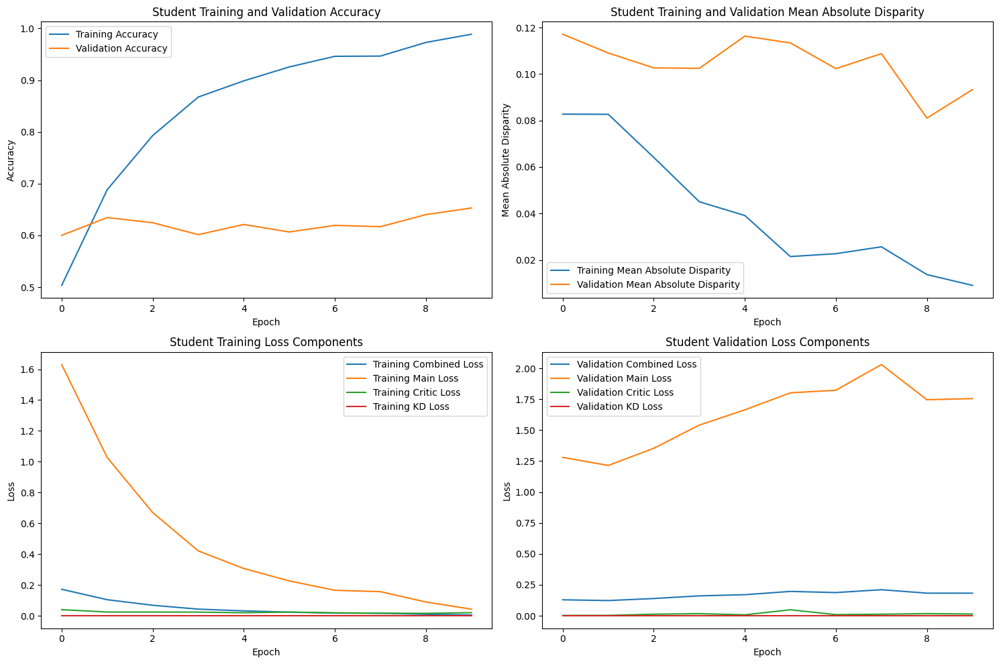

Epoch 11/200, Validation: 100%|████████████████████████████████████████████████| 55/55 [00:20<00:00,  2.74it/s]



STUDENT - Lambda 0.5 - Epoch 11 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.991127, VALIDATION Accuracy: 0.6535
TRAINING Disparity: 0.008755, VALIDATION Disparity: 0.0801
TRAINING Combined Loss: 0.003392, VALIDATION Combined Loss: 0.1808
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.059251604639993016
Class Celebration: Val Disparity = 0.09123002601263464
Class Parade: Val Disparity = -0.004607795305469509
Class Waiter_Or_Waitress: Val Disparity = -0.00520833333333337
Class Individual_Sports: Val Disparity = -0.13092463092463102
Class Surgeons: Val Disparity = -0.03732057416267942
Class Spa: Val Disparity = -0.0764119601328902
Class Law_Enforcement: Val Disparity = 0.10633116883116889
Class Business: Val Disparity = 0.34360080086246725
Class Dresses: Val Disparity = -0.36521371138383407
Class Water_Activities: Val Disparity = 0.06236933797909405
Class Picnic: Val Disparity = 0.05555555555555558
Class Rescu

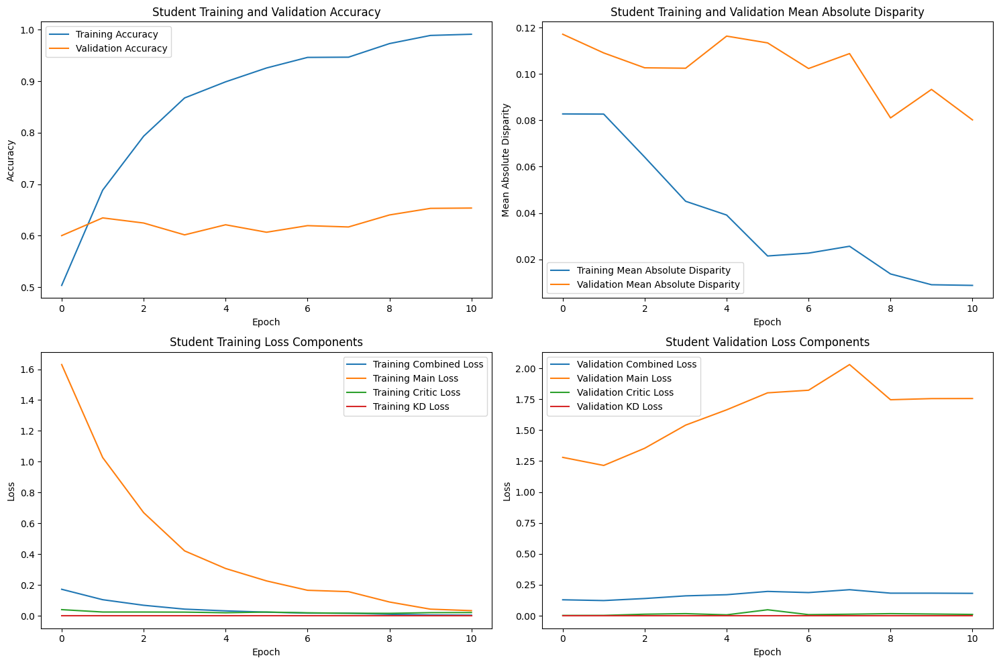

Epoch 12/200, Validation: 100%|████████████████████████████████████████████████| 55/55 [00:20<00:00,  2.75it/s]


Early stopping triggered at epoch 12
Finished Training STUDENT with lambda value of 0.5. Best epoch number: 2
Training Student with Lambda Value of 1


Epoch 1/200, Validation: 100%|█████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.76it/s]



STUDENT - Lambda 1 - Epoch 1 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.478221, VALIDATION Accuracy: 0.6026
TRAINING Disparity: 0.071620, VALIDATION Disparity: 0.1137
TRAINING Combined Loss: 0.187742, VALIDATION Combined Loss: 0.1284
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.07636776456547378
Class Celebration: Val Disparity = 0.14646042363433653
Class Parade: Val Disparity = -0.06131078224101483
Class Waiter_Or_Waitress: Val Disparity = 0.06875000000000009
Class Individual_Sports: Val Disparity = -0.11499611499611495
Class Surgeons: Val Disparity = 0.04976076555023923
Class Spa: Val Disparity = -0.05315614617940212
Class Law_Enforcement: Val Disparity = 0.07115800865800881
Class Business: Val Disparity = 0.2572000616048053
Class Dresses: Val Disparity = -0.3063901819720696
Class Water_Activities: Val Disparity = 0.029616724738676048
Class Picnic: Val Disparity = -0.09722222222222227
Class Rescue: Val

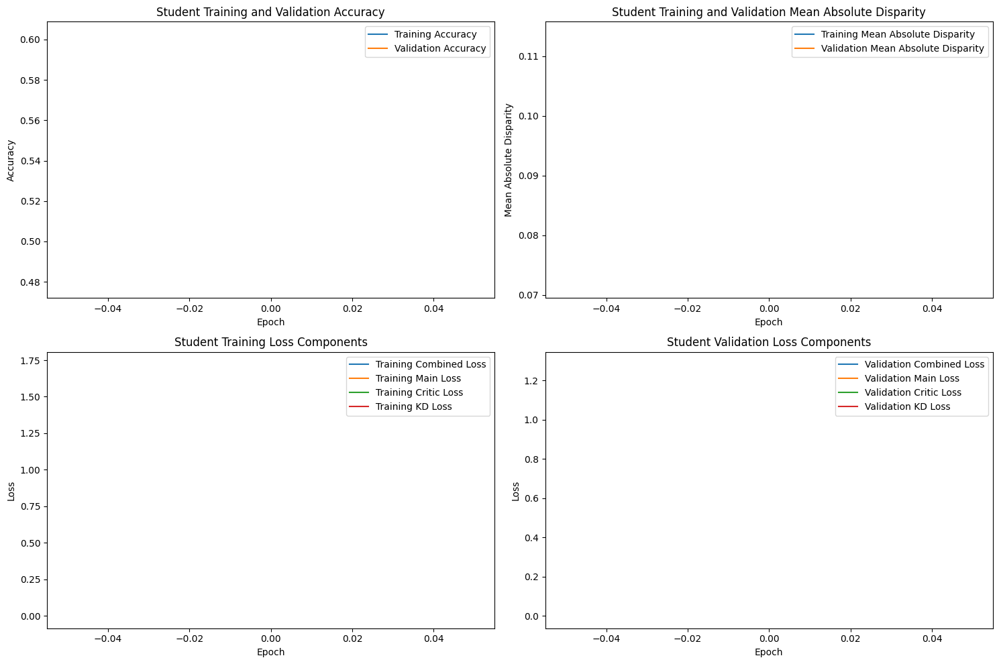

Epoch 2/200, Validation: 100%|█████████████████████████████████████████████████| 55/55 [00:20<00:00,  2.69it/s]



STUDENT - Lambda 1 - Epoch 2 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.661381, VALIDATION Accuracy: 0.6271
TRAINING Disparity: 0.084794, VALIDATION Disparity: 0.0958
TRAINING Combined Loss: 0.112474, VALIDATION Combined Loss: 0.1231
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.05514721935173983
Class Celebration: Val Disparity = 0.12156261612783348
Class Parade: Val Disparity = -0.009920312245893625
Class Waiter_Or_Waitress: Val Disparity = 0.029166666666666674
Class Individual_Sports: Val Disparity = -0.08935508935508929
Class Surgeons: Val Disparity = -0.15502392344497606
Class Spa: Val Disparity = 0.04318936877076418
Class Law_Enforcement: Val Disparity = 0.04247835497835495
Class Business: Val Disparity = 0.19066687201601723
Class Dresses: Val Disparity = -0.3939906898011003
Class Water_Activities: Val Disparity = 0.04790940766550533
Class Picnic: Val Disparity = -0.05555555555555558
Class Rescue: V

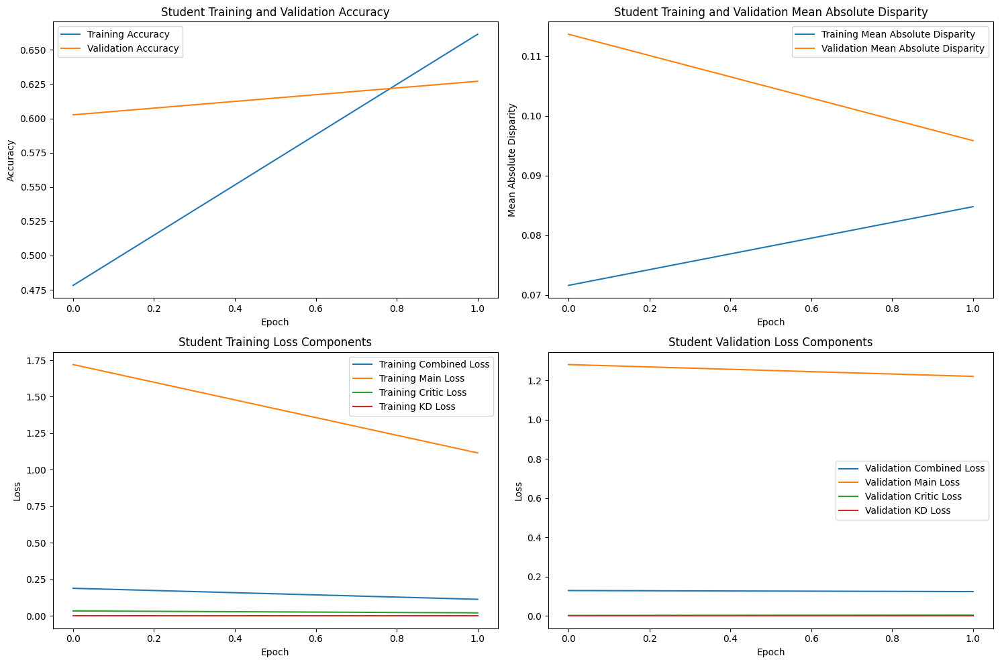

Epoch 3/200, Validation: 100%|█████████████████████████████████████████████████| 55/55 [00:20<00:00,  2.72it/s]



STUDENT - Lambda 1 - Epoch 3 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.760031, VALIDATION Accuracy: 0.6271
TRAINING Disparity: 0.077248, VALIDATION Disparity: 0.1252
TRAINING Combined Loss: 0.078758, VALIDATION Combined Loss: 0.1318
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.05514721935173983
Class Celebration: Val Disparity = 0.12156261612783348
Class Parade: Val Disparity = -0.009920312245893625
Class Waiter_Or_Waitress: Val Disparity = 0.029166666666666674
Class Individual_Sports: Val Disparity = -0.08935508935508929
Class Surgeons: Val Disparity = -0.15502392344497606
Class Spa: Val Disparity = 0.04318936877076418
Class Law_Enforcement: Val Disparity = 0.04247835497835495
Class Business: Val Disparity = 0.19066687201601723
Class Dresses: Val Disparity = -0.3939906898011003
Class Water_Activities: Val Disparity = 0.04790940766550533
Class Picnic: Val Disparity = -0.05555555555555558
Class Rescue: V

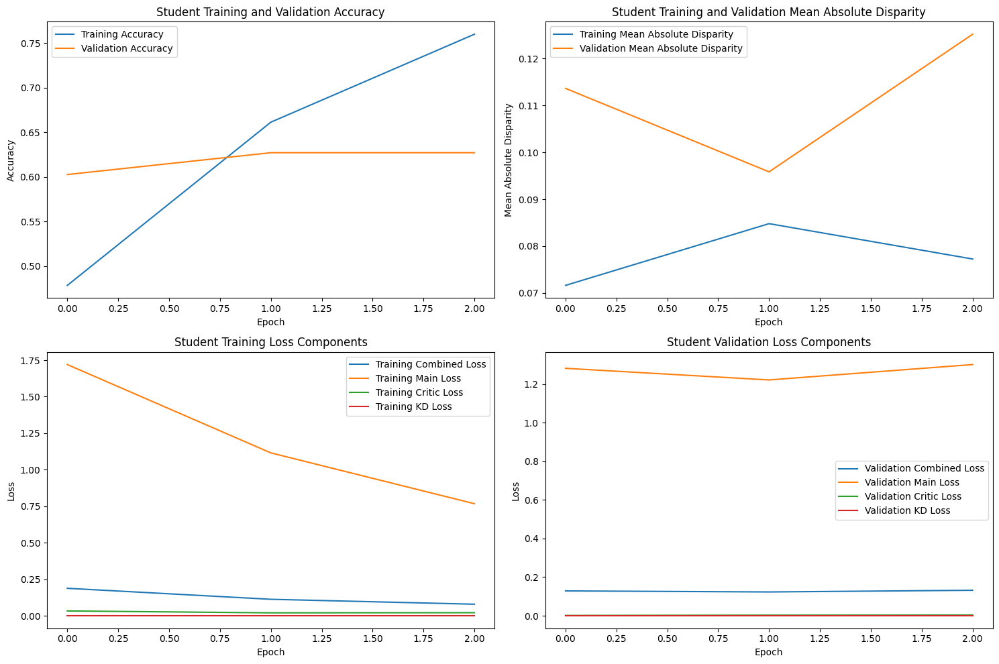

Epoch 4/200, Validation: 100%|█████████████████████████████████████████████████| 55/55 [00:20<00:00,  2.69it/s]



STUDENT - Lambda 1 - Epoch 4 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.846065, VALIDATION Accuracy: 0.6174
TRAINING Disparity: 0.059021, VALIDATION Disparity: 0.0967
TRAINING Combined Loss: 0.051598, VALIDATION Combined Loss: 0.1508
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.05514721935173983
Class Celebration: Val Disparity = 0.12156261612783348
Class Parade: Val Disparity = -0.009920312245893625
Class Waiter_Or_Waitress: Val Disparity = 0.029166666666666674
Class Individual_Sports: Val Disparity = -0.08935508935508929
Class Surgeons: Val Disparity = -0.15502392344497606
Class Spa: Val Disparity = 0.04318936877076418
Class Law_Enforcement: Val Disparity = 0.04247835497835495
Class Business: Val Disparity = 0.19066687201601723
Class Dresses: Val Disparity = -0.3939906898011003
Class Water_Activities: Val Disparity = 0.04790940766550533
Class Picnic: Val Disparity = -0.05555555555555558
Class Rescue: V

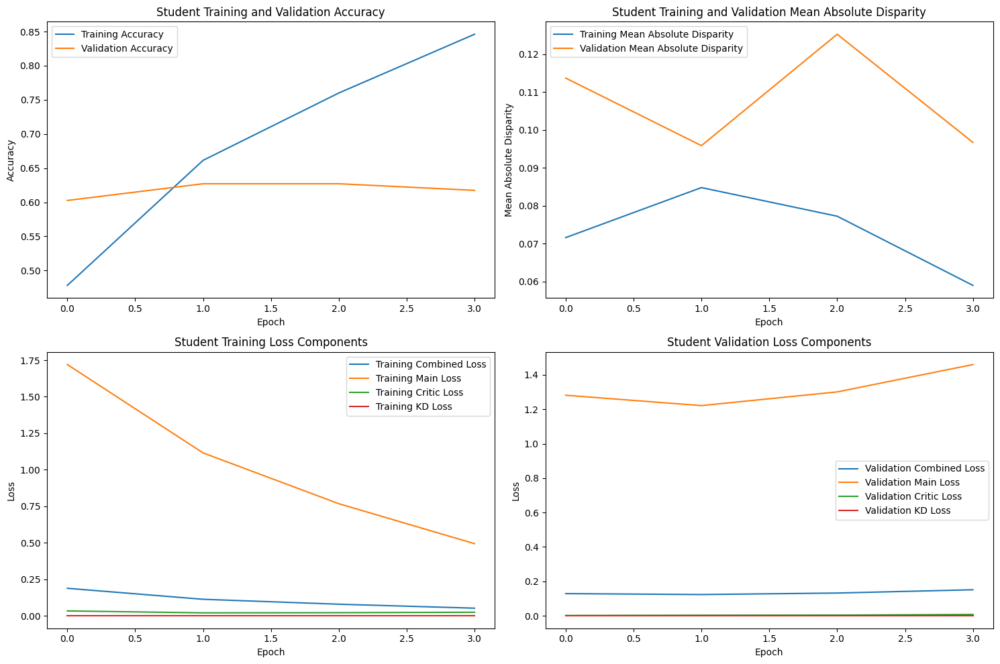

Epoch 5/200, Validation: 100%|█████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.77it/s]



STUDENT - Lambda 1 - Epoch 5 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.888715, VALIDATION Accuracy: 0.6126
TRAINING Disparity: 0.041807, VALIDATION Disparity: 0.0677
TRAINING Combined Loss: 0.035381, VALIDATION Combined Loss: 0.1622
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.05514721935173983
Class Celebration: Val Disparity = 0.12156261612783348
Class Parade: Val Disparity = -0.009920312245893625
Class Waiter_Or_Waitress: Val Disparity = 0.029166666666666674
Class Individual_Sports: Val Disparity = -0.08935508935508929
Class Surgeons: Val Disparity = -0.15502392344497606
Class Spa: Val Disparity = 0.04318936877076418
Class Law_Enforcement: Val Disparity = 0.04247835497835495
Class Business: Val Disparity = 0.19066687201601723
Class Dresses: Val Disparity = -0.3939906898011003
Class Water_Activities: Val Disparity = 0.04790940766550533
Class Picnic: Val Disparity = -0.05555555555555558
Class Rescue: V

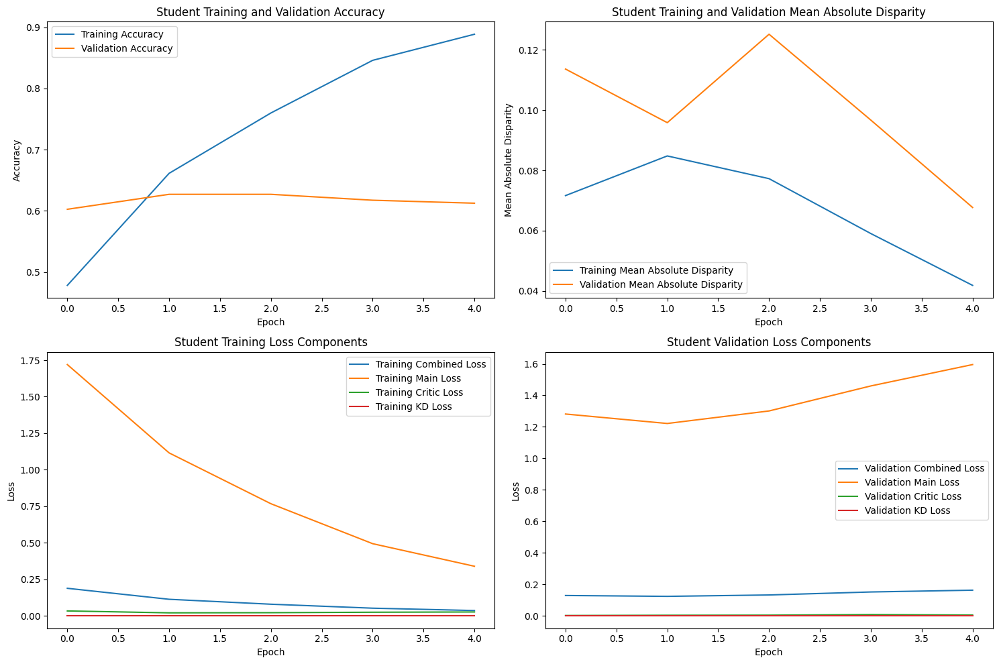

Epoch 6/200, Validation: 100%|█████████████████████████████████████████████████| 55/55 [00:20<00:00,  2.74it/s]



STUDENT - Lambda 1 - Epoch 6 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.924363, VALIDATION Accuracy: 0.6041
TRAINING Disparity: 0.026603, VALIDATION Disparity: 0.0798
TRAINING Combined Loss: 0.025192, VALIDATION Combined Loss: 0.1727
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.05514721935173983
Class Celebration: Val Disparity = 0.12156261612783348
Class Parade: Val Disparity = -0.009920312245893625
Class Waiter_Or_Waitress: Val Disparity = 0.029166666666666674
Class Individual_Sports: Val Disparity = -0.08935508935508929
Class Surgeons: Val Disparity = -0.15502392344497606
Class Spa: Val Disparity = 0.04318936877076418
Class Law_Enforcement: Val Disparity = 0.04247835497835495
Class Business: Val Disparity = 0.19066687201601723
Class Dresses: Val Disparity = -0.3939906898011003
Class Water_Activities: Val Disparity = 0.04790940766550533
Class Picnic: Val Disparity = -0.05555555555555558
Class Rescue: V

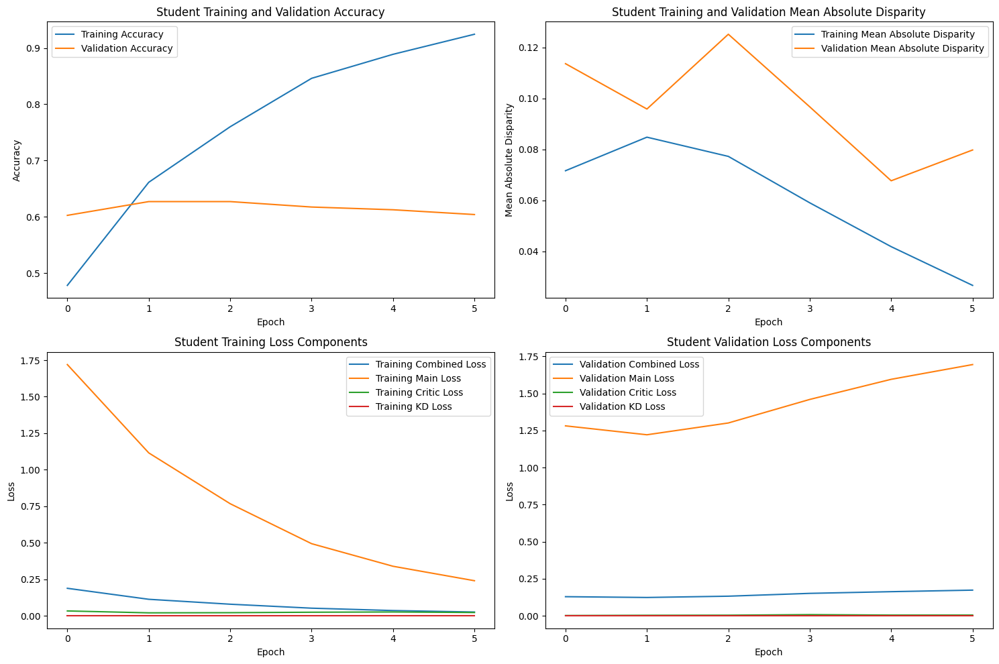

Epoch 7/200, Validation: 100%|█████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.77it/s]



STUDENT - Lambda 1 - Epoch 7 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.935050, VALIDATION Accuracy: 0.6268
TRAINING Disparity: 0.021128, VALIDATION Disparity: 0.0935
TRAINING Combined Loss: 0.020311, VALIDATION Combined Loss: 0.1859
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.05514721935173983
Class Celebration: Val Disparity = 0.12156261612783348
Class Parade: Val Disparity = -0.009920312245893625
Class Waiter_Or_Waitress: Val Disparity = 0.029166666666666674
Class Individual_Sports: Val Disparity = -0.08935508935508929
Class Surgeons: Val Disparity = -0.15502392344497606
Class Spa: Val Disparity = 0.04318936877076418
Class Law_Enforcement: Val Disparity = 0.04247835497835495
Class Business: Val Disparity = 0.19066687201601723
Class Dresses: Val Disparity = -0.3939906898011003
Class Water_Activities: Val Disparity = 0.04790940766550533
Class Picnic: Val Disparity = -0.05555555555555558
Class Rescue: V

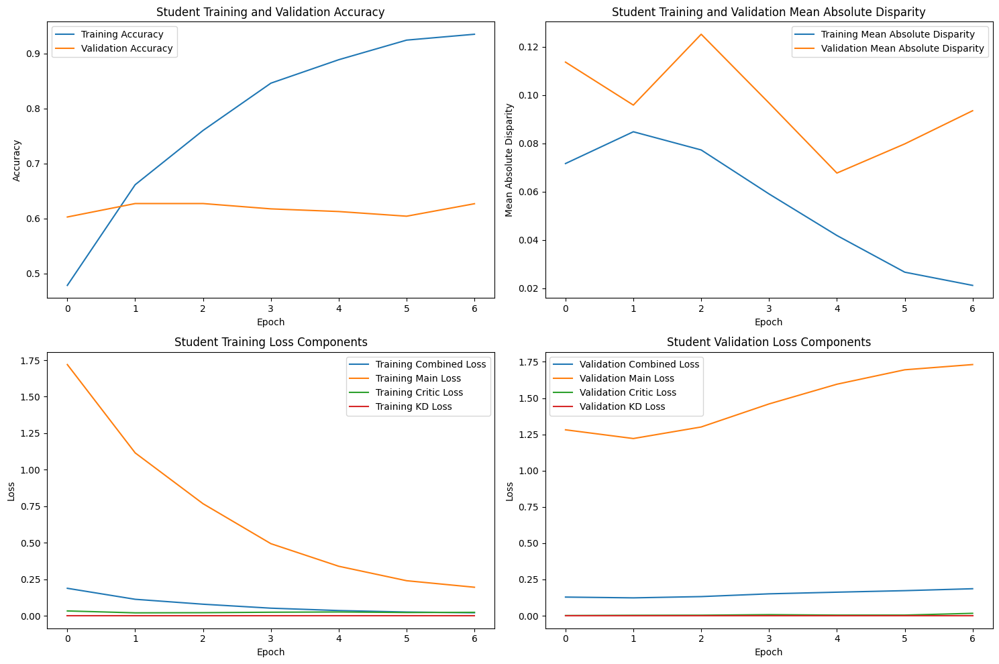

Epoch 8/200, Validation: 100%|█████████████████████████████████████████████████| 55/55 [00:20<00:00,  2.65it/s]



STUDENT - Lambda 1 - Epoch 8 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.942728, VALIDATION Accuracy: 0.6129
TRAINING Disparity: 0.030615, VALIDATION Disparity: 0.0947
TRAINING Combined Loss: 0.018770, VALIDATION Combined Loss: 0.2078
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.05514721935173983
Class Celebration: Val Disparity = 0.12156261612783348
Class Parade: Val Disparity = -0.009920312245893625
Class Waiter_Or_Waitress: Val Disparity = 0.029166666666666674
Class Individual_Sports: Val Disparity = -0.08935508935508929
Class Surgeons: Val Disparity = -0.15502392344497606
Class Spa: Val Disparity = 0.04318936877076418
Class Law_Enforcement: Val Disparity = 0.04247835497835495
Class Business: Val Disparity = 0.19066687201601723
Class Dresses: Val Disparity = -0.3939906898011003
Class Water_Activities: Val Disparity = 0.04790940766550533
Class Picnic: Val Disparity = -0.05555555555555558
Class Rescue: V

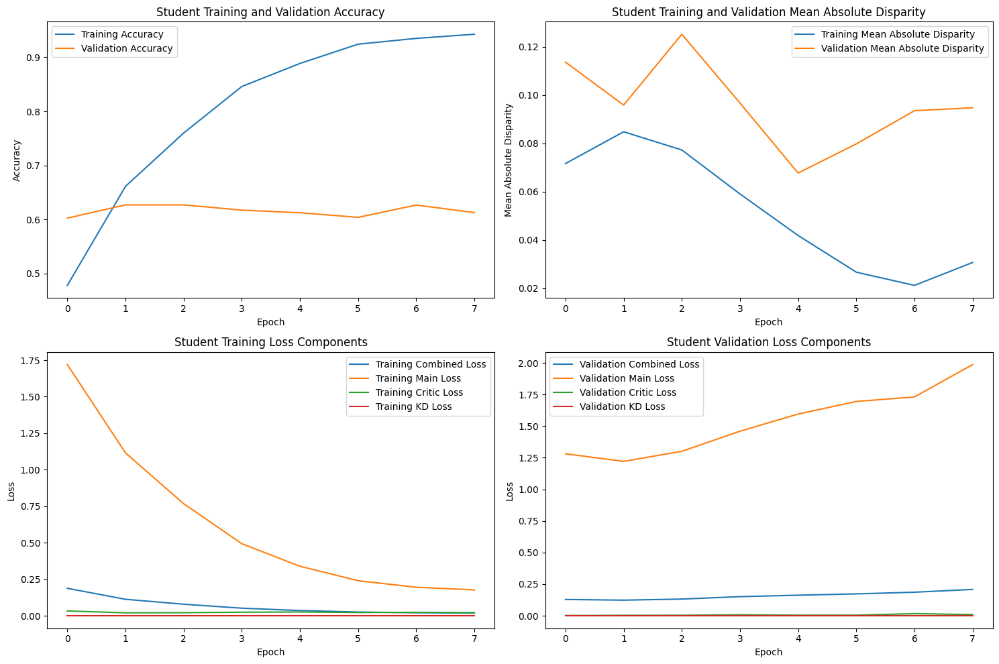

Epoch 9/200, Validation: 100%|█████████████████████████████████████████████████| 55/55 [00:20<00:00,  2.71it/s]



STUDENT - Lambda 1 - Epoch 9 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.970081, VALIDATION Accuracy: 0.6467
TRAINING Disparity: 0.016869, VALIDATION Disparity: 0.0922
TRAINING Combined Loss: 0.009639, VALIDATION Combined Loss: 0.1882
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.05514721935173983
Class Celebration: Val Disparity = 0.12156261612783348
Class Parade: Val Disparity = -0.009920312245893625
Class Waiter_Or_Waitress: Val Disparity = 0.029166666666666674
Class Individual_Sports: Val Disparity = -0.08935508935508929
Class Surgeons: Val Disparity = -0.15502392344497606
Class Spa: Val Disparity = 0.04318936877076418
Class Law_Enforcement: Val Disparity = 0.04247835497835495
Class Business: Val Disparity = 0.19066687201601723
Class Dresses: Val Disparity = -0.3939906898011003
Class Water_Activities: Val Disparity = 0.04790940766550533
Class Picnic: Val Disparity = -0.05555555555555558
Class Rescue: V

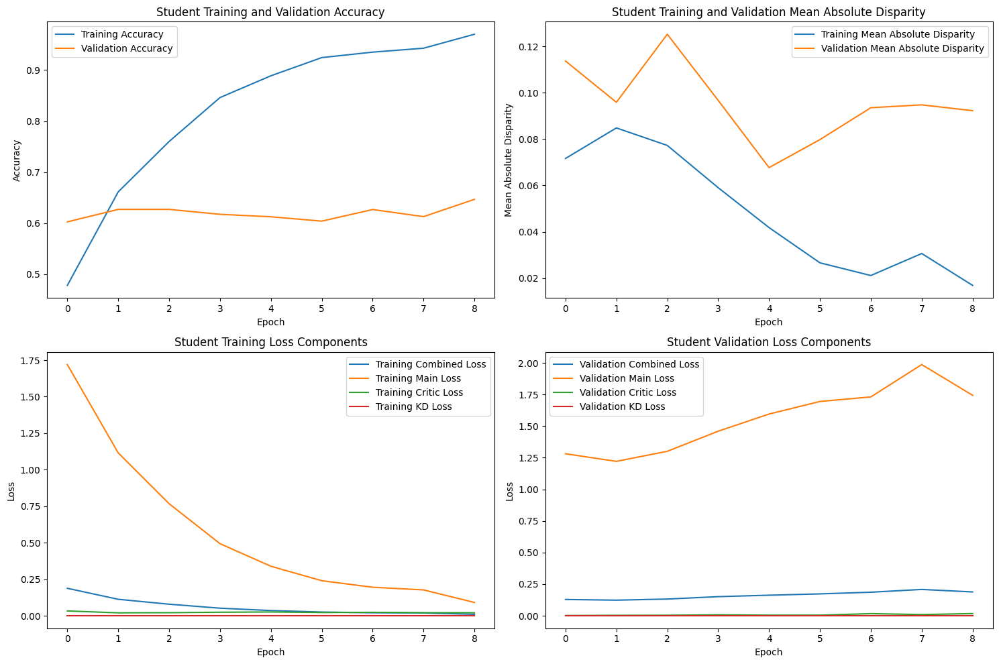

Epoch 10/200, Validation: 100%|████████████████████████████████████████████████| 55/55 [00:20<00:00,  2.75it/s]



STUDENT - Lambda 1 - Epoch 10 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.985995, VALIDATION Accuracy: 0.6469
TRAINING Disparity: 0.008003, VALIDATION Disparity: 0.0964
TRAINING Combined Loss: 0.005165, VALIDATION Combined Loss: 0.1825
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.05514721935173983
Class Celebration: Val Disparity = 0.12156261612783348
Class Parade: Val Disparity = -0.009920312245893625
Class Waiter_Or_Waitress: Val Disparity = 0.029166666666666674
Class Individual_Sports: Val Disparity = -0.08935508935508929
Class Surgeons: Val Disparity = -0.15502392344497606
Class Spa: Val Disparity = 0.04318936877076418
Class Law_Enforcement: Val Disparity = 0.04247835497835495
Class Business: Val Disparity = 0.19066687201601723
Class Dresses: Val Disparity = -0.3939906898011003
Class Water_Activities: Val Disparity = 0.04790940766550533
Class Picnic: Val Disparity = -0.05555555555555558
Class Rescue: 

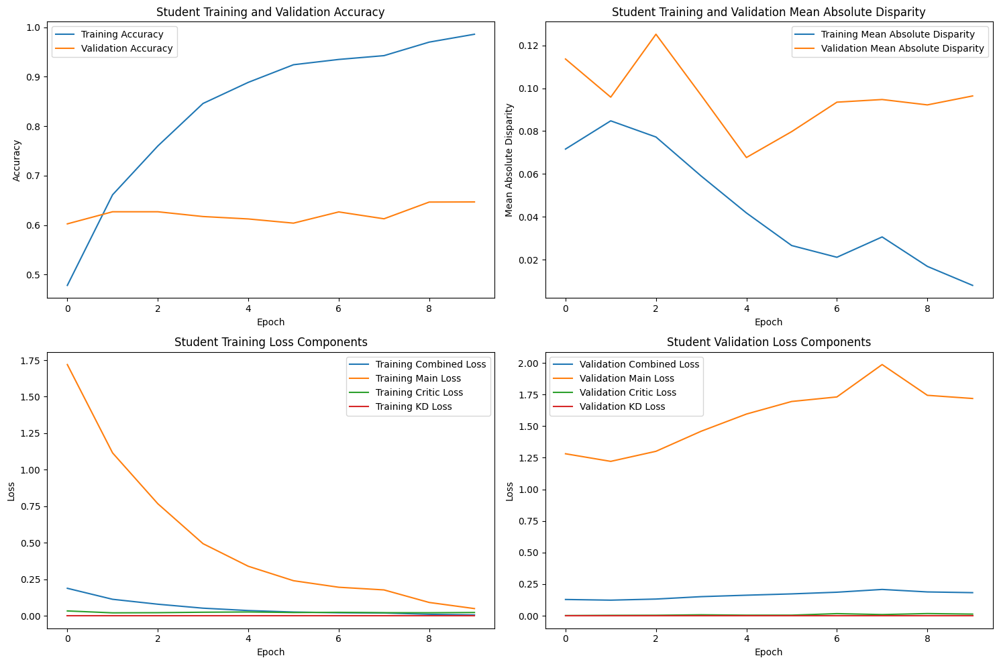

Epoch 11/200, Validation: 100%|████████████████████████████████████████████████| 55/55 [00:20<00:00,  2.69it/s]



STUDENT - Lambda 1 - Epoch 11 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.990741, VALIDATION Accuracy: 0.6509
TRAINING Disparity: 0.008709, VALIDATION Disparity: 0.0943
TRAINING Combined Loss: 0.003927, VALIDATION Combined Loss: 0.1893
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.05514721935173983
Class Celebration: Val Disparity = 0.12156261612783348
Class Parade: Val Disparity = -0.009920312245893625
Class Waiter_Or_Waitress: Val Disparity = 0.029166666666666674
Class Individual_Sports: Val Disparity = -0.08935508935508929
Class Surgeons: Val Disparity = -0.15502392344497606
Class Spa: Val Disparity = 0.04318936877076418
Class Law_Enforcement: Val Disparity = 0.04247835497835495
Class Business: Val Disparity = 0.19066687201601723
Class Dresses: Val Disparity = -0.3939906898011003
Class Water_Activities: Val Disparity = 0.04790940766550533
Class Picnic: Val Disparity = -0.05555555555555558
Class Rescue: 

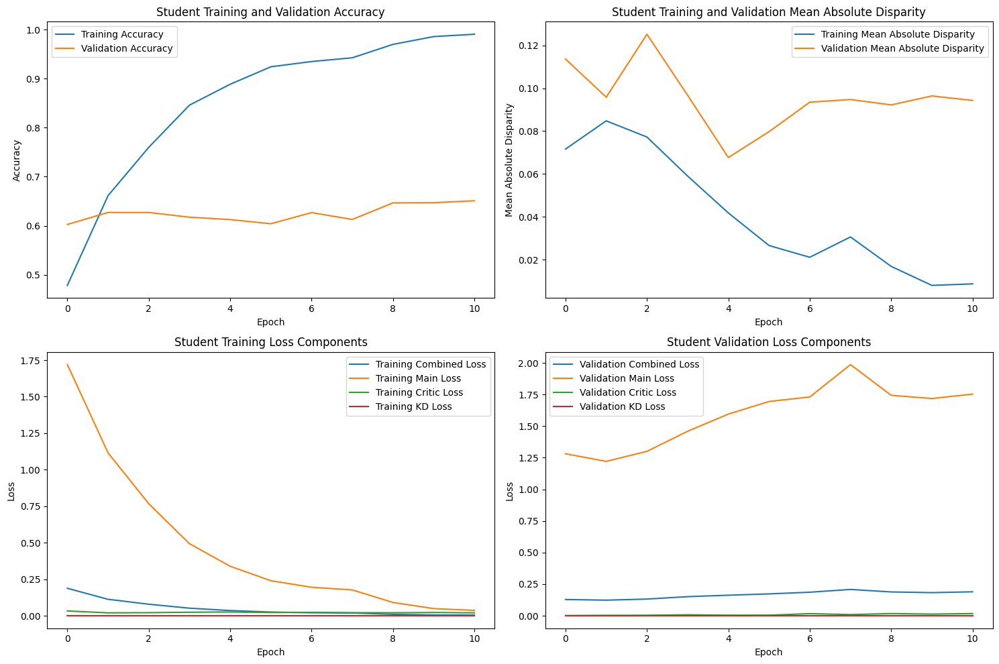

Epoch 12/200, Validation: 100%|████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.79it/s]


Early stopping triggered at epoch 12
Finished Training STUDENT with lambda value of 1. Best epoch number: 2
Training Student with Lambda Value of 1.5


Epoch 1/200, Validation: 100%|█████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.79it/s]



STUDENT - Lambda 1.5 - Epoch 1 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.460918, VALIDATION Accuracy: 0.5781
TRAINING Disparity: 0.068828, VALIDATION Disparity: 0.1247
TRAINING Combined Loss: 0.207463, VALIDATION Combined Loss: 0.1371
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.08424178031350538
Class Celebration: Val Disparity = 0.19147157190635444
Class Parade: Val Disparity = -0.05355884425651858
Class Waiter_Or_Waitress: Val Disparity = 0.13854166666666679
Class Individual_Sports: Val Disparity = -0.08080808080808077
Class Surgeons: Val Disparity = 0.015311004784688997
Class Spa: Val Disparity = -0.24916943521594687
Class Law_Enforcement: Val Disparity = 0.17532467532467538
Class Business: Val Disparity = 0.15123979670414295
Class Dresses: Val Disparity = -0.32797291578501897
Class Water_Activities: Val Disparity = 0.08257839721254367
Class Picnic: Val Disparity = 0.06944444444444448
Class Rescue: 

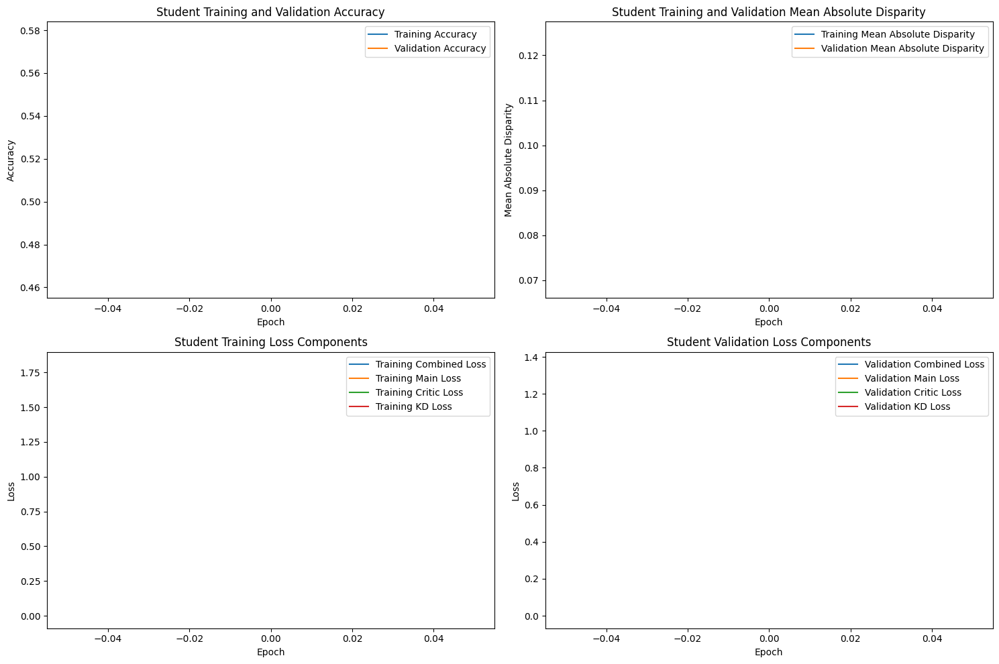

Epoch 2/200, Validation: 100%|█████████████████████████████████████████████████| 55/55 [00:20<00:00,  2.74it/s]



STUDENT - Lambda 1.5 - Epoch 2 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.642515, VALIDATION Accuracy: 0.6119
TRAINING Disparity: 0.091433, VALIDATION Disparity: 0.1219
TRAINING Combined Loss: 0.117439, VALIDATION Combined Loss: 0.1291
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.11525754289955903
Class Celebration: Val Disparity = 0.14957264957264949
Class Parade: Val Disparity = -0.02466525722339674
Class Waiter_Or_Waitress: Val Disparity = 0.029166666666666674
Class Individual_Sports: Val Disparity = -0.12004662004662003
Class Surgeons: Val Disparity = -0.1282296650717703
Class Spa: Val Disparity = -0.12292358803986714
Class Law_Enforcement: Val Disparity = 0.022997835497835517
Class Business: Val Disparity = 0.2174649622670568
Class Dresses: Val Disparity = -0.49661447312738055
Class Water_Activities: Val Disparity = 0.09320557491289205
Class Picnic: Val Disparity = 0.01388888888888884
Class Rescue: 

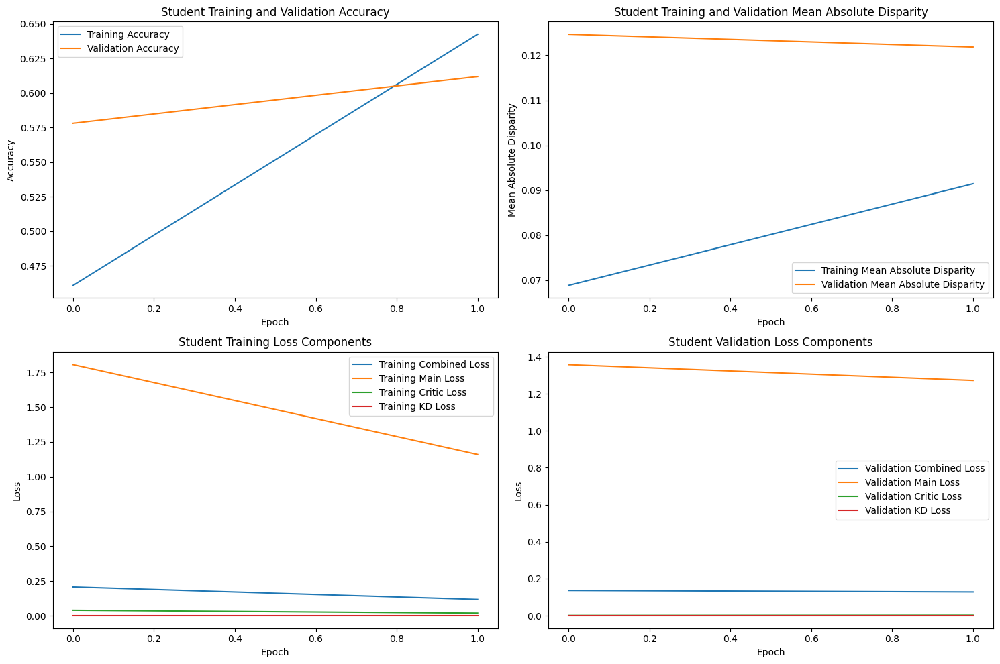

Epoch 3/200, Validation: 100%|█████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.78it/s]



STUDENT - Lambda 1.5 - Epoch 3 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.734047, VALIDATION Accuracy: 0.6237
TRAINING Disparity: 0.077454, VALIDATION Disparity: 0.1108
TRAINING Combined Loss: 0.091138, VALIDATION Combined Loss: 0.1363
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.11525754289955903
Class Celebration: Val Disparity = 0.14957264957264949
Class Parade: Val Disparity = -0.02466525722339674
Class Waiter_Or_Waitress: Val Disparity = 0.029166666666666674
Class Individual_Sports: Val Disparity = -0.12004662004662003
Class Surgeons: Val Disparity = -0.1282296650717703
Class Spa: Val Disparity = -0.12292358803986714
Class Law_Enforcement: Val Disparity = 0.022997835497835517
Class Business: Val Disparity = 0.2174649622670568
Class Dresses: Val Disparity = -0.49661447312738055
Class Water_Activities: Val Disparity = 0.09320557491289205
Class Picnic: Val Disparity = 0.01388888888888884
Class Rescue: 

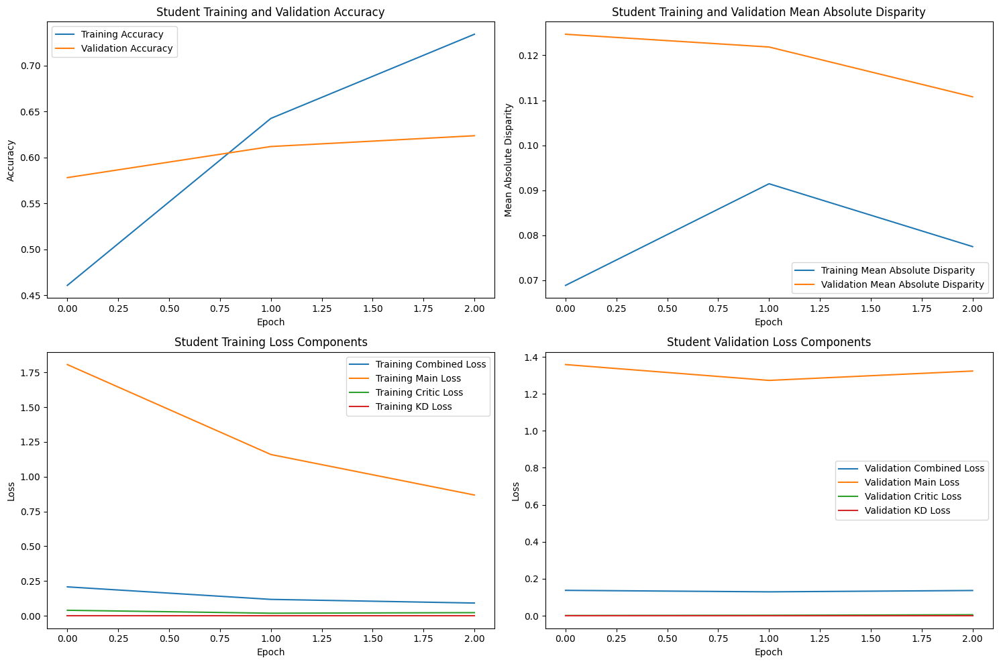

Epoch 4/200, Validation: 100%|█████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.77it/s]



STUDENT - Lambda 1.5 - Epoch 4 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.814275, VALIDATION Accuracy: 0.6148
TRAINING Disparity: 0.068766, VALIDATION Disparity: 0.1201
TRAINING Combined Loss: 0.063204, VALIDATION Combined Loss: 0.1406
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.11525754289955903
Class Celebration: Val Disparity = 0.14957264957264949
Class Parade: Val Disparity = -0.02466525722339674
Class Waiter_Or_Waitress: Val Disparity = 0.029166666666666674
Class Individual_Sports: Val Disparity = -0.12004662004662003
Class Surgeons: Val Disparity = -0.1282296650717703
Class Spa: Val Disparity = -0.12292358803986714
Class Law_Enforcement: Val Disparity = 0.022997835497835517
Class Business: Val Disparity = 0.2174649622670568
Class Dresses: Val Disparity = -0.49661447312738055
Class Water_Activities: Val Disparity = 0.09320557491289205
Class Picnic: Val Disparity = 0.01388888888888884
Class Rescue: 

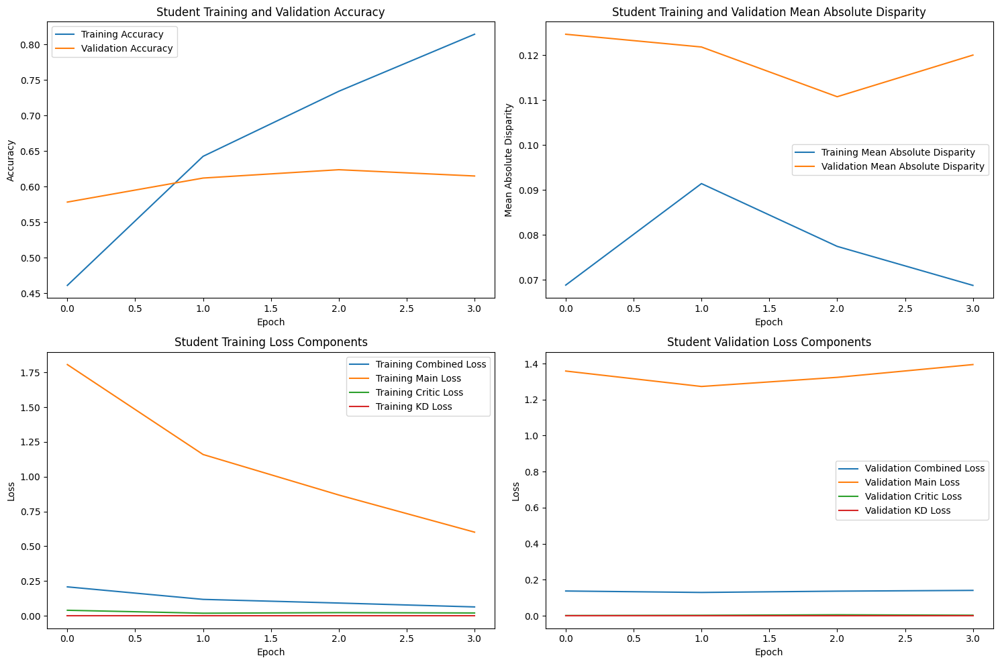

Epoch 5/200, Validation: 100%|█████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.77it/s]



STUDENT - Lambda 1.5 - Epoch 5 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.885069, VALIDATION Accuracy: 0.6097
TRAINING Disparity: 0.051176, VALIDATION Disparity: 0.1268
TRAINING Combined Loss: 0.038221, VALIDATION Combined Loss: 0.1737
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.11525754289955903
Class Celebration: Val Disparity = 0.14957264957264949
Class Parade: Val Disparity = -0.02466525722339674
Class Waiter_Or_Waitress: Val Disparity = 0.029166666666666674
Class Individual_Sports: Val Disparity = -0.12004662004662003
Class Surgeons: Val Disparity = -0.1282296650717703
Class Spa: Val Disparity = -0.12292358803986714
Class Law_Enforcement: Val Disparity = 0.022997835497835517
Class Business: Val Disparity = 0.2174649622670568
Class Dresses: Val Disparity = -0.49661447312738055
Class Water_Activities: Val Disparity = 0.09320557491289205
Class Picnic: Val Disparity = 0.01388888888888884
Class Rescue: 

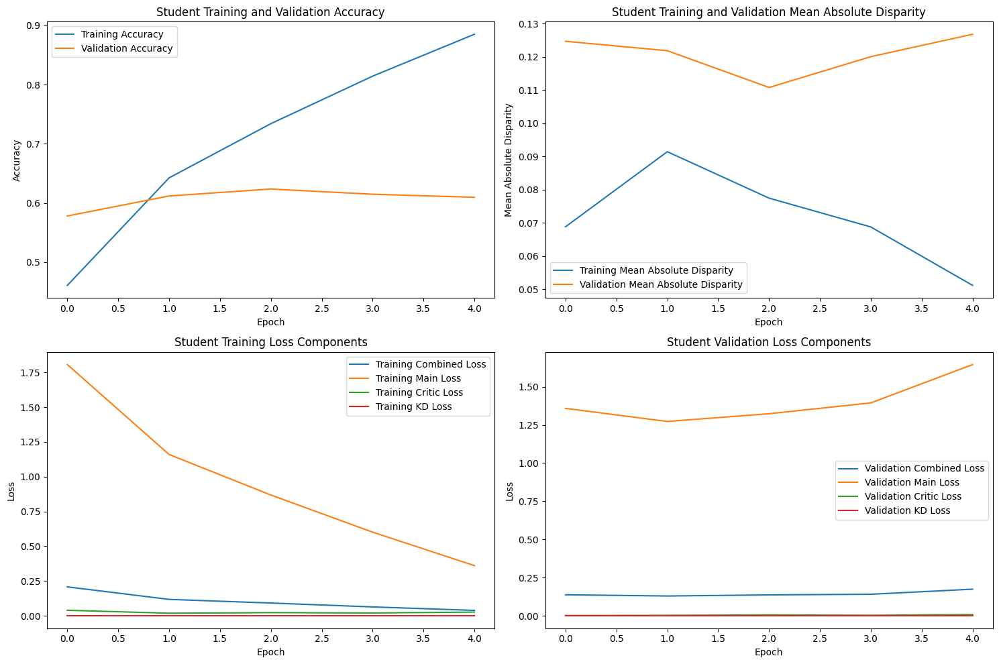

Epoch 6/200, Validation: 100%|█████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.79it/s]



STUDENT - Lambda 1.5 - Epoch 6 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.914217, VALIDATION Accuracy: 0.6109
TRAINING Disparity: 0.045256, VALIDATION Disparity: 0.0913
TRAINING Combined Loss: 0.029118, VALIDATION Combined Loss: 0.2001
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.11525754289955903
Class Celebration: Val Disparity = 0.14957264957264949
Class Parade: Val Disparity = -0.02466525722339674
Class Waiter_Or_Waitress: Val Disparity = 0.029166666666666674
Class Individual_Sports: Val Disparity = -0.12004662004662003
Class Surgeons: Val Disparity = -0.1282296650717703
Class Spa: Val Disparity = -0.12292358803986714
Class Law_Enforcement: Val Disparity = 0.022997835497835517
Class Business: Val Disparity = 0.2174649622670568
Class Dresses: Val Disparity = -0.49661447312738055
Class Water_Activities: Val Disparity = 0.09320557491289205
Class Picnic: Val Disparity = 0.01388888888888884
Class Rescue: 

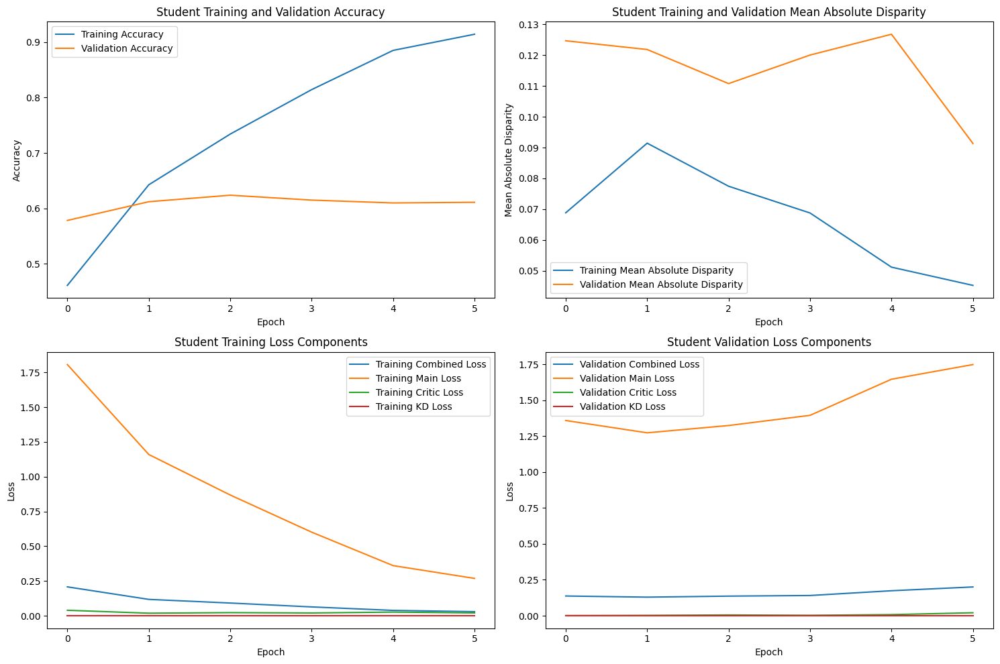

Epoch 7/200, Validation: 100%|█████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.76it/s]



STUDENT - Lambda 1.5 - Epoch 7 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.924653, VALIDATION Accuracy: 0.6029
TRAINING Disparity: 0.022292, VALIDATION Disparity: 0.1252
TRAINING Combined Loss: 0.023336, VALIDATION Combined Loss: 0.1975
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.11525754289955903
Class Celebration: Val Disparity = 0.14957264957264949
Class Parade: Val Disparity = -0.02466525722339674
Class Waiter_Or_Waitress: Val Disparity = 0.029166666666666674
Class Individual_Sports: Val Disparity = -0.12004662004662003
Class Surgeons: Val Disparity = -0.1282296650717703
Class Spa: Val Disparity = -0.12292358803986714
Class Law_Enforcement: Val Disparity = 0.022997835497835517
Class Business: Val Disparity = 0.2174649622670568
Class Dresses: Val Disparity = -0.49661447312738055
Class Water_Activities: Val Disparity = 0.09320557491289205
Class Picnic: Val Disparity = 0.01388888888888884
Class Rescue: 

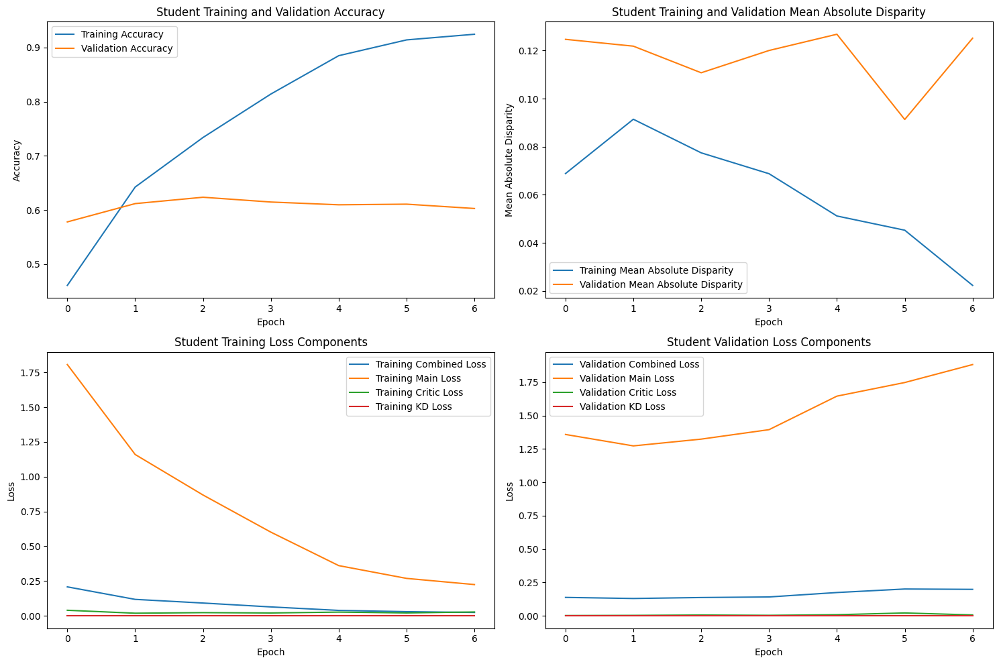

Epoch 8/200, Validation: 100%|█████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.84it/s]



STUDENT - Lambda 1.5 - Epoch 8 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.939622, VALIDATION Accuracy: 0.6018
TRAINING Disparity: 0.022018, VALIDATION Disparity: 0.1080
TRAINING Combined Loss: 0.019815, VALIDATION Combined Loss: 0.2135
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.11525754289955903
Class Celebration: Val Disparity = 0.14957264957264949
Class Parade: Val Disparity = -0.02466525722339674
Class Waiter_Or_Waitress: Val Disparity = 0.029166666666666674
Class Individual_Sports: Val Disparity = -0.12004662004662003
Class Surgeons: Val Disparity = -0.1282296650717703
Class Spa: Val Disparity = -0.12292358803986714
Class Law_Enforcement: Val Disparity = 0.022997835497835517
Class Business: Val Disparity = 0.2174649622670568
Class Dresses: Val Disparity = -0.49661447312738055
Class Water_Activities: Val Disparity = 0.09320557491289205
Class Picnic: Val Disparity = 0.01388888888888884
Class Rescue: 

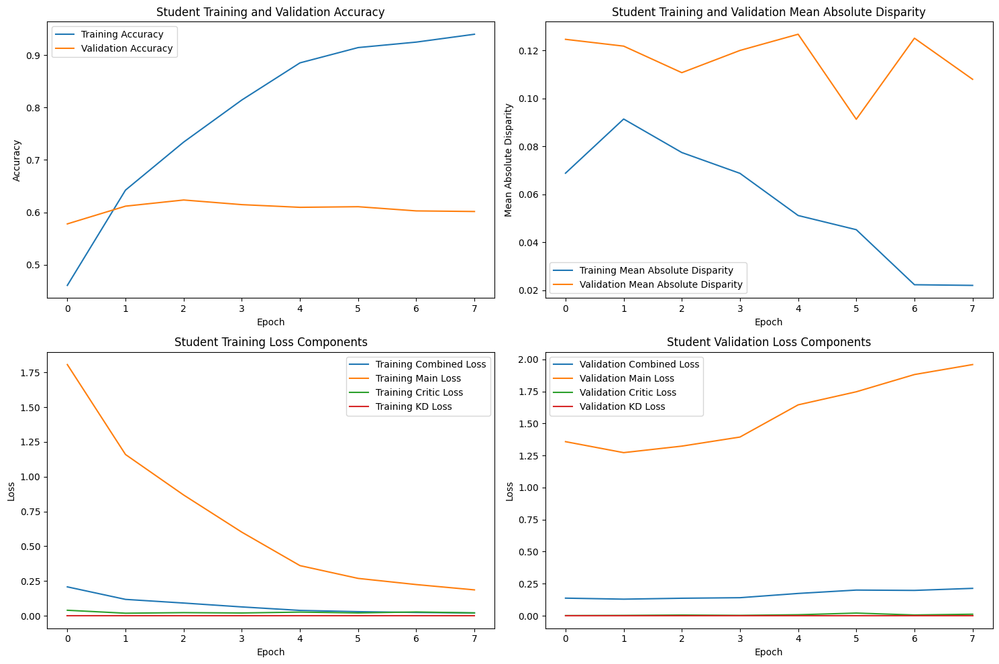

Epoch 9/200, Validation: 100%|█████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.82it/s]



STUDENT - Lambda 1.5 - Epoch 9 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.967978, VALIDATION Accuracy: 0.6396
TRAINING Disparity: 0.017753, VALIDATION Disparity: 0.1160
TRAINING Combined Loss: 0.010900, VALIDATION Combined Loss: 0.1993
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.11525754289955903
Class Celebration: Val Disparity = 0.14957264957264949
Class Parade: Val Disparity = -0.02466525722339674
Class Waiter_Or_Waitress: Val Disparity = 0.029166666666666674
Class Individual_Sports: Val Disparity = -0.12004662004662003
Class Surgeons: Val Disparity = -0.1282296650717703
Class Spa: Val Disparity = -0.12292358803986714
Class Law_Enforcement: Val Disparity = 0.022997835497835517
Class Business: Val Disparity = 0.2174649622670568
Class Dresses: Val Disparity = -0.49661447312738055
Class Water_Activities: Val Disparity = 0.09320557491289205
Class Picnic: Val Disparity = 0.01388888888888884
Class Rescue: 

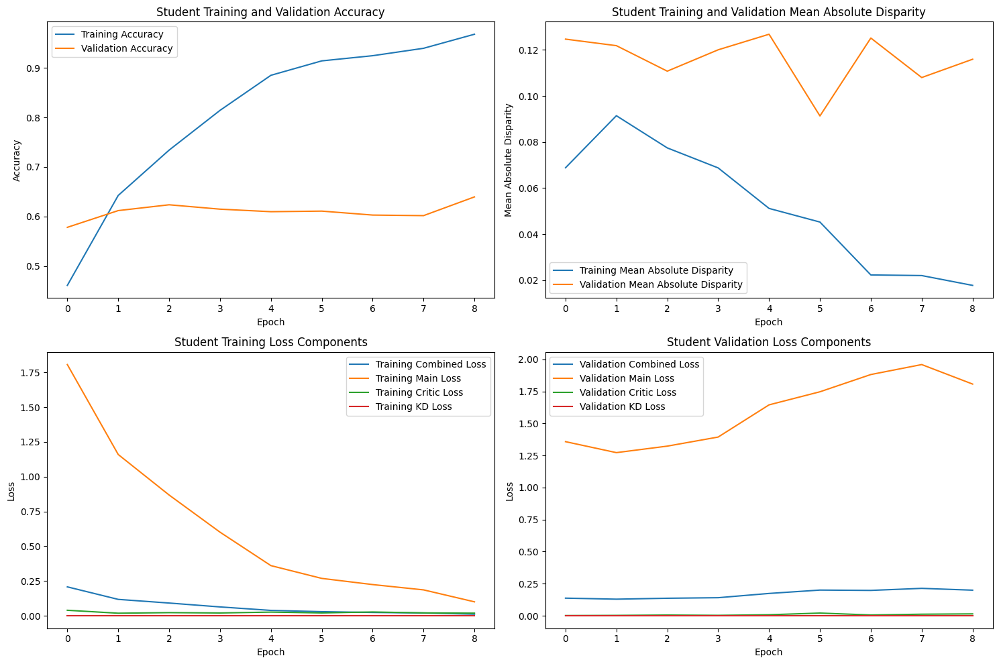

Epoch 10/200, Validation: 100%|████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.80it/s]



STUDENT - Lambda 1.5 - Epoch 10 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.987346, VALIDATION Accuracy: 0.6455
TRAINING Disparity: 0.010178, VALIDATION Disparity: 0.1162
TRAINING Combined Loss: 0.005318, VALIDATION Combined Loss: 0.2071
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.11525754289955903
Class Celebration: Val Disparity = 0.14957264957264949
Class Parade: Val Disparity = -0.02466525722339674
Class Waiter_Or_Waitress: Val Disparity = 0.029166666666666674
Class Individual_Sports: Val Disparity = -0.12004662004662003
Class Surgeons: Val Disparity = -0.1282296650717703
Class Spa: Val Disparity = -0.12292358803986714
Class Law_Enforcement: Val Disparity = 0.022997835497835517
Class Business: Val Disparity = 0.2174649622670568
Class Dresses: Val Disparity = -0.49661447312738055
Class Water_Activities: Val Disparity = 0.09320557491289205
Class Picnic: Val Disparity = 0.01388888888888884
Class Rescue:

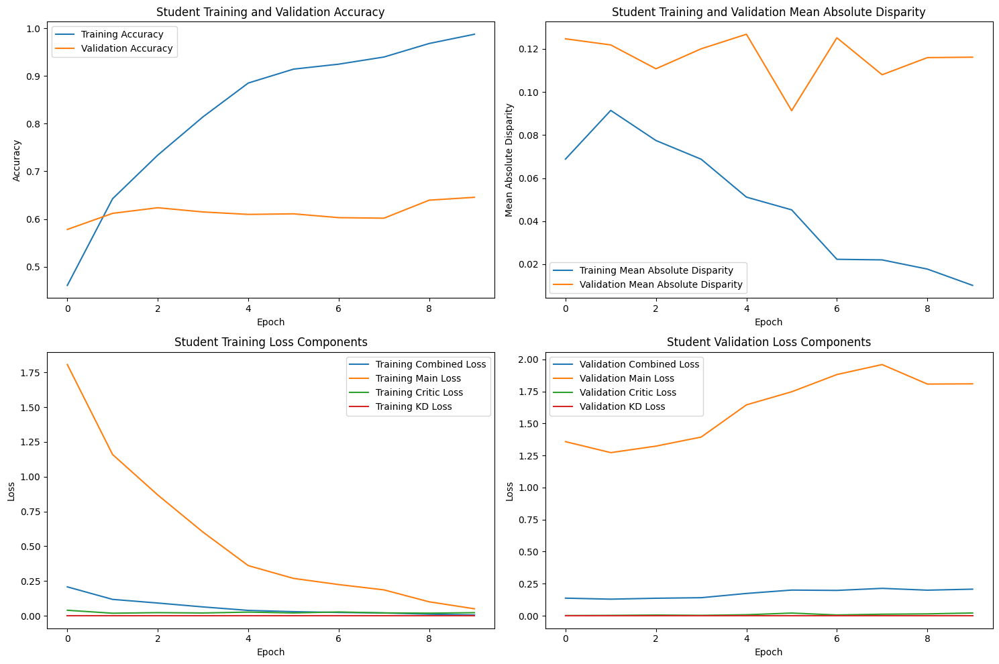

Epoch 11/200, Validation: 100%|████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.82it/s]



STUDENT - Lambda 1.5 - Epoch 11 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.990548, VALIDATION Accuracy: 0.6418
TRAINING Disparity: 0.010209, VALIDATION Disparity: 0.1073
TRAINING Combined Loss: 0.004039, VALIDATION Combined Loss: 0.2012
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.11525754289955903
Class Celebration: Val Disparity = 0.14957264957264949
Class Parade: Val Disparity = -0.02466525722339674
Class Waiter_Or_Waitress: Val Disparity = 0.029166666666666674
Class Individual_Sports: Val Disparity = -0.12004662004662003
Class Surgeons: Val Disparity = -0.1282296650717703
Class Spa: Val Disparity = -0.12292358803986714
Class Law_Enforcement: Val Disparity = 0.022997835497835517
Class Business: Val Disparity = 0.2174649622670568
Class Dresses: Val Disparity = -0.49661447312738055
Class Water_Activities: Val Disparity = 0.09320557491289205
Class Picnic: Val Disparity = 0.01388888888888884
Class Rescue:

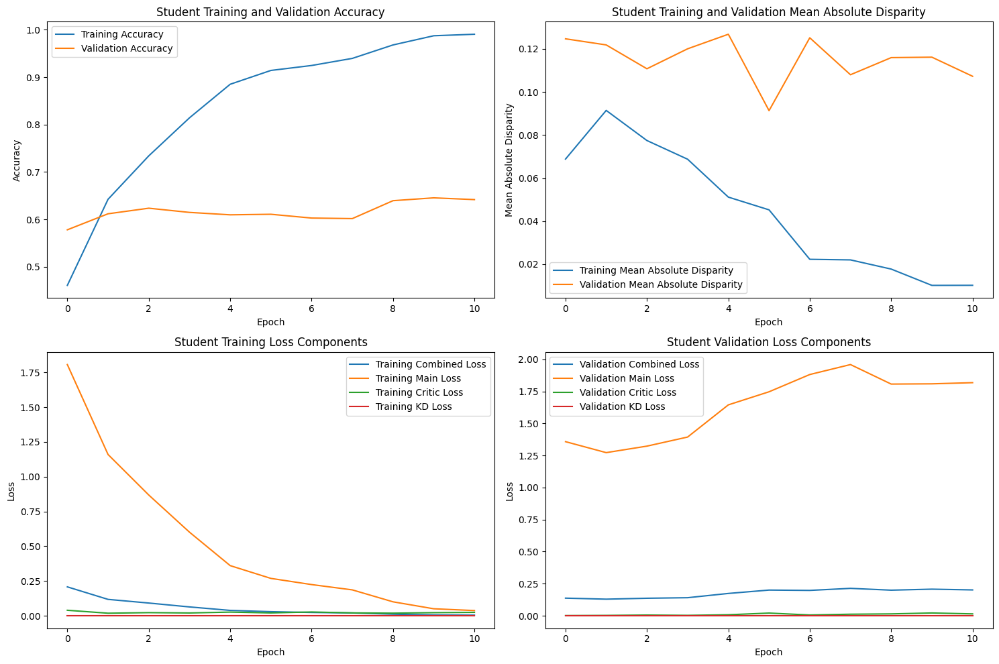

Epoch 12/200, Validation: 100%|████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.76it/s]


Early stopping triggered at epoch 12
Finished Training STUDENT with lambda value of 1.5. Best epoch number: 2
Training Student with Lambda Value of 2


Epoch 1/200, Validation: 100%|█████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.80it/s]



STUDENT - Lambda 2 - Epoch 1 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.430517, VALIDATION Accuracy: 0.5589
TRAINING Disparity: 0.061855, VALIDATION Disparity: 0.1185
TRAINING Combined Loss: 0.224747, VALIDATION Combined Loss: 0.1447
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.07836173897856114
Class Celebration: Val Disparity = 0.15500743218134505
Class Parade: Val Disparity = -0.03274245134710252
Class Waiter_Or_Waitress: Val Disparity = 0.12187500000000007
Class Individual_Sports: Val Disparity = -0.07031857031857025
Class Surgeons: Val Disparity = -0.017224880382775143
Class Spa: Val Disparity = 0.15614617940199327
Class Law_Enforcement: Val Disparity = 0.13501082251082253
Class Business: Val Disparity = 0.20745418142615119
Class Dresses: Val Disparity = -0.39526026237833267
Class Water_Activities: Val Disparity = 0.06428571428571439
Class Picnic: Val Disparity = 0.05555555555555555
Class Rescue: Va

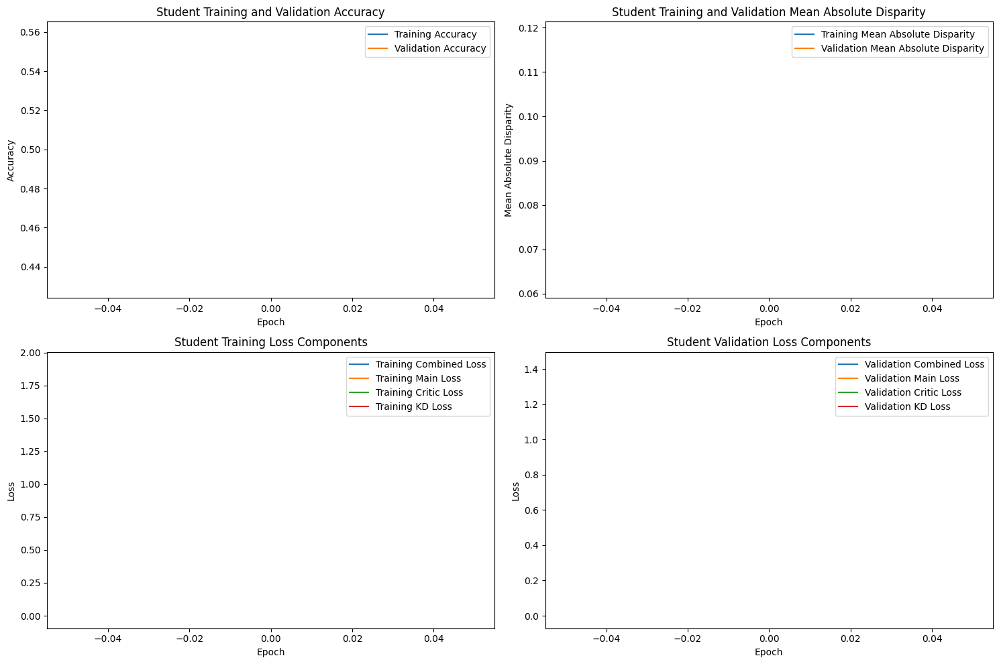

Epoch 2/200, Validation: 100%|█████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.77it/s]



STUDENT - Lambda 2 - Epoch 2 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.618268, VALIDATION Accuracy: 0.6146
TRAINING Disparity: 0.087282, VALIDATION Disparity: 0.1265
TRAINING Combined Loss: 0.126752, VALIDATION Combined Loss: 0.1279
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.13093280160682308
Class Celebration: Val Disparity = 0.22022482348569317
Class Parade: Val Disparity = 0.013931804629479072
Class Waiter_Or_Waitress: Val Disparity = 0.06666666666666654
Class Individual_Sports: Val Disparity = -0.10761460761460762
Class Surgeons: Val Disparity = -0.1406698564593301
Class Spa: Val Disparity = 0.04318936877076407
Class Law_Enforcement: Val Disparity = 0.1025432900432901
Class Business: Val Disparity = 0.19420914831356856
Class Dresses: Val Disparity = -0.34109183241642005
Class Water_Activities: Val Disparity = 0.07456445993031358
Class Picnic: Val Disparity = 0.18055555555555547
Class Rescue: Val D

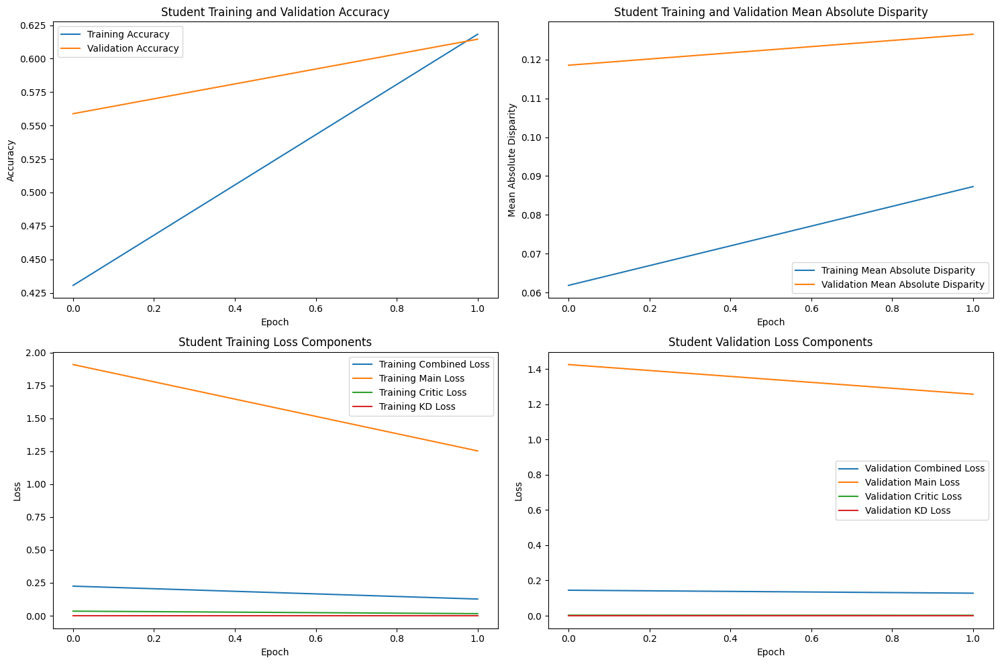

Epoch 3/200, Validation: 100%|█████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.77it/s]



STUDENT - Lambda 2 - Epoch 3 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.700965, VALIDATION Accuracy: 0.6132
TRAINING Disparity: 0.089434, VALIDATION Disparity: 0.1050
TRAINING Combined Loss: 0.102358, VALIDATION Combined Loss: 0.1394
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.13093280160682308
Class Celebration: Val Disparity = 0.22022482348569317
Class Parade: Val Disparity = 0.013931804629479072
Class Waiter_Or_Waitress: Val Disparity = 0.06666666666666654
Class Individual_Sports: Val Disparity = -0.10761460761460762
Class Surgeons: Val Disparity = -0.1406698564593301
Class Spa: Val Disparity = 0.04318936877076407
Class Law_Enforcement: Val Disparity = 0.1025432900432901
Class Business: Val Disparity = 0.19420914831356856
Class Dresses: Val Disparity = -0.34109183241642005
Class Water_Activities: Val Disparity = 0.07456445993031358
Class Picnic: Val Disparity = 0.18055555555555547
Class Rescue: Val D

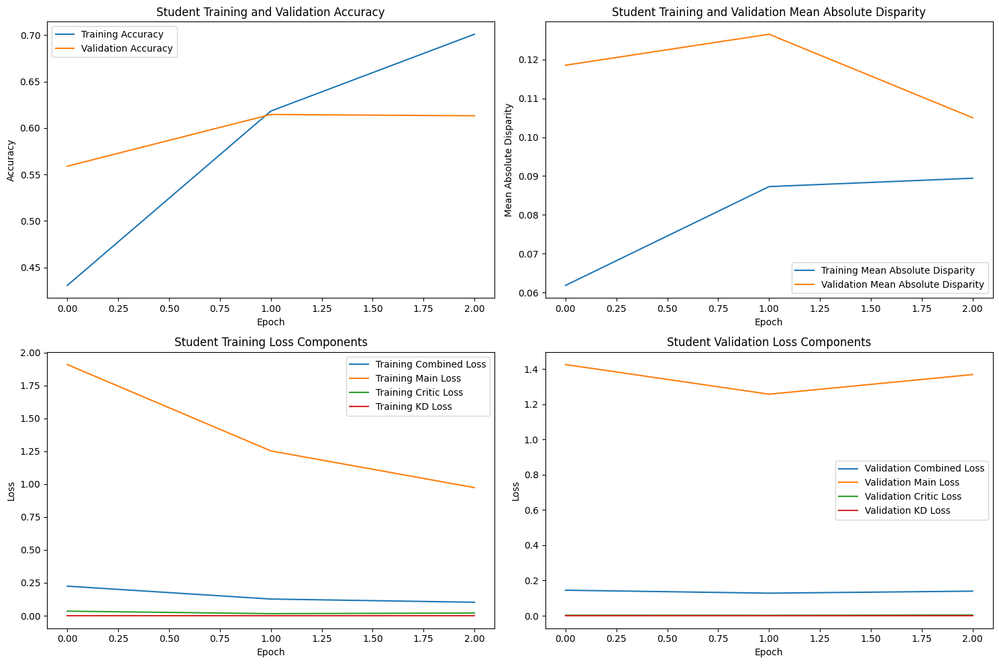

Epoch 4/200, Validation: 100%|█████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.79it/s]



STUDENT - Lambda 2 - Epoch 4 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.772087, VALIDATION Accuracy: 0.6293
TRAINING Disparity: 0.085264, VALIDATION Disparity: 0.1110
TRAINING Combined Loss: 0.077694, VALIDATION Combined Loss: 0.1411
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.13093280160682308
Class Celebration: Val Disparity = 0.22022482348569317
Class Parade: Val Disparity = 0.013931804629479072
Class Waiter_Or_Waitress: Val Disparity = 0.06666666666666654
Class Individual_Sports: Val Disparity = -0.10761460761460762
Class Surgeons: Val Disparity = -0.1406698564593301
Class Spa: Val Disparity = 0.04318936877076407
Class Law_Enforcement: Val Disparity = 0.1025432900432901
Class Business: Val Disparity = 0.19420914831356856
Class Dresses: Val Disparity = -0.34109183241642005
Class Water_Activities: Val Disparity = 0.07456445993031358
Class Picnic: Val Disparity = 0.18055555555555547
Class Rescue: Val D

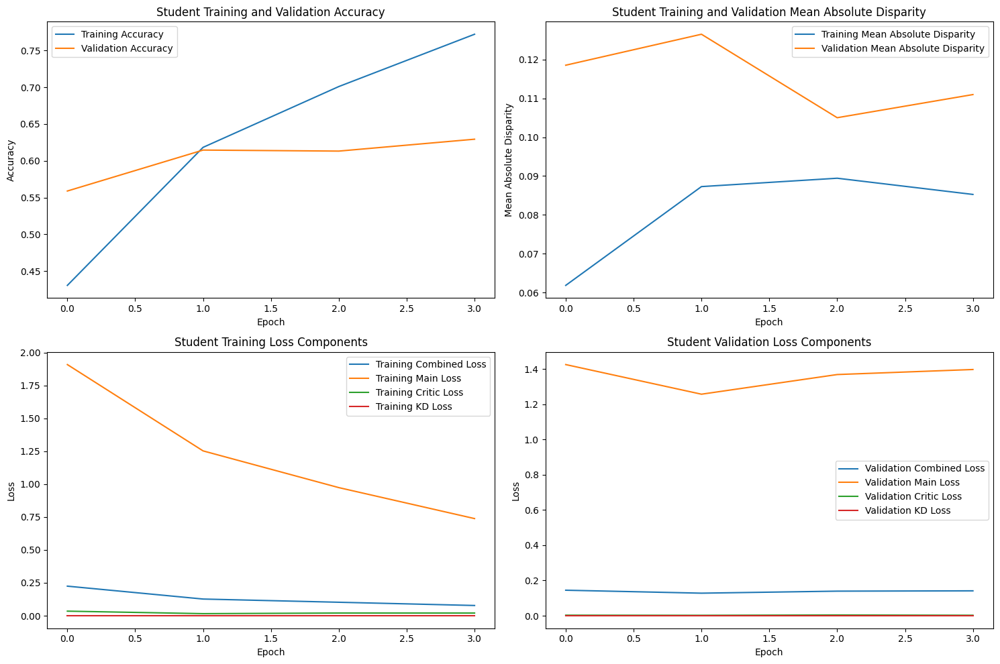

Epoch 5/200, Validation: 100%|█████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.76it/s]



STUDENT - Lambda 2 - Epoch 5 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.849576, VALIDATION Accuracy: 0.6131
TRAINING Disparity: 0.048701, VALIDATION Disparity: 0.1239
TRAINING Combined Loss: 0.050054, VALIDATION Combined Loss: 0.1707
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.13093280160682308
Class Celebration: Val Disparity = 0.22022482348569317
Class Parade: Val Disparity = 0.013931804629479072
Class Waiter_Or_Waitress: Val Disparity = 0.06666666666666654
Class Individual_Sports: Val Disparity = -0.10761460761460762
Class Surgeons: Val Disparity = -0.1406698564593301
Class Spa: Val Disparity = 0.04318936877076407
Class Law_Enforcement: Val Disparity = 0.1025432900432901
Class Business: Val Disparity = 0.19420914831356856
Class Dresses: Val Disparity = -0.34109183241642005
Class Water_Activities: Val Disparity = 0.07456445993031358
Class Picnic: Val Disparity = 0.18055555555555547
Class Rescue: Val D

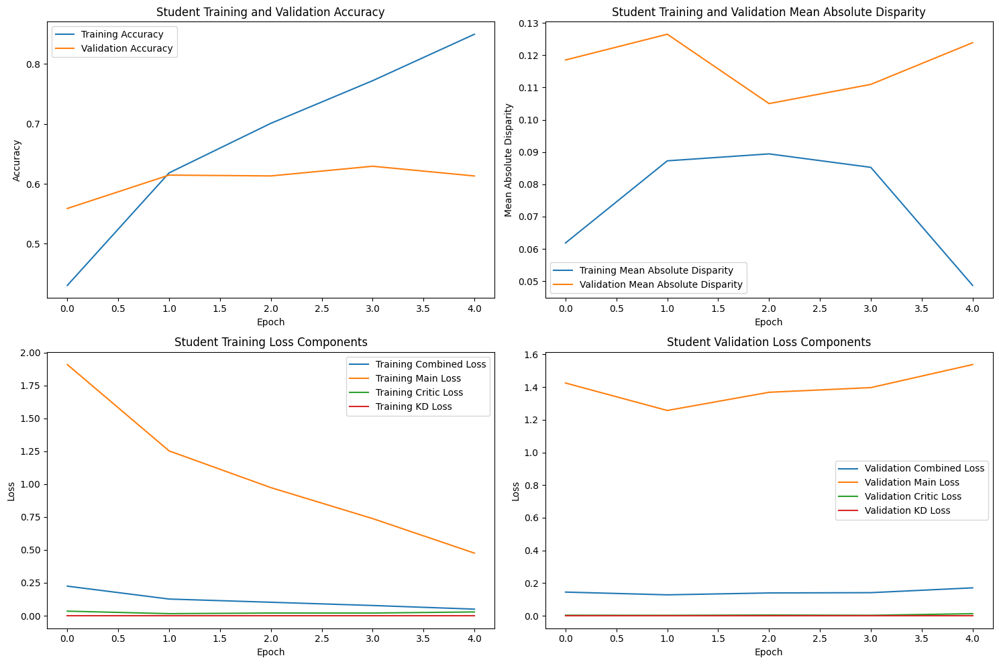

Epoch 6/200, Validation: 100%|█████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.80it/s]



STUDENT - Lambda 2 - Epoch 6 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.885224, VALIDATION Accuracy: 0.6080
TRAINING Disparity: 0.052560, VALIDATION Disparity: 0.1248
TRAINING Combined Loss: 0.039639, VALIDATION Combined Loss: 0.1785
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.13093280160682308
Class Celebration: Val Disparity = 0.22022482348569317
Class Parade: Val Disparity = 0.013931804629479072
Class Waiter_Or_Waitress: Val Disparity = 0.06666666666666654
Class Individual_Sports: Val Disparity = -0.10761460761460762
Class Surgeons: Val Disparity = -0.1406698564593301
Class Spa: Val Disparity = 0.04318936877076407
Class Law_Enforcement: Val Disparity = 0.1025432900432901
Class Business: Val Disparity = 0.19420914831356856
Class Dresses: Val Disparity = -0.34109183241642005
Class Water_Activities: Val Disparity = 0.07456445993031358
Class Picnic: Val Disparity = 0.18055555555555547
Class Rescue: Val D

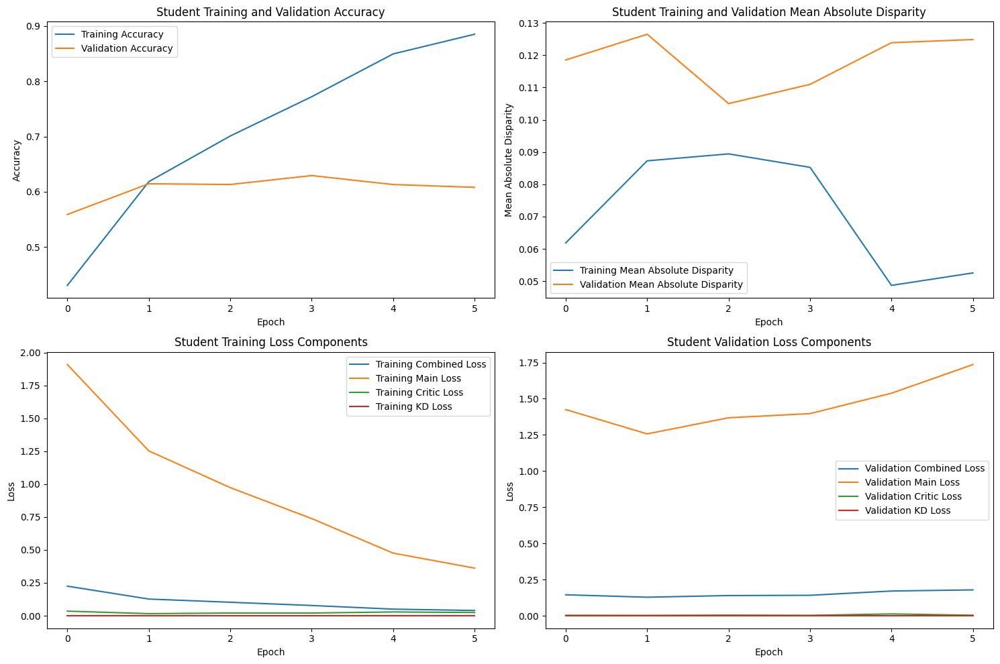

Epoch 7/200, Validation: 100%|█████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.83it/s]



STUDENT - Lambda 2 - Epoch 7 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.916030, VALIDATION Accuracy: 0.5998
TRAINING Disparity: 0.028216, VALIDATION Disparity: 0.1018
TRAINING Combined Loss: 0.028683, VALIDATION Combined Loss: 0.2052
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.13093280160682308
Class Celebration: Val Disparity = 0.22022482348569317
Class Parade: Val Disparity = 0.013931804629479072
Class Waiter_Or_Waitress: Val Disparity = 0.06666666666666654
Class Individual_Sports: Val Disparity = -0.10761460761460762
Class Surgeons: Val Disparity = -0.1406698564593301
Class Spa: Val Disparity = 0.04318936877076407
Class Law_Enforcement: Val Disparity = 0.1025432900432901
Class Business: Val Disparity = 0.19420914831356856
Class Dresses: Val Disparity = -0.34109183241642005
Class Water_Activities: Val Disparity = 0.07456445993031358
Class Picnic: Val Disparity = 0.18055555555555547
Class Rescue: Val D

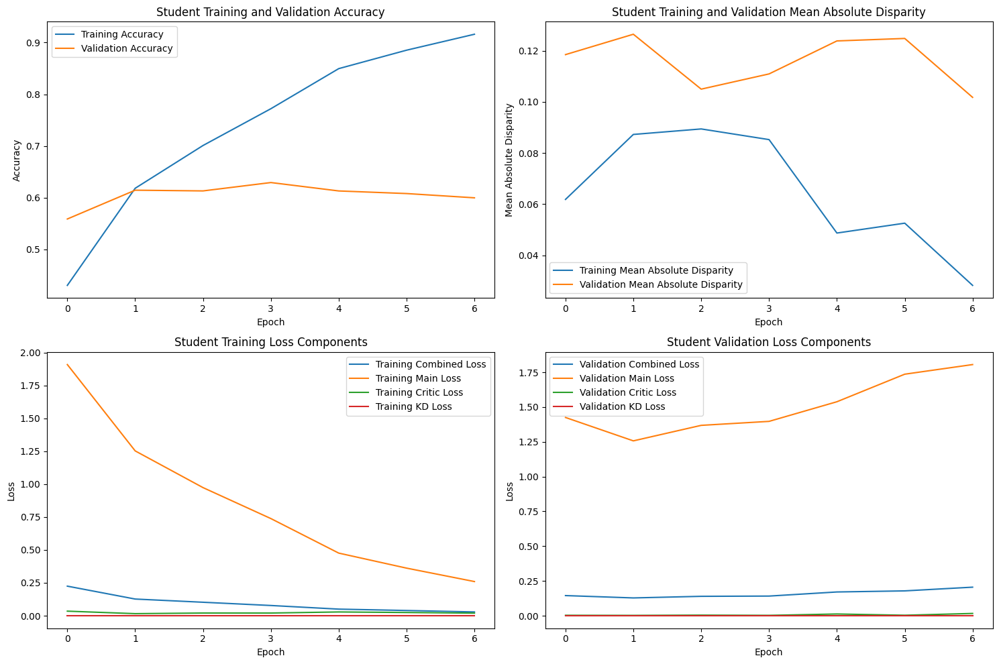

Epoch 8/200, Validation: 100%|█████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.82it/s]



STUDENT - Lambda 2 - Epoch 8 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.928588, VALIDATION Accuracy: 0.6126
TRAINING Disparity: 0.019167, VALIDATION Disparity: 0.0900
TRAINING Combined Loss: 0.023491, VALIDATION Combined Loss: 0.2188
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.13093280160682308
Class Celebration: Val Disparity = 0.22022482348569317
Class Parade: Val Disparity = 0.013931804629479072
Class Waiter_Or_Waitress: Val Disparity = 0.06666666666666654
Class Individual_Sports: Val Disparity = -0.10761460761460762
Class Surgeons: Val Disparity = -0.1406698564593301
Class Spa: Val Disparity = 0.04318936877076407
Class Law_Enforcement: Val Disparity = 0.1025432900432901
Class Business: Val Disparity = 0.19420914831356856
Class Dresses: Val Disparity = -0.34109183241642005
Class Water_Activities: Val Disparity = 0.07456445993031358
Class Picnic: Val Disparity = 0.18055555555555547
Class Rescue: Val D

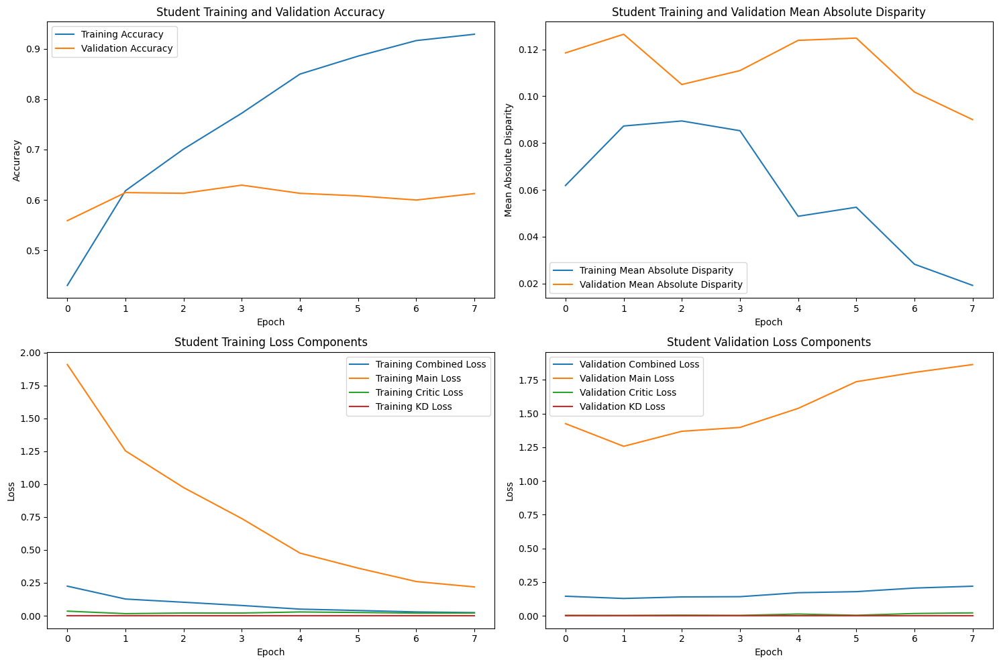

Epoch 9/200, Validation: 100%|█████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.77it/s]



STUDENT - Lambda 2 - Epoch 9 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.965278, VALIDATION Accuracy: 0.6467
TRAINING Disparity: 0.018570, VALIDATION Disparity: 0.0940
TRAINING Combined Loss: 0.012414, VALIDATION Combined Loss: 0.1947
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.13093280160682308
Class Celebration: Val Disparity = 0.22022482348569317
Class Parade: Val Disparity = 0.013931804629479072
Class Waiter_Or_Waitress: Val Disparity = 0.06666666666666654
Class Individual_Sports: Val Disparity = -0.10761460761460762
Class Surgeons: Val Disparity = -0.1406698564593301
Class Spa: Val Disparity = 0.04318936877076407
Class Law_Enforcement: Val Disparity = 0.1025432900432901
Class Business: Val Disparity = 0.19420914831356856
Class Dresses: Val Disparity = -0.34109183241642005
Class Water_Activities: Val Disparity = 0.07456445993031358
Class Picnic: Val Disparity = 0.18055555555555547
Class Rescue: Val D

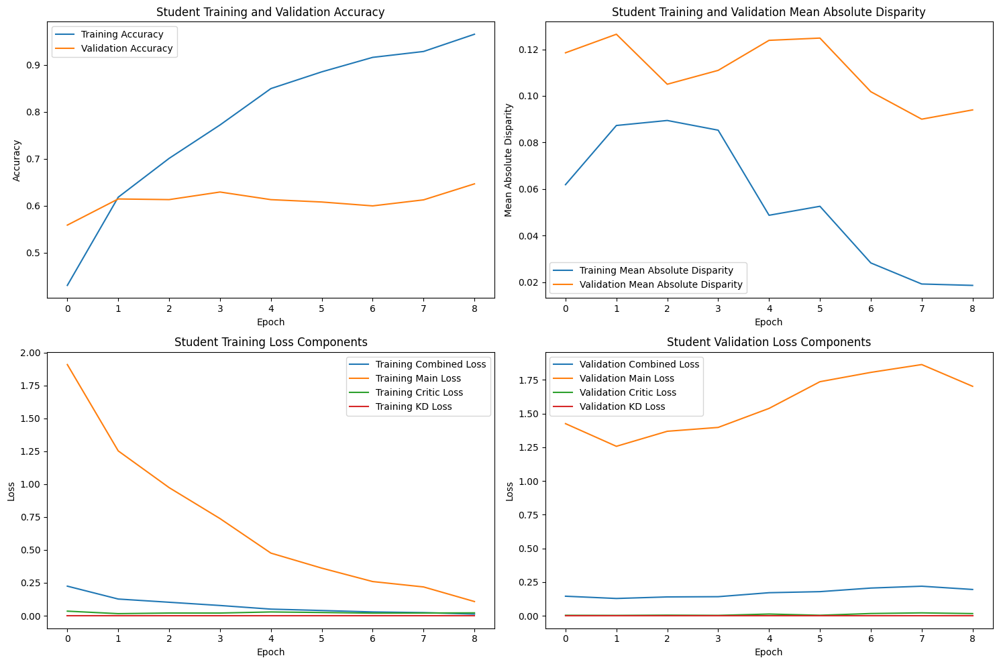

Epoch 10/200, Validation: 100%|████████████████████████████████████████████████| 55/55 [00:20<00:00,  2.66it/s]



STUDENT - Lambda 2 - Epoch 10 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.985050, VALIDATION Accuracy: 0.6507
TRAINING Disparity: 0.012005, VALIDATION Disparity: 0.1112
TRAINING Combined Loss: 0.006397, VALIDATION Combined Loss: 0.1924
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.13093280160682308
Class Celebration: Val Disparity = 0.22022482348569317
Class Parade: Val Disparity = 0.013931804629479072
Class Waiter_Or_Waitress: Val Disparity = 0.06666666666666654
Class Individual_Sports: Val Disparity = -0.10761460761460762
Class Surgeons: Val Disparity = -0.1406698564593301
Class Spa: Val Disparity = 0.04318936877076407
Class Law_Enforcement: Val Disparity = 0.1025432900432901
Class Business: Val Disparity = 0.19420914831356856
Class Dresses: Val Disparity = -0.34109183241642005
Class Water_Activities: Val Disparity = 0.07456445993031358
Class Picnic: Val Disparity = 0.18055555555555547
Class Rescue: Val 

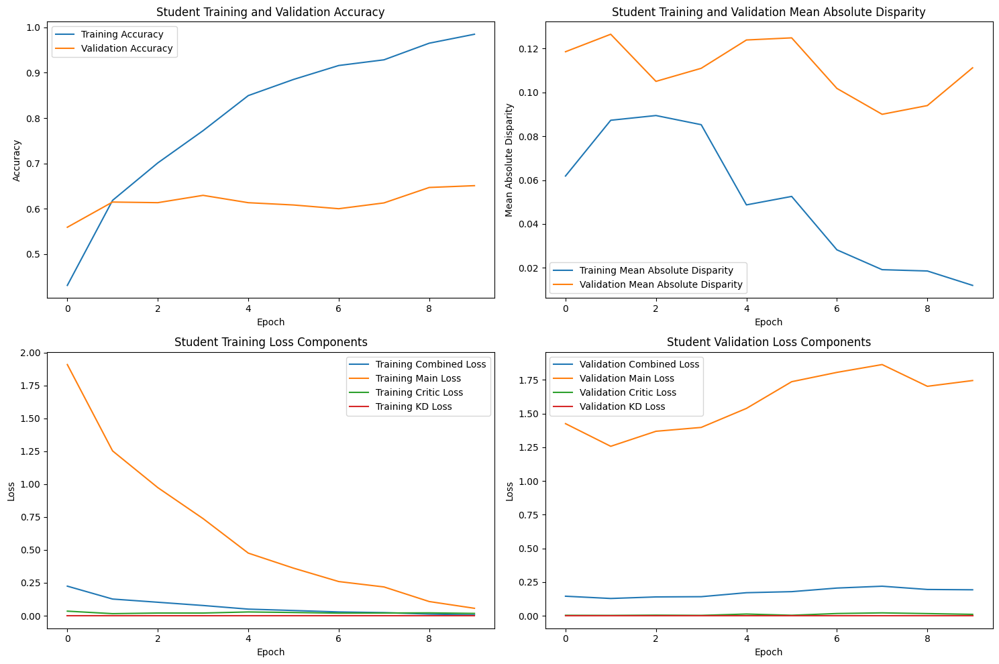

Epoch 11/200, Validation: 100%|████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.76it/s]



STUDENT - Lambda 2 - Epoch 11 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.986690, VALIDATION Accuracy: 0.6487
TRAINING Disparity: 0.009495, VALIDATION Disparity: 0.0970
TRAINING Combined Loss: 0.005294, VALIDATION Combined Loss: 0.1993
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.13093280160682308
Class Celebration: Val Disparity = 0.22022482348569317
Class Parade: Val Disparity = 0.013931804629479072
Class Waiter_Or_Waitress: Val Disparity = 0.06666666666666654
Class Individual_Sports: Val Disparity = -0.10761460761460762
Class Surgeons: Val Disparity = -0.1406698564593301
Class Spa: Val Disparity = 0.04318936877076407
Class Law_Enforcement: Val Disparity = 0.1025432900432901
Class Business: Val Disparity = 0.19420914831356856
Class Dresses: Val Disparity = -0.34109183241642005
Class Water_Activities: Val Disparity = 0.07456445993031358
Class Picnic: Val Disparity = 0.18055555555555547
Class Rescue: Val 

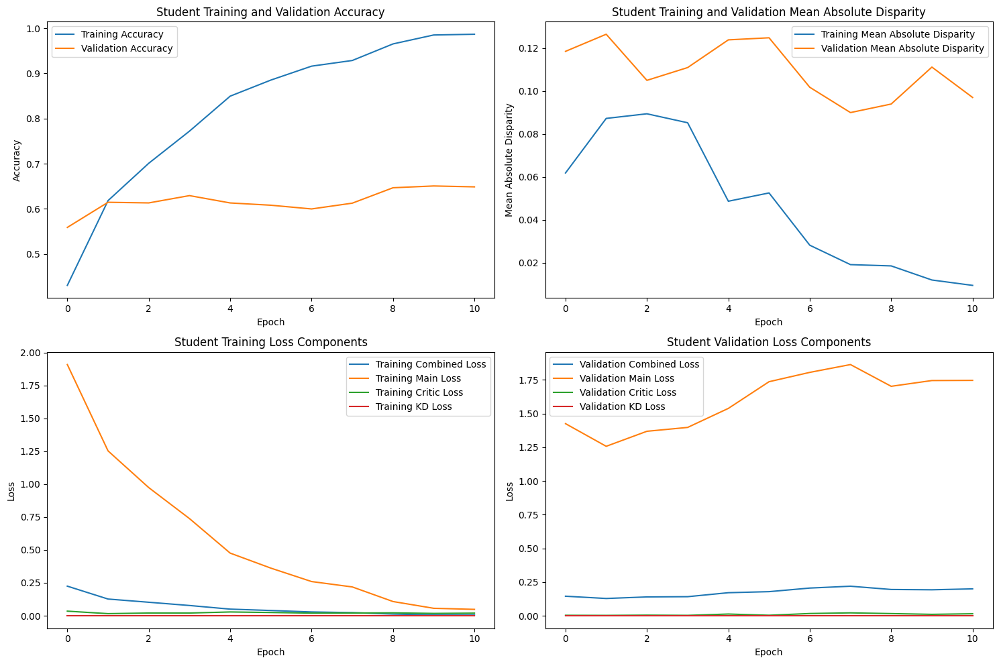

Epoch 12/200, Validation: 100%|████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.77it/s]


Early stopping triggered at epoch 12
Finished Training STUDENT with lambda value of 2. Best epoch number: 2
Training Student with Lambda Value of 3


Epoch 1/200, Validation: 100%|█████████████████████████████████████████████████| 55/55 [00:20<00:00,  2.73it/s]



STUDENT - Lambda 3 - Epoch 1 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.424788, VALIDATION Accuracy: 0.5234
TRAINING Disparity: 0.061586, VALIDATION Disparity: 0.1088
TRAINING Combined Loss: 0.239529, VALIDATION Combined Loss: 0.1666
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.06472411835766345
Class Celebration: Val Disparity = 0.13182831661092528
Class Parade: Val Disparity = -0.05735349921396449
Class Waiter_Or_Waitress: Val Disparity = 0.16249999999999998
Class Individual_Sports: Val Disparity = -0.12043512043512039
Class Surgeons: Val Disparity = 0.13684210526315793
Class Spa: Val Disparity = 0.0
Class Law_Enforcement: Val Disparity = 0.14015151515151514
Class Business: Val Disparity = 0.18419836747266305
Class Dresses: Val Disparity = -0.25666525603046975
Class Water_Activities: Val Disparity = 0.08675958188153321
Class Picnic: Val Disparity = -0.027777777777777776
Class Rescue: Val Disparity = 0.

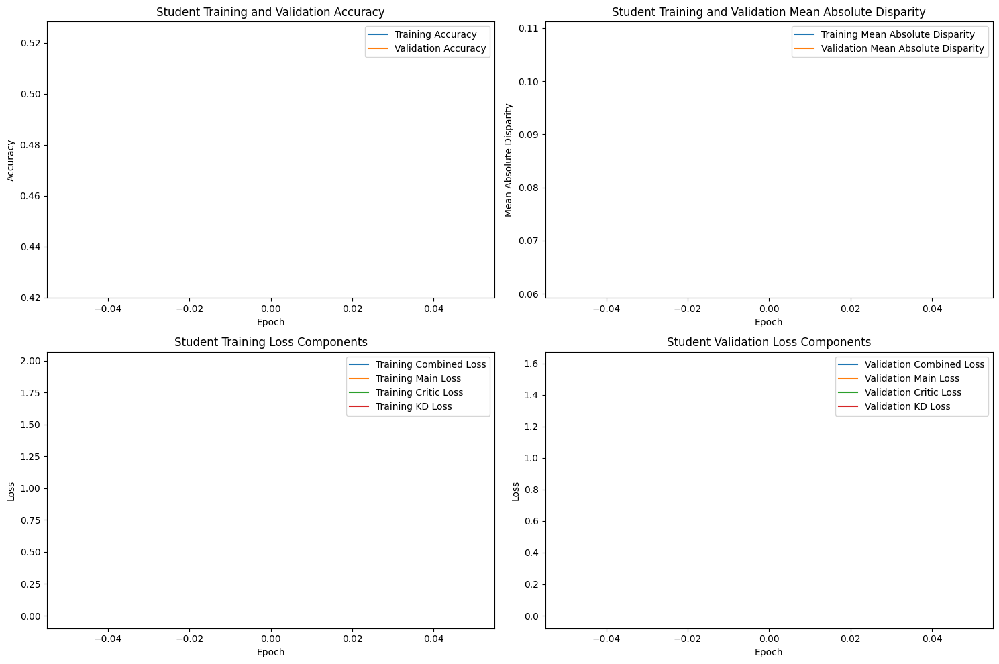

Epoch 2/200, Validation: 100%|█████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.81it/s]



STUDENT - Lambda 3 - Epoch 2 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.577025, VALIDATION Accuracy: 0.5801
TRAINING Disparity: 0.085756, VALIDATION Disparity: 0.1147
TRAINING Combined Loss: 0.146604, VALIDATION Combined Loss: 0.1557
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.13052527398954972
Class Celebration: Val Disparity = -0.01672240802675584
Class Parade: Val Disparity = -0.01816013443920428
Class Waiter_Or_Waitress: Val Disparity = 0.1802083333333333
Class Individual_Sports: Val Disparity = -0.15190365190365185
Class Surgeons: Val Disparity = -0.015311004784689053
Class Spa: Val Disparity = -0.06644518272425248
Class Law_Enforcement: Val Disparity = 0.12716450216450215
Class Business: Val Disparity = 0.23070999537963954
Class Dresses: Val Disparity = -0.3135844265763862
Class Water_Activities: Val Disparity = 0.0764808362369338
Class Picnic: Val Disparity = 0.01388888888888884
Class Rescue: Val

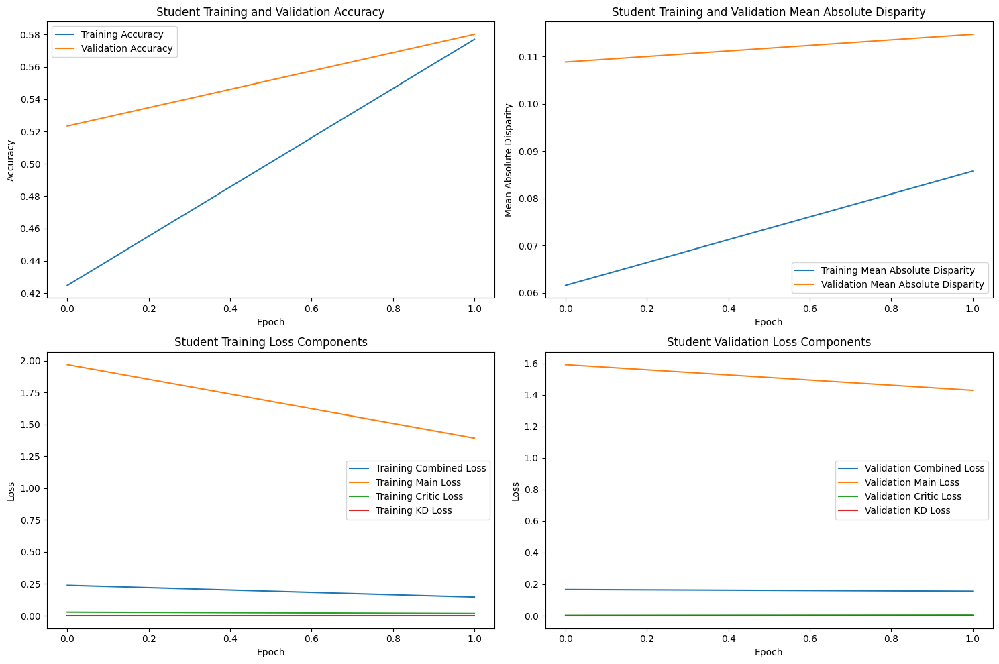

Epoch 3/200, Validation: 100%|█████████████████████████████████████████████████| 55/55 [00:20<00:00,  2.72it/s]



STUDENT - Lambda 3 - Epoch 3 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.660455, VALIDATION Accuracy: 0.6268
TRAINING Disparity: 0.084924, VALIDATION Disparity: 0.1211
TRAINING Combined Loss: 0.123645, VALIDATION Combined Loss: 0.1297
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.1152575428995588
Class Celebration: Val Disparity = 0.06103678929765877
Class Parade: Val Disparity = -0.06434650620697124
Class Waiter_Or_Waitress: Val Disparity = 0.014583333333333282
Class Individual_Sports: Val Disparity = -0.0862470862470861
Class Surgeons: Val Disparity = -0.002870813397129246
Class Spa: Val Disparity = -0.3388704318936877
Class Law_Enforcement: Val Disparity = 0.11147186147186161
Class Business: Val Disparity = 0.23394424765131688
Class Dresses: Val Disparity = -0.40837917900973353
Class Water_Activities: Val Disparity = 0.019686411149825833
Class Picnic: Val Disparity = 0.09722222222222221
Class Rescue: Va

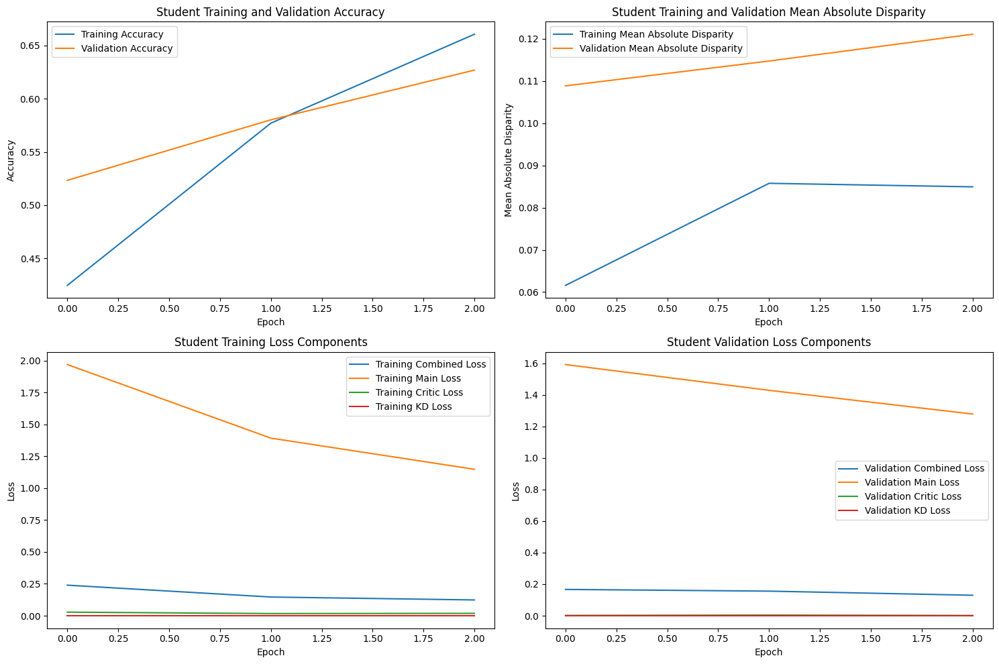

Epoch 4/200, Validation: 100%|█████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.78it/s]



STUDENT - Lambda 3 - Epoch 4 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.744657, VALIDATION Accuracy: 0.6171
TRAINING Disparity: 0.079656, VALIDATION Disparity: 0.1155
TRAINING Combined Loss: 0.091618, VALIDATION Combined Loss: 0.1410
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.1152575428995588
Class Celebration: Val Disparity = 0.06103678929765877
Class Parade: Val Disparity = -0.06434650620697124
Class Waiter_Or_Waitress: Val Disparity = 0.014583333333333282
Class Individual_Sports: Val Disparity = -0.0862470862470861
Class Surgeons: Val Disparity = -0.002870813397129246
Class Spa: Val Disparity = -0.3388704318936877
Class Law_Enforcement: Val Disparity = 0.11147186147186161
Class Business: Val Disparity = 0.23394424765131688
Class Dresses: Val Disparity = -0.40837917900973353
Class Water_Activities: Val Disparity = 0.019686411149825833
Class Picnic: Val Disparity = 0.09722222222222221
Class Rescue: Va

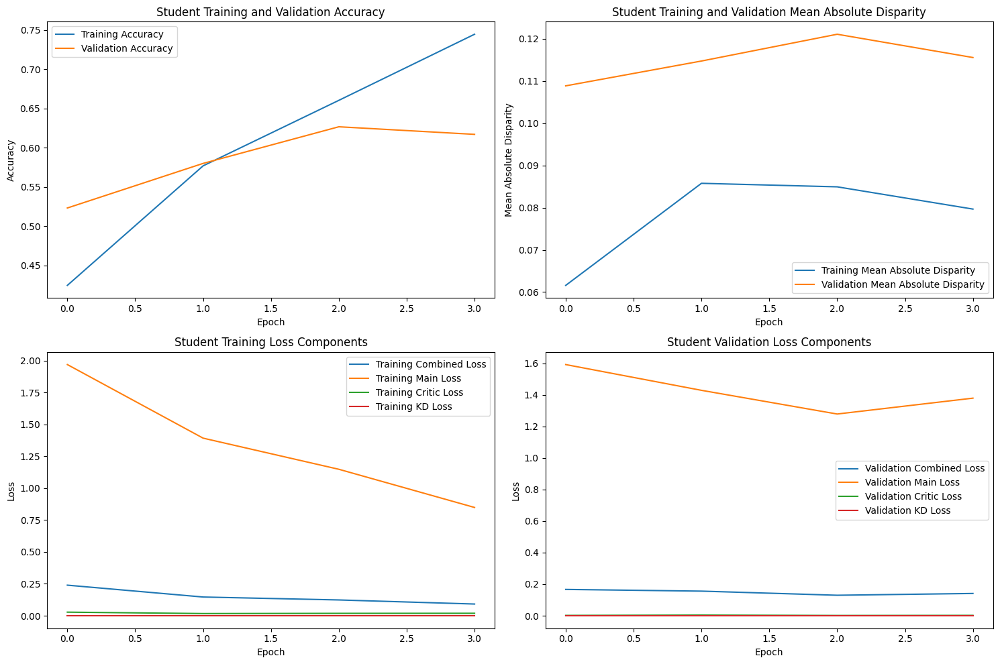

Epoch 5/200, Validation: 100%|█████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.77it/s]



STUDENT - Lambda 3 - Epoch 5 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.818133, VALIDATION Accuracy: 0.6007
TRAINING Disparity: 0.074298, VALIDATION Disparity: 0.1082
TRAINING Combined Loss: 0.063230, VALIDATION Combined Loss: 0.1611
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.1152575428995588
Class Celebration: Val Disparity = 0.06103678929765877
Class Parade: Val Disparity = -0.06434650620697124
Class Waiter_Or_Waitress: Val Disparity = 0.014583333333333282
Class Individual_Sports: Val Disparity = -0.0862470862470861
Class Surgeons: Val Disparity = -0.002870813397129246
Class Spa: Val Disparity = -0.3388704318936877
Class Law_Enforcement: Val Disparity = 0.11147186147186161
Class Business: Val Disparity = 0.23394424765131688
Class Dresses: Val Disparity = -0.40837917900973353
Class Water_Activities: Val Disparity = 0.019686411149825833
Class Picnic: Val Disparity = 0.09722222222222221
Class Rescue: Va

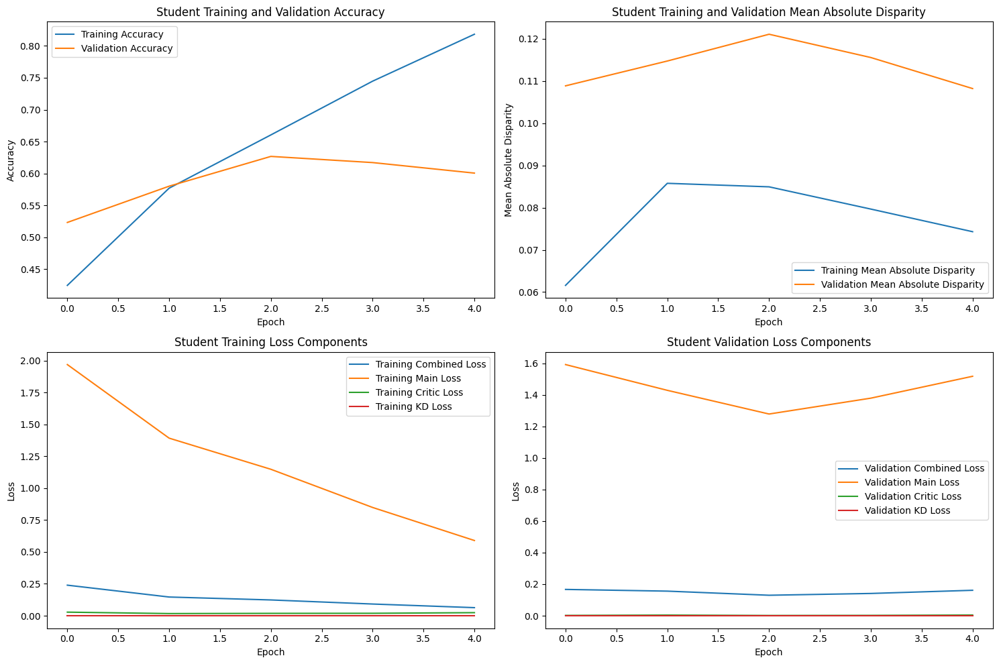

Epoch 6/200, Validation: 100%|█████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.78it/s]



STUDENT - Lambda 3 - Epoch 6 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.857697, VALIDATION Accuracy: 0.6038
TRAINING Disparity: 0.051544, VALIDATION Disparity: 0.1053
TRAINING Combined Loss: 0.053673, VALIDATION Combined Loss: 0.1922
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.1152575428995588
Class Celebration: Val Disparity = 0.06103678929765877
Class Parade: Val Disparity = -0.06434650620697124
Class Waiter_Or_Waitress: Val Disparity = 0.014583333333333282
Class Individual_Sports: Val Disparity = -0.0862470862470861
Class Surgeons: Val Disparity = -0.002870813397129246
Class Spa: Val Disparity = -0.3388704318936877
Class Law_Enforcement: Val Disparity = 0.11147186147186161
Class Business: Val Disparity = 0.23394424765131688
Class Dresses: Val Disparity = -0.40837917900973353
Class Water_Activities: Val Disparity = 0.019686411149825833
Class Picnic: Val Disparity = 0.09722222222222221
Class Rescue: Va

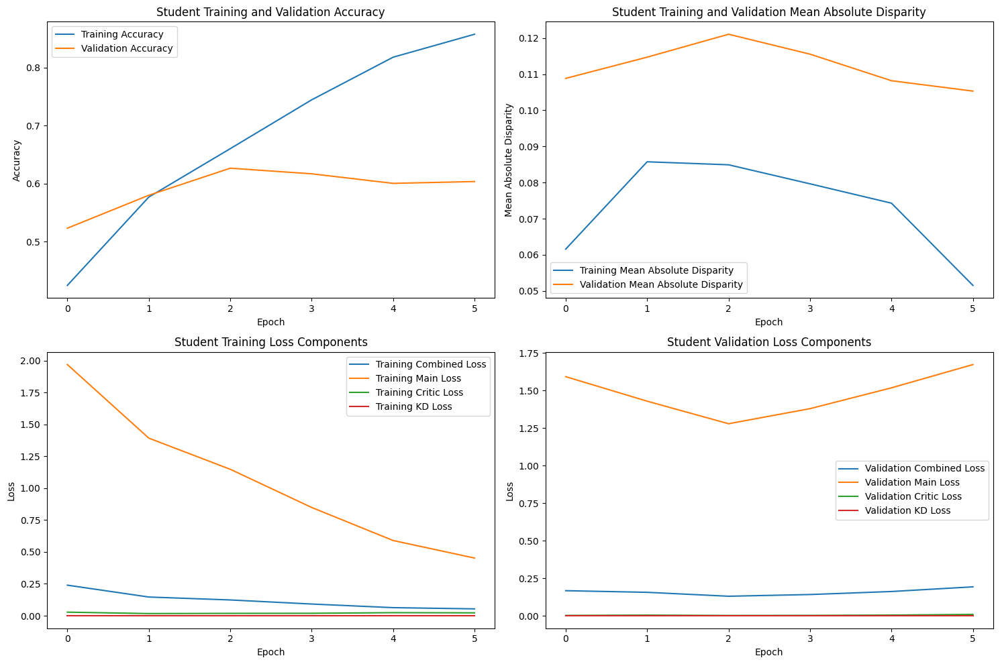

Epoch 7/200, Validation: 100%|█████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.77it/s]



STUDENT - Lambda 3 - Epoch 7 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.894155, VALIDATION Accuracy: 0.6137
TRAINING Disparity: 0.037661, VALIDATION Disparity: 0.1026
TRAINING Combined Loss: 0.036960, VALIDATION Combined Loss: 0.1998
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.1152575428995588
Class Celebration: Val Disparity = 0.06103678929765877
Class Parade: Val Disparity = -0.06434650620697124
Class Waiter_Or_Waitress: Val Disparity = 0.014583333333333282
Class Individual_Sports: Val Disparity = -0.0862470862470861
Class Surgeons: Val Disparity = -0.002870813397129246
Class Spa: Val Disparity = -0.3388704318936877
Class Law_Enforcement: Val Disparity = 0.11147186147186161
Class Business: Val Disparity = 0.23394424765131688
Class Dresses: Val Disparity = -0.40837917900973353
Class Water_Activities: Val Disparity = 0.019686411149825833
Class Picnic: Val Disparity = 0.09722222222222221
Class Rescue: Va

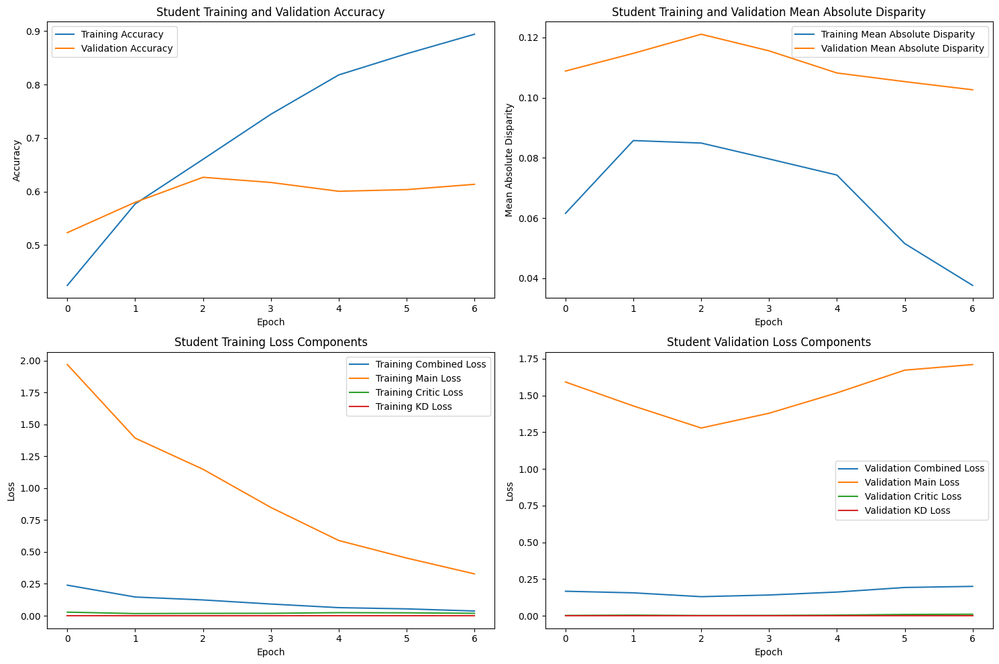

Epoch 8/200, Validation: 100%|█████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.79it/s]



STUDENT - Lambda 3 - Epoch 8 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.933333, VALIDATION Accuracy: 0.6160
TRAINING Disparity: 0.026295, VALIDATION Disparity: 0.0917
TRAINING Combined Loss: 0.024648, VALIDATION Combined Loss: 0.2446
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.1152575428995588
Class Celebration: Val Disparity = 0.06103678929765877
Class Parade: Val Disparity = -0.06434650620697124
Class Waiter_Or_Waitress: Val Disparity = 0.014583333333333282
Class Individual_Sports: Val Disparity = -0.0862470862470861
Class Surgeons: Val Disparity = -0.002870813397129246
Class Spa: Val Disparity = -0.3388704318936877
Class Law_Enforcement: Val Disparity = 0.11147186147186161
Class Business: Val Disparity = 0.23394424765131688
Class Dresses: Val Disparity = -0.40837917900973353
Class Water_Activities: Val Disparity = 0.019686411149825833
Class Picnic: Val Disparity = 0.09722222222222221
Class Rescue: Va

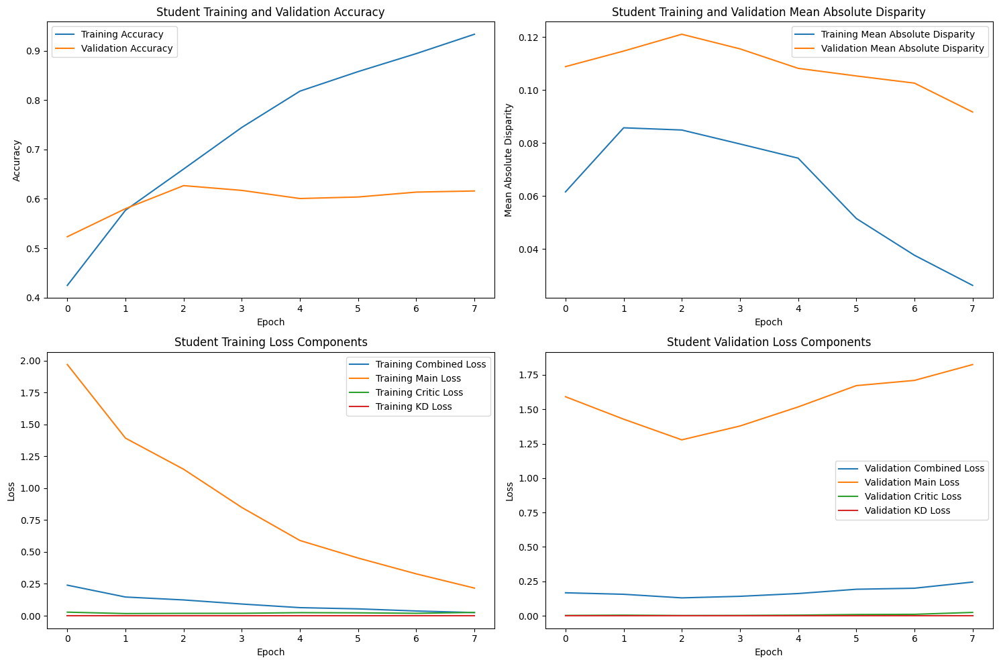

Epoch 9/200, Validation: 100%|█████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.76it/s]



STUDENT - Lambda 3 - Epoch 9 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.935243, VALIDATION Accuracy: 0.6214
TRAINING Disparity: 0.030552, VALIDATION Disparity: 0.1048
TRAINING Combined Loss: 0.022889, VALIDATION Combined Loss: 0.2160
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.1152575428995588
Class Celebration: Val Disparity = 0.06103678929765877
Class Parade: Val Disparity = -0.06434650620697124
Class Waiter_Or_Waitress: Val Disparity = 0.014583333333333282
Class Individual_Sports: Val Disparity = -0.0862470862470861
Class Surgeons: Val Disparity = -0.002870813397129246
Class Spa: Val Disparity = -0.3388704318936877
Class Law_Enforcement: Val Disparity = 0.11147186147186161
Class Business: Val Disparity = 0.23394424765131688
Class Dresses: Val Disparity = -0.40837917900973353
Class Water_Activities: Val Disparity = 0.019686411149825833
Class Picnic: Val Disparity = 0.09722222222222221
Class Rescue: Va

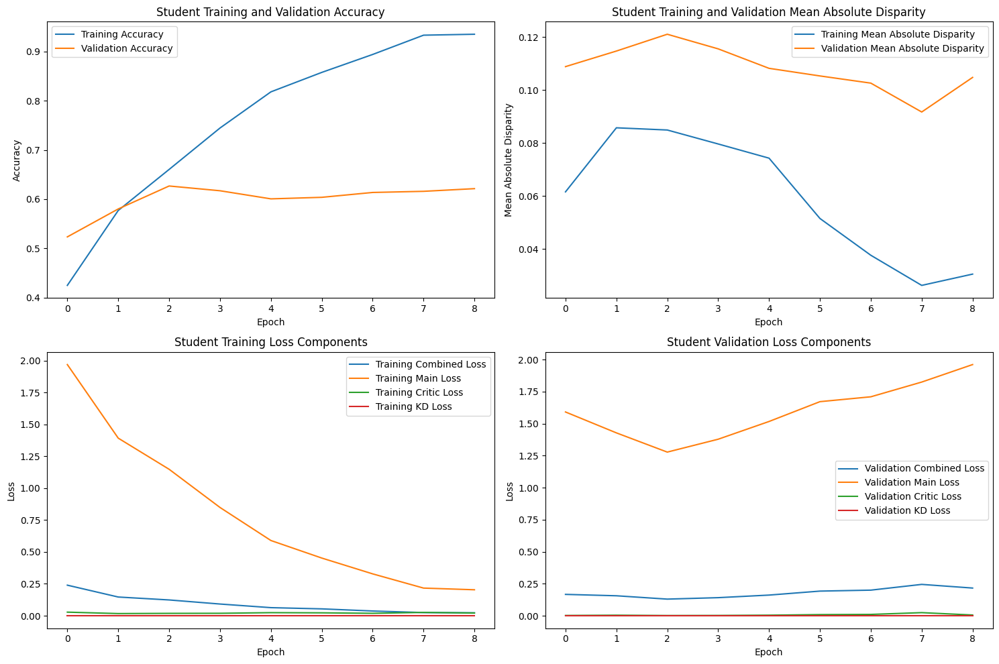

Epoch 10/200, Validation: 100%|████████████████████████████████████████████████| 55/55 [00:20<00:00,  2.73it/s]



STUDENT - Lambda 3 - Epoch 10 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.967863, VALIDATION Accuracy: 0.6356
TRAINING Disparity: 0.019220, VALIDATION Disparity: 0.1020
TRAINING Combined Loss: 0.012854, VALIDATION Combined Loss: 0.2079
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.1152575428995588
Class Celebration: Val Disparity = 0.06103678929765877
Class Parade: Val Disparity = -0.06434650620697124
Class Waiter_Or_Waitress: Val Disparity = 0.014583333333333282
Class Individual_Sports: Val Disparity = -0.0862470862470861
Class Surgeons: Val Disparity = -0.002870813397129246
Class Spa: Val Disparity = -0.3388704318936877
Class Law_Enforcement: Val Disparity = 0.11147186147186161
Class Business: Val Disparity = 0.23394424765131688
Class Dresses: Val Disparity = -0.40837917900973353
Class Water_Activities: Val Disparity = 0.019686411149825833
Class Picnic: Val Disparity = 0.09722222222222221
Class Rescue: V

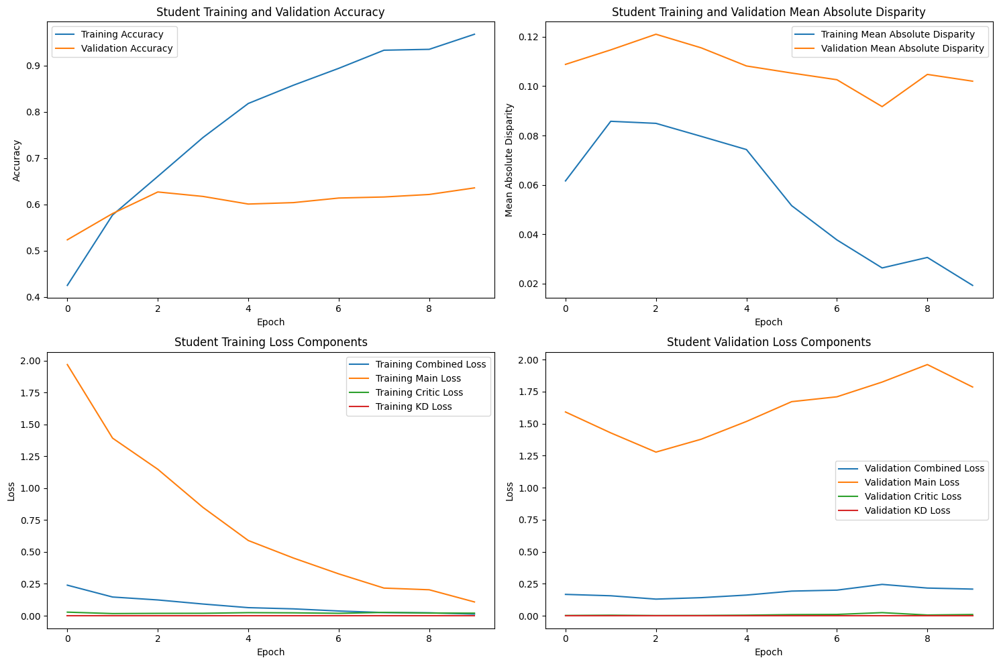

Epoch 11/200, Validation: 100%|████████████████████████████████████████████████| 55/55 [00:20<00:00,  2.72it/s]



STUDENT - Lambda 3 - Epoch 11 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.983835, VALIDATION Accuracy: 0.6373
TRAINING Disparity: 0.017308, VALIDATION Disparity: 0.1020
TRAINING Combined Loss: 0.006936, VALIDATION Combined Loss: 0.2354
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.1152575428995588
Class Celebration: Val Disparity = 0.06103678929765877
Class Parade: Val Disparity = -0.06434650620697124
Class Waiter_Or_Waitress: Val Disparity = 0.014583333333333282
Class Individual_Sports: Val Disparity = -0.0862470862470861
Class Surgeons: Val Disparity = -0.002870813397129246
Class Spa: Val Disparity = -0.3388704318936877
Class Law_Enforcement: Val Disparity = 0.11147186147186161
Class Business: Val Disparity = 0.23394424765131688
Class Dresses: Val Disparity = -0.40837917900973353
Class Water_Activities: Val Disparity = 0.019686411149825833
Class Picnic: Val Disparity = 0.09722222222222221
Class Rescue: V

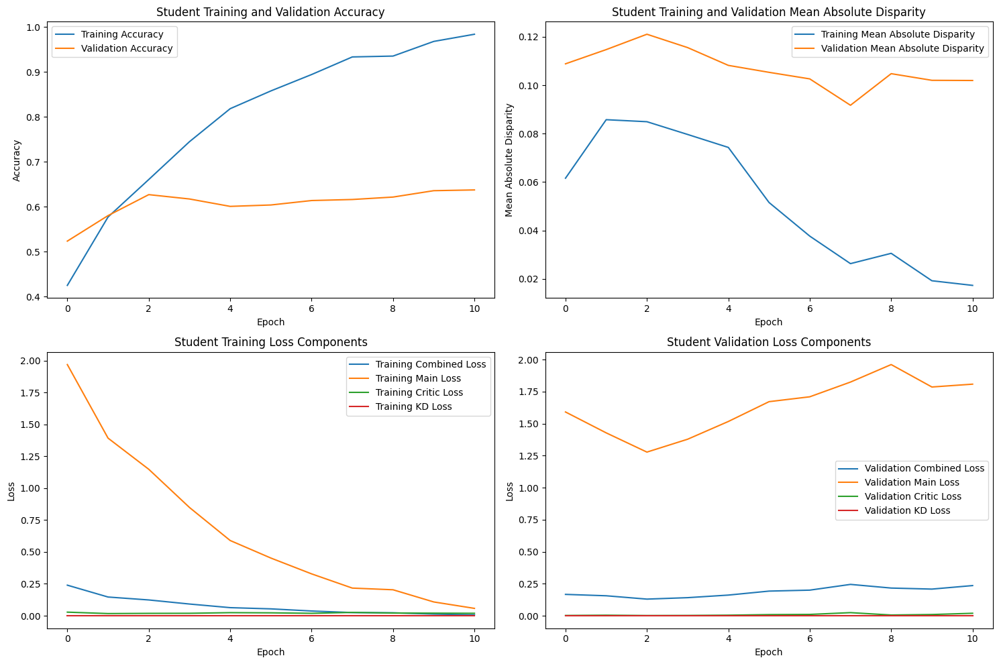

Epoch 12/200, Validation: 100%|████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.76it/s]



STUDENT - Lambda 3 - Epoch 12 Metrics:
--------------------------------------------------
TRAINING Accuracy: 0.987056, VALIDATION Accuracy: 0.6396
TRAINING Disparity: 0.013157, VALIDATION Disparity: 0.0986
TRAINING Combined Loss: 0.006107, VALIDATION Combined Loss: 0.2103
--------------------------------------------------

Class Team_Sports: Val Disparity = 0.1152575428995588
Class Celebration: Val Disparity = 0.06103678929765877
Class Parade: Val Disparity = -0.06434650620697124
Class Waiter_Or_Waitress: Val Disparity = 0.014583333333333282
Class Individual_Sports: Val Disparity = -0.0862470862470861
Class Surgeons: Val Disparity = -0.002870813397129246
Class Spa: Val Disparity = -0.3388704318936877
Class Law_Enforcement: Val Disparity = 0.11147186147186161
Class Business: Val Disparity = 0.23394424765131688
Class Dresses: Val Disparity = -0.40837917900973353
Class Water_Activities: Val Disparity = 0.019686411149825833
Class Picnic: Val Disparity = 0.09722222222222221
Class Rescue: V

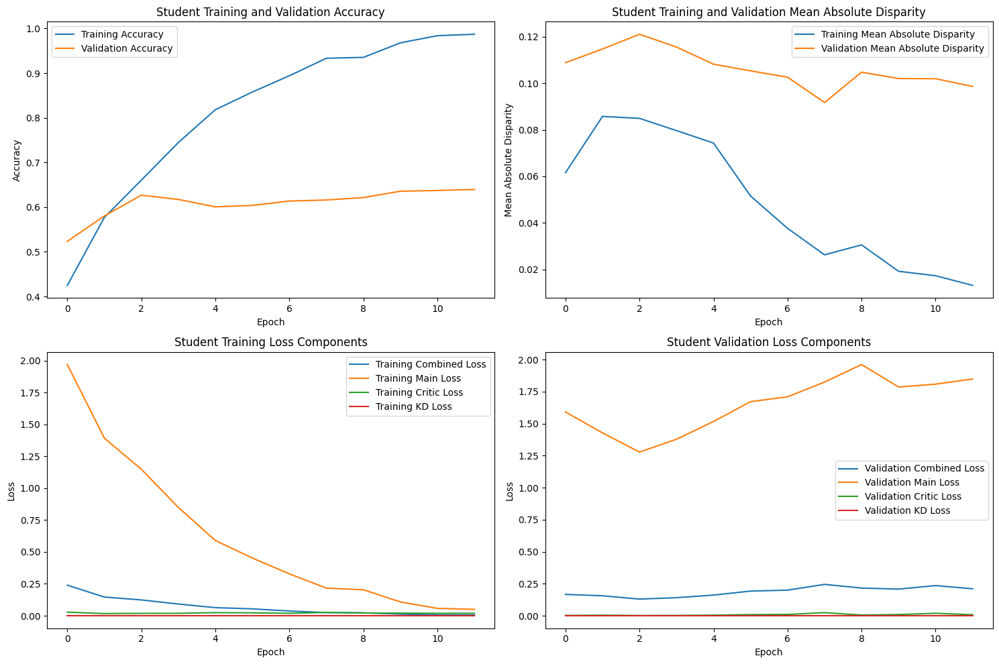

Epoch 13/200, Validation: 100%|████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.77it/s]


Early stopping triggered at epoch 13
Finished Training STUDENT with lambda value of 3. Best epoch number: 3


In [18]:
# # STUDENT
# Create dict to store best model states
student_model_states_best = {}

# Specify the lambda_factor for the teacher model to load
lambda_factor = 0

# Define the path to the saved model file for this lambda_factor
lambda_dir = os.path.join(base_save_dir, f'TEACHER_lambda_{lambda_factor}')
teacher_path = os.path.join(lambda_dir, f'TEACHER_best_model_lambda_{lambda_factor}.pth')

# Initialize the EfficientNet model without pre-trained weights
teacher = models.efficientnet_b3(pretrained=False)

# Adjust the classifier layer to match the number of classes
num_ftrs = teacher.classifier[1].in_features
teacher.classifier[1] = nn.Linear(num_ftrs, num_classes)

# Load the model state
teacher_best_model_state = torch.load(teacher_path)
teacher.load_state_dict(teacher_best_model_state['teacher_state_dict'])


# Loop through the lambda_factor_list
for lambda_factor in student_lambda_factor_list:
    # Load EfficientNet B0 model for Student
    student = models.efficientnet_b0(pretrained=True)
    
    # Determine the number of output features from the feature extractor part of EfficientNet B0
    num_ftrs = student.classifier[1].in_features
    
    # Modify the classifier layer of the EfficientNet model to match the number of classes
    student.classifier[1] = nn.Linear(num_ftrs, num_classes)
    

    # Initialize the Critic model
    critic = Critic(input_size=num_classes)
    critic_optimizer = optim.Adam(critic.parameters(), lr=student_learning_rate, weight_decay=weight_decay)
    critic_scheduler = lr_scheduler.ReduceLROnPlateau(critic_optimizer, mode='min', factor=0.2, patience=5, min_lr=0.0001)
    critic_loss_fn = torch.nn.MSELoss()
    
    student_optimizer = optim.Adam(student.parameters(), lr=student_learning_rate, weight_decay=weight_decay)
    student_scheduler = lr_scheduler.ReduceLROnPlateau(student_optimizer, mode='min', factor=0.2, patience=5, min_lr=0.00001)
    
    student_criterion = nn.KLDivLoss(reduction='batchmean')
    student_loss_fn = nn.CrossEntropyLoss()

    # Train the model
    student_best_model_state = train_student(student, teacher, student_optimizer, student_loss_fn, student_criterion, critic, critic_optimizer,
                                             critic_loss_fn, lambda_factor, temperature, alpha, epsilon, margin, 
                                             student_patience, student_epochs, device, base_save_dir=base_save_dir, 
                                             student_scheduler=student_scheduler, critic_scheduler=critic_scheduler)
    student_model_states_best[lambda_factor] = student_best_model_state

# Save the collective best model states to a file
student_collective_save_path = os.path.join(base_save_dir, 'student_model_states_best.pth')
torch.save(student_model_states_best, student_collective_save_path)

In [19]:
# load models
collective_save_path = os.path.join(base_save_dir, 'student_model_states_best.pth')

# Load the saved model states
teacher_model_states_best = torch.load(collective_save_path)

# Example: Accessing the best_val_accuracy for a specific lambda value
lambda_value = 0
if lambda_value in teacher_model_states_best:
    best_model_state = teacher_model_states_best[lambda_value]
    best_val_accuracy = best_model_state['best_val_accuracy']
    print(f"Best validation accuracy for lambda {lambda_value}: {best_val_accuracy}")
else:
    print(f"No model state found for lambda {lambda_value}")

No model state found for lambda 0


### PLOTTING

In [20]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Load the student model architecture and weights
teacher_model = torch.load('teacher_model_ctkd_cifar100.pth')
teacher_model.load_state_dict(torch.load('teacher_model_weights_ctkd_cifar100.pth'))
teacher_model = teacher_model.to(device)


# Load the student model architecture and weights
student_model = torch.load('student_model_ctkd_cifar100.pth')
student_model.load_state_dict(torch.load('student_model_weights_ctkd_cifar100.pth'))
student_model = student_model.to(device)

In [21]:
def compare_performance_metrics(teacher, student, dataloader):
    teacher.eval()
    student.eval()
    
    all_labels = []
    all_teacher_preds = []
    all_student_preds = []

    for batch in dataloader:
        inputs = batch['img'].to(device)
        labels = batch['label'].to(device)
        
        with torch.no_grad():
            teacher_outputs = teacher(inputs)
            student_outputs = student(inputs)
            
        teacher_preds = torch.argmax(teacher_outputs, dim=1).cpu().numpy()
        student_preds = torch.argmax(student_outputs, dim=1).cpu().numpy()
        
        all_labels.append(labels.cpu().numpy())
        all_teacher_preds.append(teacher_preds)
        all_student_preds.append(student_preds)

    all_labels = np.concatenate(all_labels)
    all_teacher_preds = np.concatenate(all_teacher_preds)
    all_student_preds = np.concatenate(all_student_preds)
    
    metrics = {
        'accuracy': (accuracy_score(all_labels, all_teacher_preds), accuracy_score(all_labels, all_student_preds)),
        'precision': (precision_score(all_labels, all_teacher_preds, average='weighted', zero_division=0), precision_score(all_labels, all_student_preds, average='weighted', zero_division=0)),
        'recall': (recall_score(all_labels, all_teacher_preds, average='weighted'), recall_score(all_labels, all_student_preds, average='weighted')),
        'f1': (f1_score(all_labels, all_teacher_preds, average='weighted'), f1_score(all_labels, all_student_preds, average='weighted'))
    }

    return {
        'metrics': metrics,
        'all_labels': all_labels,
        'all_teacher_preds': all_teacher_preds,
        'all_student_preds': all_student_preds
    }

def compare_model_size(teacher, student):
    teacher_params = sum(p.numel() for p in teacher.parameters())
    student_params = sum(p.numel() for p in student.parameters())
    return teacher_params, student_params

def compare_inference_time(teacher, student, dataloader):
    dataiter = iter(dataloader)
    data = next(dataiter)
    inputs = data['img']
    inputs = inputs.to(device)

    teacher_time, student_time = 0, 0

    if teacher is not None:
        teacher = teacher.to(device)
        start_time = time.time()
        with torch.no_grad():
            teacher_outputs = teacher(inputs)
        teacher_time = time.time() - start_time

    if student is not None:
        student = student.to(device)
        start_time = time.time()
        with torch.no_grad():
            student_outputs = student(inputs)
        student_time = time.time() - start_time
    
    return teacher_time, student_time

In [22]:
lambda_results = {}

# Loop through each lambda value
for lmda_teacher in teacher_lambda_factor_list:
    for lmda_student in student_lambda_factor_list:

        # Define the path to the saved model file for this lambda_factor
        lambda_dir = os.path.join(base_save_dir, f'TEACHER_lambda_{lmda_teacher}')
        teacher_path = os.path.join(lambda_dir, f'TEACHER_best_model_lambda_{lmda_teacher}.pth')
        
        # Initialize the EfficientNet model without pre-trained weights
        teacher_model = models.efficientnet_b3(pretrained=False)
        
        # Adjust the classifier layer to match the number of classes
        num_ftrs = teacher.classifier[1].in_features
        teacher_model.classifier[1] = nn.Linear(num_ftrs, num_classes)
        
        # Load the model state
        teacher_best_model_state = torch.load(teacher_path)
        teacher_model.load_state_dict(teacher_best_model_state['teacher_state_dict'])
        teacher_model = teacher_model.to(device)
        
        # Define the path to the saved model file for this lambda_factor
        lambda_dir = os.path.join(base_save_dir, f'STUDENT_lambda_{lmda_student}')
        student_path = os.path.join(lambda_dir, f'STUDENT_best_model_lambda_{lmda_student}.pth')
        
        # Initialize the EfficientNet model without pre-trained weights
        student_model = models.efficientnet_b0(pretrained=False)
        
        # Adjust the classifier layer to match the number of classes
        num_ftrs = student_model.classifier[1].in_features
        student_model.classifier[1] = nn.Linear(num_ftrs, num_classes)
        
        # Load the model state
        student_best_model_state = torch.load(student_path)
        student_model.load_state_dict(student_best_model_state['student_state_dict'])
        student_model = student_model.to(device)
        
        # Compute performance metrics
        performance_metrics = compare_performance_metrics(teacher_model, student_model, testloader)
    
        # Compute model sizes
        teacher_params, student_params = compare_model_size(teacher_model, student_model)
    
        # Construct a unique key for the current combination of lambda values
        lambda_key = (lmda_teacher, lmda_student)

        # Update results for the current lambda value
        if lambda_key in lambda_results:
            lambda_results[lambda_key].update({
                'performance_metrics': performance_metrics,
                'teacher_params': teacher_params,
                'student_params': student_params
            })
        else:
            lambda_results[lambda_key] = {
                'performance_metrics': performance_metrics,
                'teacher_params': teacher_params,
                'student_params': student_params
            }

teacher: (0.6565656565656566, 0.6565656565656566, 0.6565656565656566, 0.6565656565656566, 0.6565656565656566)
student: (0.640981240981241, 0.6317460317460317, 0.6216450216450217, 0.6207792207792208, 0.6314574314574315)


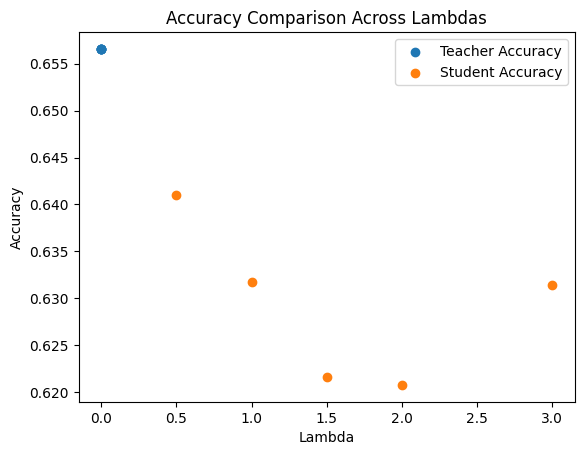

In [23]:
# Initialize lists to store accuracies
teacher_accuracies = []
student_accuracies = []
lambda_pairs = list(lambda_results.keys())

# Iterate over the keys in lambda_results
for key in lambda_pairs:
    # Check if the key is a tuple (indicating a lambda pair)
    if isinstance(key, tuple) and len(key) == 2:
        lmda_teacher, lmda_student = key
    else:
        # If the key is not a tuple, skip this iteration
        continue

    # Access the performance metrics for each pair
    teacher_accuracy = lambda_results[(lmda_teacher, lmda_student)]['performance_metrics']['metrics']['accuracy'][0]
    student_accuracy = lambda_results[(lmda_teacher, lmda_student)]['performance_metrics']['metrics']['accuracy'][1]

    # Append accuracies to the lists
    teacher_accuracies.append((lmda_teacher, teacher_accuracy))
    student_accuracies.append((lmda_student, student_accuracy))

# To plot, you might need to separate the lambda values and accuracies
teacher_lambdas, teacher_acc = zip(*teacher_accuracies)
student_lambdas, student_acc = zip(*student_accuracies)

print(f'teacher: {teacher_acc}')
print(f'student: {student_acc}')

# Plotting only with markers and no lines
plt.scatter(teacher_lambdas, teacher_acc, label='Teacher Accuracy', marker='o')
plt.scatter(student_lambdas, student_acc, label='Student Accuracy', marker='o')

# Adding labels and title
plt.xlabel('Lambda')
plt.ylabel('Accuracy')
plt.title('Accuracy Comparison Across Lambdas')
plt.legend()

# Show plot
plt.show()

teacher: (0.6599780239318565, 0.6599780239318565, 0.6599780239318565, 0.6599780239318565, 0.6599780239318565)
student: (0.6476420422755331, 0.632779549265147, 0.6242777818065355, 0.6206442090181634, 0.6340920606848995)


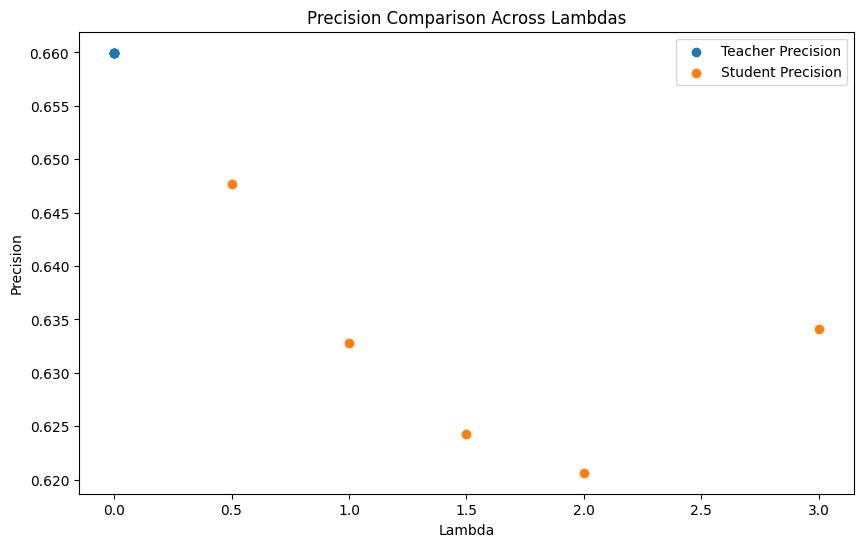

In [24]:
# Initialize lists to store precisions
teacher_precisions = []
student_precisions = []
lambda_pairs = list(lambda_results.keys())

# Iterate over the keys in lambda_results
for key in lambda_pairs:
    # Check if the key is a tuple (indicating a lambda pair)
    if isinstance(key, tuple) and len(key) == 2:
        lmda_teacher, lmda_student = key
        # Access the precision metrics for each pair
        teacher_precision = lambda_results[(lmda_teacher, lmda_student)]['performance_metrics']['metrics']['precision'][0]
        student_precision = lambda_results[(lmda_teacher, lmda_student)]['performance_metrics']['metrics']['precision'][1]
    else:
        # If the key is not a tuple, skip this iteration
        continue

    # Append precisions to the lists along with lambda values
    teacher_precisions.append((lmda_teacher, teacher_precision))
    student_precisions.append((lmda_student, student_precision))

# Extracting lambda values and precisions
teacher_lambdas, teacher_prec = zip(*teacher_precisions)
student_lambdas, student_prec = zip(*student_precisions)

print(f'teacher: {teacher_prec}')
print(f'student: {student_prec}')

# Creating a scatter plot
plt.figure(figsize=(10, 6))
plt.scatter(teacher_lambdas, teacher_prec, label='Teacher Precision', marker='o')
plt.scatter(student_lambdas, student_prec, label='Student Precision', marker='o')

# Adding labels and title
plt.xlabel('Lambda')
plt.ylabel('Precision')
plt.title('Precision Comparison Across Lambdas')
plt.legend()

# Displaying the plot
plt.show()

teacher: (0.6565656565656566, 0.6565656565656566, 0.6565656565656566, 0.6565656565656566, 0.6565656565656566)
student: (0.640981240981241, 0.6317460317460317, 0.6216450216450217, 0.6207792207792208, 0.6314574314574315)


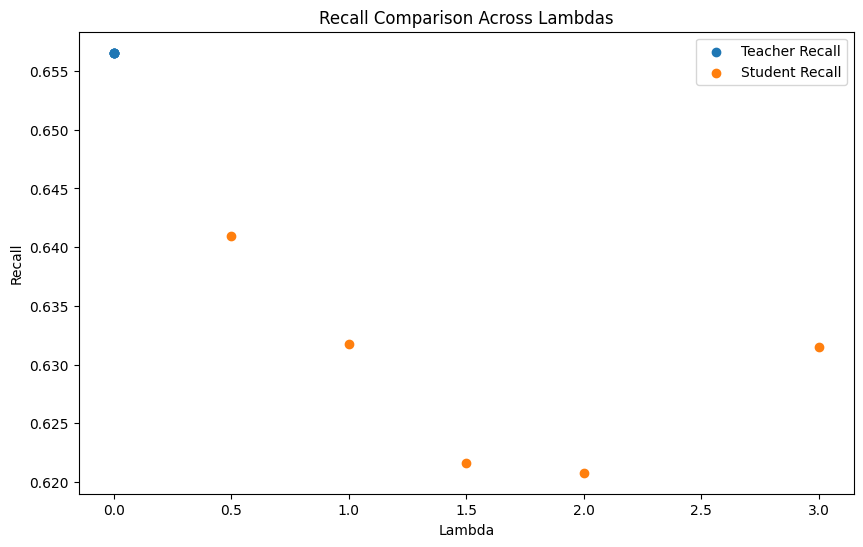

In [25]:
# Initialize lists to store recalls
teacher_recalls = []
student_recalls = []
lambda_pairs = list(lambda_results.keys())

# Iterate over the keys in lambda_results
for key in lambda_pairs:
    # Check if the key is a tuple (indicating a lambda pair)
    if isinstance(key, tuple) and len(key) == 2:
        lmda_teacher, lmda_student = key
        # Access the recall metrics for each pair
        teacher_recall = lambda_results[(lmda_teacher, lmda_student)]['performance_metrics']['metrics']['recall'][0]
        student_recall = lambda_results[(lmda_teacher, lmda_student)]['performance_metrics']['metrics']['recall'][1]
    else:
        # If the key is not a tuple, skip this iteration
        continue

    # Append recalls to the lists along with lambda values
    teacher_recalls.append((lmda_teacher, teacher_recall))
    student_recalls.append((lmda_student, student_recall))

# Extracting lambda values and recalls
teacher_lambdas, teacher_rec = zip(*teacher_recalls)
student_lambdas, student_rec = zip(*student_recalls)

print(f'teacher: {teacher_rec}')
print(f'student: {student_rec}')

# Creating a scatter plot
plt.figure(figsize=(10, 6))
plt.scatter(teacher_lambdas, teacher_rec, label='Teacher Recall', marker='o')
plt.scatter(student_lambdas, student_rec, label='Student Recall', marker='o')

# Adding labels and title
plt.xlabel('Lambda')
plt.ylabel('Recall')
plt.title('Recall Comparison Across Lambdas')
plt.legend()

# Displaying the plot
plt.show()

teacher: (0.650217149745964, 0.650217149745964, 0.650217149745964, 0.650217149745964, 0.650217149745964)
student: (0.6381219666462885, 0.625062674746128, 0.6149824267696903, 0.6137041860390068, 0.6286435299696876)


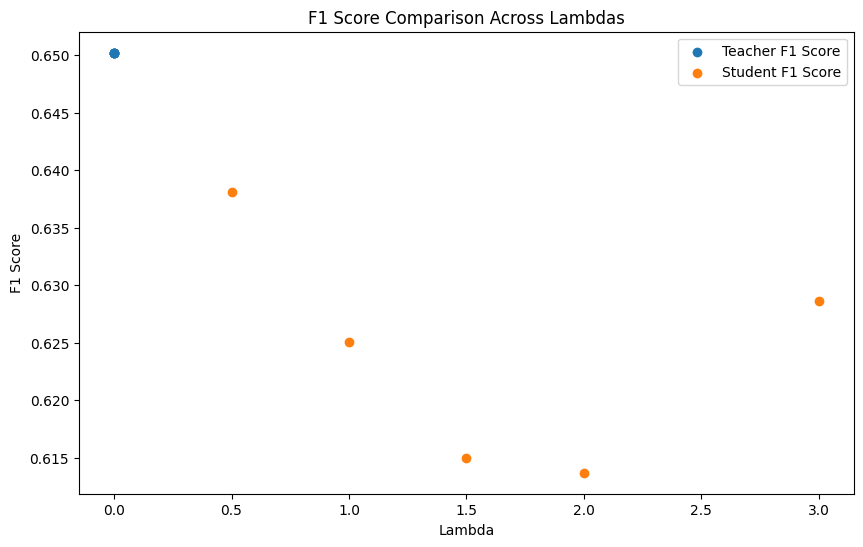

In [26]:
# Initialize lists to store F1 scores
teacher_f1s = []
student_f1s = []
lambda_pairs = list(lambda_results.keys())

# Iterate over the keys in lambda_results
for key in lambda_pairs:
    # Check if the key is a tuple (indicating a lambda pair)
    if isinstance(key, tuple) and len(key) == 2:
        lmda_teacher, lmda_student = key
        # Access the F1 scores for each pair
        teacher_f1 = lambda_results[(lmda_teacher, lmda_student)]['performance_metrics']['metrics']['f1'][0]
        student_f1 = lambda_results[(lmda_teacher, lmda_student)]['performance_metrics']['metrics']['f1'][1]
    else:
        # If the key is not a tuple, skip this iteration
        continue

    # Append F1 scores to the lists along with lambda values
    teacher_f1s.append((lmda_teacher, teacher_f1))
    student_f1s.append((lmda_student, student_f1))

# Extracting lambda values and F1 scores
teacher_lambdas, teacher_f1_scores = zip(*teacher_f1s)
student_lambdas, student_f1_scores = zip(*student_f1s)

print(f'teacher: {teacher_f1_scores}')
print(f'student: {student_f1_scores}')


# Creating a scatter plot
plt.figure(figsize=(10, 6))
plt.scatter(teacher_lambdas, teacher_f1_scores, label='Teacher F1 Score', marker='o')
plt.scatter(student_lambdas, student_f1_scores, label='Student F1 Score', marker='o')

# Adding labels and title
plt.xlabel('Lambda')
plt.ylabel('F1 Score')
plt.title('F1 Score Comparison Across Lambdas')
plt.legend()

# Displaying the plot
plt.show()

teacher: (10.720824, 10.720824, 10.720824, 10.720824, 10.720824)
student: (4.028044, 4.028044, 4.028044, 4.028044, 4.028044)


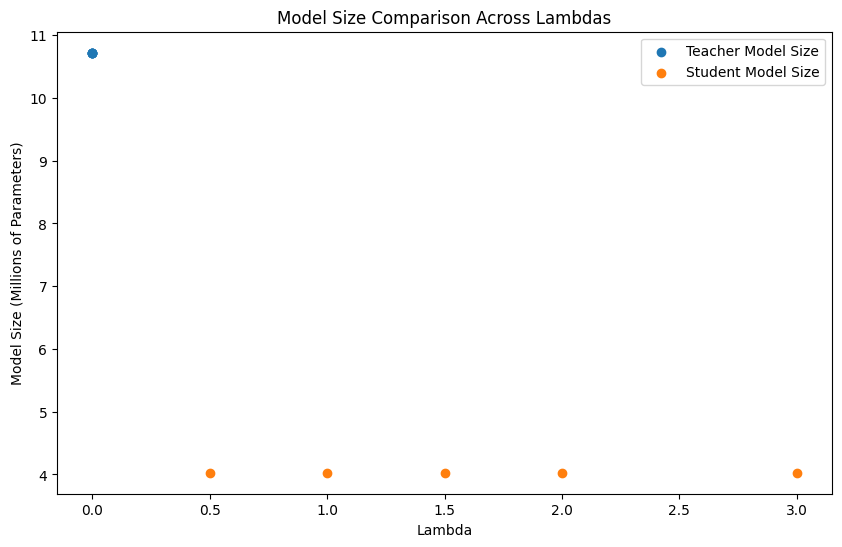

In [27]:
# Initialize lists to store model sizes
teacher_sizes = []
student_sizes = []
lambda_pairs = list(lambda_results.keys())

# Iterate over the keys in lambda_results
for key in lambda_pairs:
    # Check if the key is a tuple (indicating a lambda pair)
    if isinstance(key, tuple) and len(key) == 2:
        lmda_teacher, lmda_student = key
        # Access the model sizes for each pair
        teacher_size = lambda_results[(lmda_teacher, lmda_student)]['teacher_params'] / 1e6  # Convert to millions
        student_size = lambda_results[(lmda_teacher, lmda_student)]['student_params'] / 1e6
    else:
        # If the key is not a tuple, skip this iteration
        continue

    # Append model sizes to the lists along with lambda values
    teacher_sizes.append((lmda_teacher, teacher_size))
    student_sizes.append((lmda_student, student_size))

# Extracting lambda values and model sizes
teacher_lambdas, teacher_model_sizes = zip(*teacher_sizes)
student_lambdas, student_model_sizes = zip(*student_sizes)

print(f'teacher: {teacher_model_sizes}')
print(f'student: {student_model_sizes}')


# Creating a scatter plot
plt.figure(figsize=(10, 6))
plt.scatter(teacher_lambdas, teacher_model_sizes, label='Teacher Model Size', marker='o')
plt.scatter(student_lambdas, student_model_sizes, label='Student Model Size', marker='o')

# Adding labels and title
plt.xlabel('Lambda')
plt.ylabel('Model Size (Millions of Parameters)')
plt.title('Model Size Comparison Across Lambdas')
plt.legend()

# Displaying the plot
plt.show()

In [28]:
# Define the path to the saved model file for this lambda_factor
lambda_dir = os.path.join(base_save_dir, f'TEACHER_lambda_{lmda_teacher}')
teacher_path = os.path.join(lambda_dir, f'TEACHER_best_model_lambda_{lmda_teacher}.pth')

# Initialize the EfficientNet model without pre-trained weights
teacher_model = models.efficientnet_b3(pretrained=False)

# Adjust the classifier layer to match the number of classes
num_ftrs = teacher.classifier[1].in_features
teacher_model.classifier[1] = nn.Linear(num_ftrs, num_classes)

# Load the model state
teacher_best_model_state = torch.load(teacher_path)
teacher_model.load_state_dict(teacher_best_model_state['teacher_state_dict'])
teacher_model = teacher_model.to(device)

# Define the path to the saved model file for this lambda_factor
lambda_dir = os.path.join(base_save_dir, f'STUDENT_lambda_{lmda_student}')
student_path = os.path.join(lambda_dir, f'STUDENT_best_model_lambda_{lmda_student}.pth')

# Initialize the EfficientNet model without pre-trained weights
student_model = models.efficientnet_b0(pretrained=False)

# Adjust the classifier layer to match the number of classes
num_ftrs = student_model.classifier[1].in_features
student_model.classifier[1] = nn.Linear(num_ftrs, num_classes)

# Load the model state
student_best_model_state = torch.load(student_path)
student_model.load_state_dict(student_best_model_state['student_state_dict'])
student_model = student_model.to(device)

teacher: (0.0863945484161377,)
student: (0.02601909637451172, 0.020713090896606445, 0.04554343223571777, 0.03340029716491699, 0.033190250396728516)


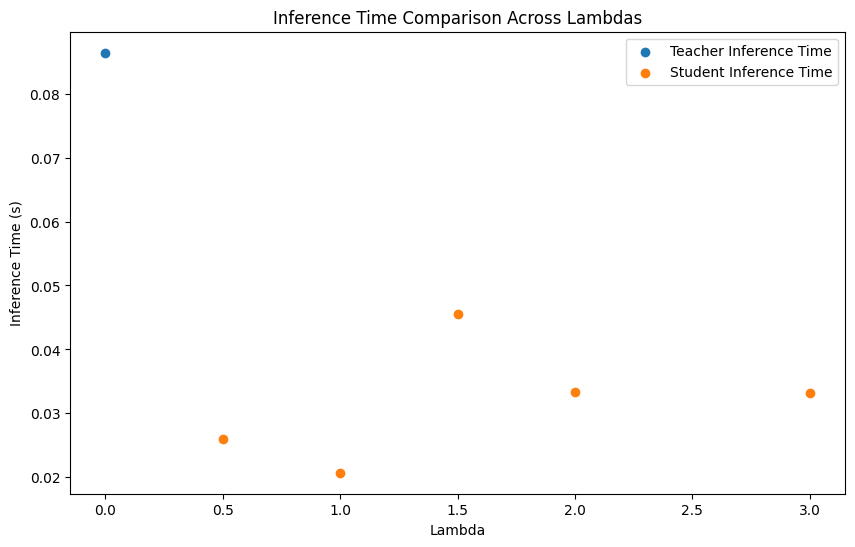

In [29]:
# Initialize dictionaries to store inference times for each lambda value
teacher_times = {}
student_times = {}

# Loop through each lambda value
for lmda_teacher in teacher_lambda_factor_list:
    # Define the path to the saved model file for this lambda_factor
    lambda_dir = os.path.join(base_save_dir, f'TEACHER_lambda_{lmda_teacher}')
    teacher_path = os.path.join(lambda_dir, f'TEACHER_best_model_lambda_{lmda_teacher}.pth')
    
    # Initialize the EfficientNet model without pre-trained weights
    teacher_model = models.efficientnet_b3(pretrained=False)
    
    # Adjust the classifier layer to match the number of classes
    num_ftrs = teacher.classifier[1].in_features
    teacher_model.classifier[1] = nn.Linear(num_ftrs, num_classes)
    
    # Load the model state
    teacher_best_model_state = torch.load(teacher_path)
    teacher_model.load_state_dict(teacher_best_model_state['teacher_state_dict'])
    teacher_model = teacher_model.to(device)

    teacher_time, _ = compare_inference_time(teacher_model, None, testloader)
    teacher_times[lmda_teacher] = teacher_time  # Store the inference time for the teacher model

for lmda_student in student_lambda_factor_list:
    # Define the path to the saved model file for this lambda_factor
    lambda_dir = os.path.join(base_save_dir, f'STUDENT_lambda_{lmda_student}')
    student_path = os.path.join(lambda_dir, f'STUDENT_best_model_lambda_{lmda_student}.pth')
    
    # Initialize the EfficientNet model without pre-trained weights
    student_model = models.efficientnet_b0(pretrained=False)
    
    # Adjust the classifier layer to match the number of classes
    num_ftrs = student_model.classifier[1].in_features
    student_model.classifier[1] = nn.Linear(num_ftrs, num_classes)
    
    # Load the model state
    student_best_model_state = torch.load(student_path)
    student_model.load_state_dict(student_best_model_state['student_state_dict'])
    student_model = student_model.to(device)

    _, student_time = compare_inference_time(None, student_model, testloader)
    student_times[lmda_student] = student_time  # Store the inference time for the student model

# Extracting lambda values and inference times
teacher_lambdas, teacher_inference_times = zip(*teacher_times.items())
student_lambdas, student_inference_times = zip(*student_times.items())

print(f'teacher: {teacher_inference_times}')
print(f'student: {student_inference_times}')

# Creating a scatter plot
plt.figure(figsize=(10, 6))
plt.scatter(teacher_lambdas, teacher_inference_times, label='Teacher Inference Time', marker='o')
plt.scatter(student_lambdas, student_inference_times, label='Student Inference Time', marker='o')

# Adding labels and title
plt.xlabel('Lambda')
plt.ylabel('Inference Time (s)')
plt.title('Inference Time Comparison Across Lambdas')
plt.legend()

# Displaying the plot
plt.show()

teacher: (0.11098296540611,)
student: (0.1090409905974539, 0.09584720120796965, 0.1218512708905112, 0.12649186109424382, 0.12105638225626375)


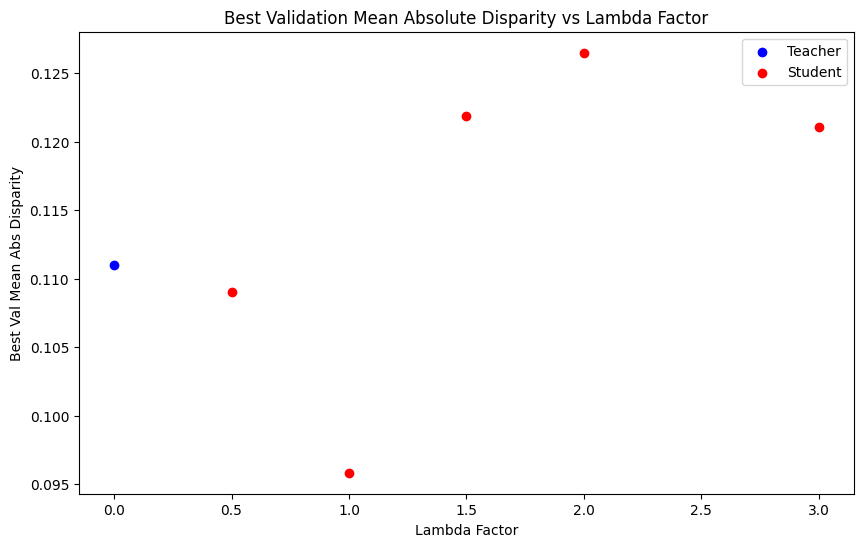

In [30]:
teacher_disparities = []
student_disparities = []

# Loop through each lambda_factor in the teacher_lambda_factor_list and extract the disparity values for the teacher
for lambda_factor in teacher_lambda_factor_list:
    # Load teacher model
    teacher_path = os.path.join(base_save_dir, f'TEACHER_lambda_{lambda_factor}', f'TEACHER_best_model_lambda_{lambda_factor}.pth')
    teacher_best_model_state = torch.load(teacher_path)
    teacher_disparities.append((lambda_factor, teacher_best_model_state['best_val_mean_abs_disparity']))

# Loop through each lambda_factor in the student_lambda_factor_list and extract the disparity values for the student
for lambda_factor in student_lambda_factor_list:
    # Load student model
    student_path = os.path.join(base_save_dir, f'STUDENT_lambda_{lambda_factor}', f'STUDENT_best_model_lambda_{lambda_factor}.pth')
    student_best_model_state = torch.load(student_path)
    student_disparities.append((lambda_factor, student_best_model_state['best_val_mean_abs_disparity']))

# Unpack the lambda factors and disparities for plotting
teacher_lambdas, teacher_disp_values = zip(*teacher_disparities)
student_lambdas, student_disp_values = zip(*student_disparities)

print(f'teacher: {teacher_disp_values}')
print(f'student: {student_disp_values}')


# Plotting
plt.figure(figsize=(10, 6))
plt.scatter(teacher_lambdas, teacher_disp_values, label='Teacher', color='blue')
plt.scatter(student_lambdas, student_disp_values, label='Student', color='red')
plt.xlabel('Lambda Factor')
plt.ylabel('Best Val Mean Abs Disparity')
plt.title('Best Validation Mean Absolute Disparity vs Lambda Factor')
plt.legend()
plt.show()


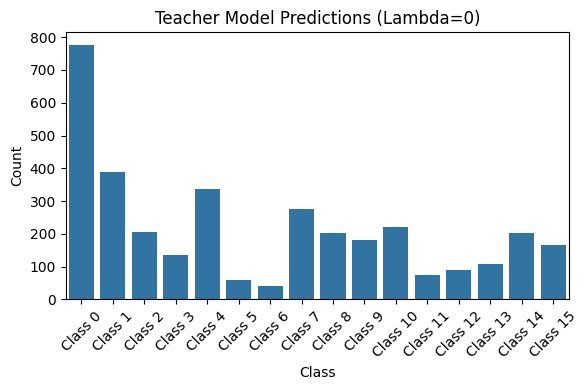

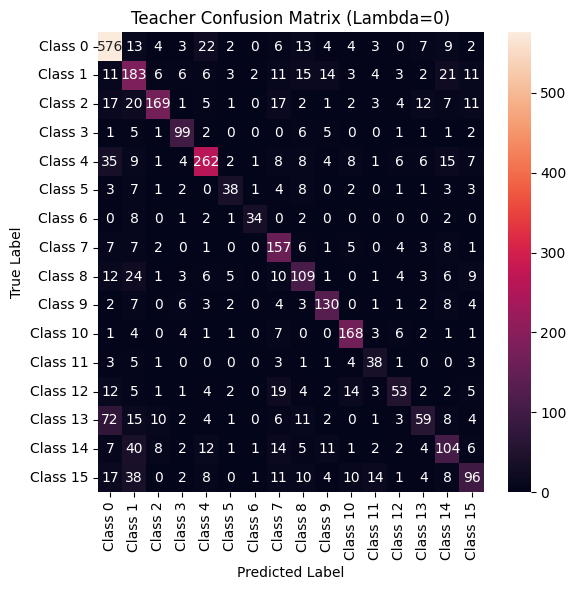

Classification Report - Teacher Model (Lambda=0)
              precision    recall  f1-score   support

     Class 0       0.74      0.86      0.80       668
     Class 1       0.47      0.61      0.53       301
     Class 2       0.82      0.62      0.71       272
     Class 3       0.73      0.80      0.76       124
     Class 4       0.78      0.69      0.73       377
     Class 5       0.64      0.51      0.57        74
     Class 6       0.85      0.68      0.76        50
     Class 7       0.57      0.78      0.66       202
     Class 8       0.54      0.56      0.55       194
     Class 9       0.72      0.75      0.74       173
    Class 10       0.76      0.84      0.80       199
    Class 11       0.51      0.63      0.57        60
    Class 12       0.59      0.41      0.48       129
    Class 13       0.55      0.30      0.39       198
    Class 14       0.51      0.47      0.49       220
    Class 15       0.58      0.43      0.49       224

    accuracy                   

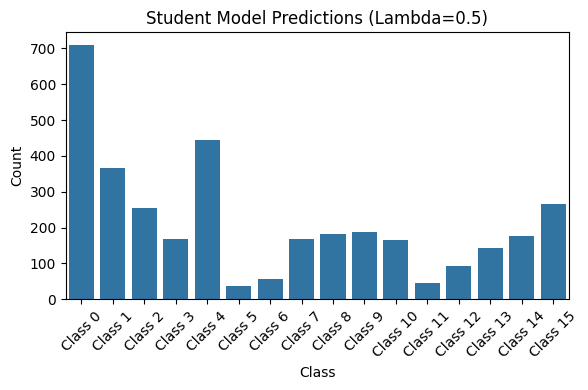

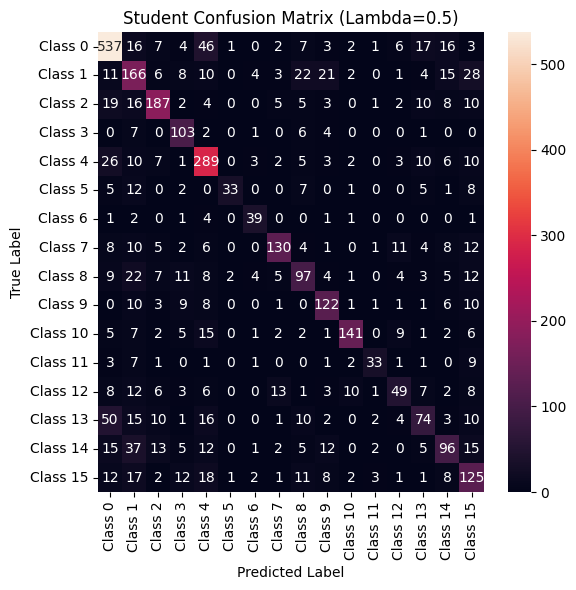

Classification Report - Student Model (Lambda=0.5)
              precision    recall  f1-score   support

     Class 0       0.76      0.80      0.78       668
     Class 1       0.45      0.55      0.50       301
     Class 2       0.73      0.69      0.71       272
     Class 3       0.61      0.83      0.70       124
     Class 4       0.65      0.77      0.70       377
     Class 5       0.89      0.45      0.59        74
     Class 6       0.70      0.78      0.74        50
     Class 7       0.78      0.64      0.70       202
     Class 8       0.53      0.50      0.52       194
     Class 9       0.65      0.71      0.67       173
    Class 10       0.85      0.71      0.77       199
    Class 11       0.73      0.55      0.63        60
    Class 12       0.53      0.38      0.44       129
    Class 13       0.51      0.37      0.43       198
    Class 14       0.55      0.44      0.48       220
    Class 15       0.47      0.56      0.51       224

    accuracy                 

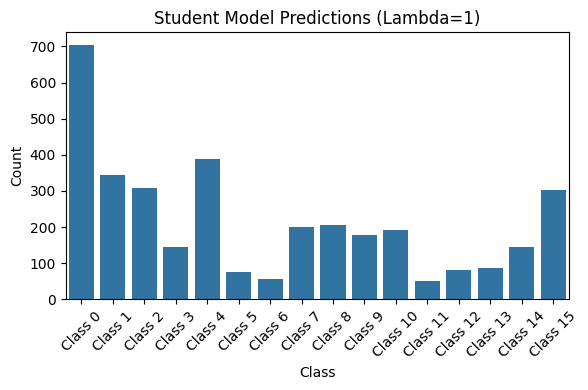

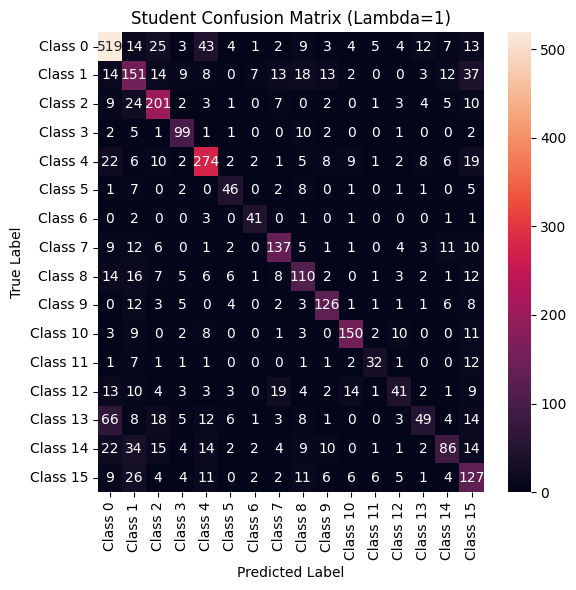

Classification Report - Student Model (Lambda=1)
              precision    recall  f1-score   support

     Class 0       0.74      0.78      0.76       668
     Class 1       0.44      0.50      0.47       301
     Class 2       0.65      0.74      0.69       272
     Class 3       0.68      0.80      0.73       124
     Class 4       0.71      0.73      0.72       377
     Class 5       0.60      0.62      0.61        74
     Class 6       0.72      0.82      0.77        50
     Class 7       0.68      0.68      0.68       202
     Class 8       0.54      0.57      0.55       194
     Class 9       0.71      0.73      0.72       173
    Class 10       0.79      0.75      0.77       199
    Class 11       0.63      0.53      0.58        60
    Class 12       0.51      0.32      0.39       129
    Class 13       0.56      0.25      0.34       198
    Class 14       0.60      0.39      0.47       220
    Class 15       0.42      0.57      0.48       224

    accuracy                   

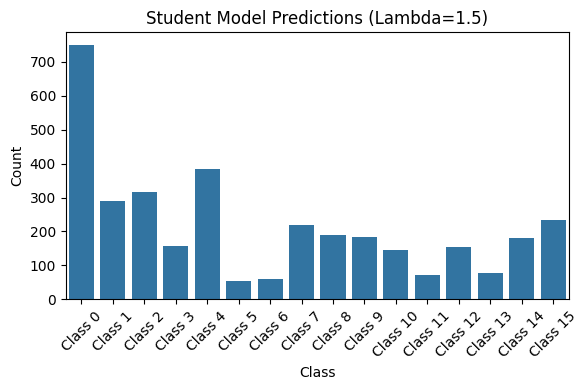

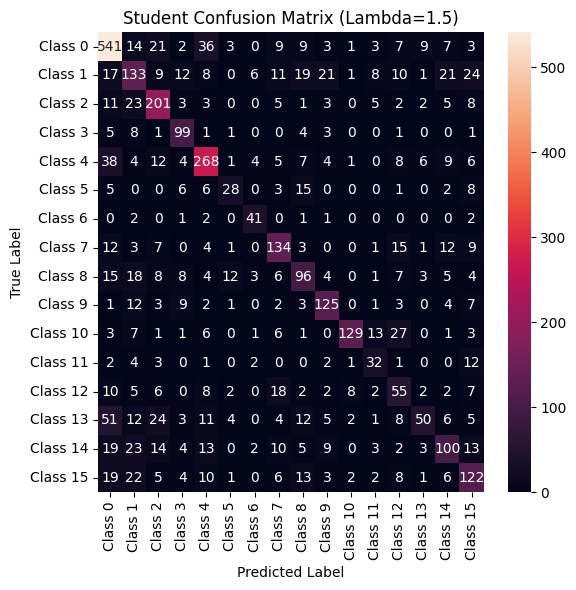

Classification Report - Student Model (Lambda=1.5)
              precision    recall  f1-score   support

     Class 0       0.72      0.81      0.76       668
     Class 1       0.46      0.44      0.45       301
     Class 2       0.64      0.74      0.68       272
     Class 3       0.63      0.80      0.71       124
     Class 4       0.70      0.71      0.71       377
     Class 5       0.52      0.38      0.44        74
     Class 6       0.69      0.82      0.75        50
     Class 7       0.61      0.66      0.64       202
     Class 8       0.50      0.49      0.50       194
     Class 9       0.68      0.72      0.70       173
    Class 10       0.89      0.65      0.75       199
    Class 11       0.44      0.53      0.48        60
    Class 12       0.35      0.43      0.39       129
    Class 13       0.64      0.25      0.36       198
    Class 14       0.56      0.45      0.50       220
    Class 15       0.52      0.54      0.53       224

    accuracy                 

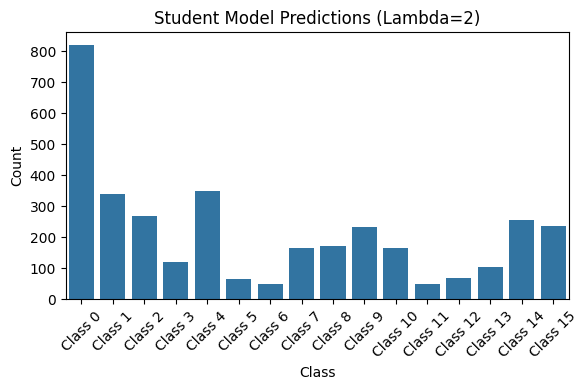

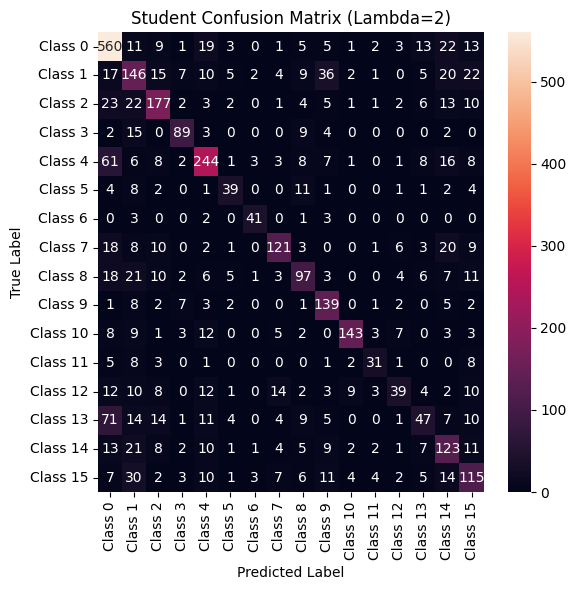

Classification Report - Student Model (Lambda=2)
              precision    recall  f1-score   support

     Class 0       0.68      0.84      0.75       668
     Class 1       0.43      0.49      0.46       301
     Class 2       0.66      0.65      0.65       272
     Class 3       0.75      0.72      0.73       124
     Class 4       0.70      0.65      0.67       377
     Class 5       0.60      0.53      0.56        74
     Class 6       0.80      0.82      0.81        50
     Class 7       0.72      0.60      0.66       202
     Class 8       0.56      0.50      0.53       194
     Class 9       0.60      0.80      0.69       173
    Class 10       0.87      0.72      0.79       199
    Class 11       0.63      0.52      0.57        60
    Class 12       0.56      0.30      0.39       129
    Class 13       0.45      0.24      0.31       198
    Class 14       0.48      0.56      0.52       220
    Class 15       0.49      0.51      0.50       224

    accuracy                   

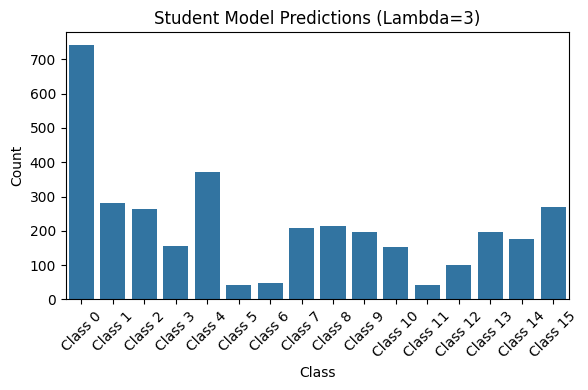

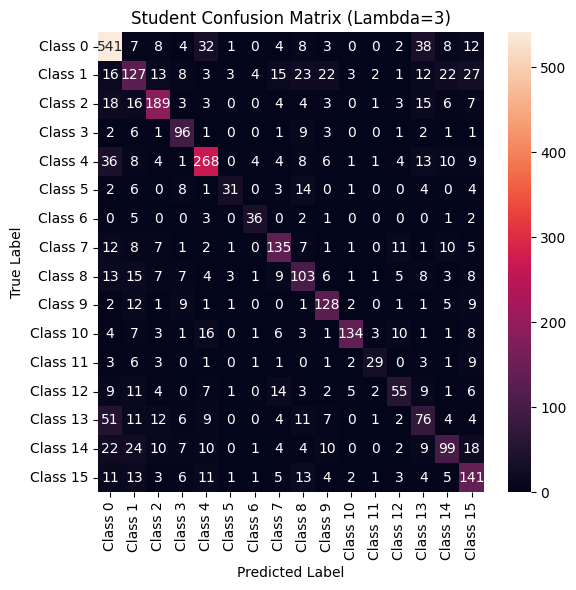

Classification Report - Student Model (Lambda=3)
              precision    recall  f1-score   support

     Class 0       0.73      0.81      0.77       668
     Class 1       0.45      0.42      0.44       301
     Class 2       0.71      0.69      0.70       272
     Class 3       0.61      0.77      0.68       124
     Class 4       0.72      0.71      0.72       377
     Class 5       0.74      0.42      0.53        74
     Class 6       0.73      0.72      0.73        50
     Class 7       0.65      0.67      0.66       202
     Class 8       0.48      0.53      0.51       194
     Class 9       0.65      0.74      0.69       173
    Class 10       0.88      0.67      0.76       199
    Class 11       0.71      0.48      0.57        60
    Class 12       0.55      0.43      0.48       129
    Class 13       0.39      0.38      0.39       198
    Class 14       0.56      0.45      0.50       220
    Class 15       0.52      0.63      0.57       224

    accuracy                   

In [31]:
def plot_distribution(predictions, class_names, title):
    plt.figure(figsize=(6, 4))
    sns.countplot(x=predictions)
    plt.title(title)
    plt.xlabel('Class')
    plt.ylabel('Count')
    plt.xticks(range(len(class_names)), class_names, rotation=45)
    plt.tight_layout()
    plt.show()

def plot_confusion_matrix(all_labels, predictions, class_names, title):
    cm = confusion_matrix(all_labels, predictions)
    plt.figure(figsize=(6, 6))
    sns.heatmap(pd.DataFrame(cm, index=class_names, columns=class_names), annot=True, fmt='g')
    plt.title(title)
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.tight_layout()
    plt.show()

# Function to generate predictions and compute metrics
def generate_predictions_and_metrics(model, dataloader):
    model.eval()
    all_labels = []
    all_preds = []

    with torch.no_grad():
        for batch in dataloader:
            inputs = batch['img'].to(device)
            labels = batch['label'].to(device)
            
            outputs = model(inputs)
            preds = torch.argmax(outputs, dim=1).cpu().numpy()
            
            all_labels.append(labels.cpu().numpy())
            all_preds.append(preds)

    all_labels = np.concatenate(all_labels)
    all_preds = np.concatenate(all_preds)

    return all_labels, all_preds

# Loop over each lambda value for the teacher model
for lmda_teacher in teacher_lambda_factor_list:
    # Define the path to the saved model file for this lambda_factor
    lambda_dir = os.path.join(base_save_dir, f'TEACHER_lambda_{lmda_teacher}')
    teacher_path = os.path.join(lambda_dir, f'TEACHER_best_model_lambda_{lmda_teacher}.pth')
    
    # Initialize the EfficientNet model without pre-trained weights
    teacher_model = models.efficientnet_b3(pretrained=False)
    
    # Adjust the classifier layer to match the number of classes
    num_ftrs = teacher.classifier[1].in_features
    teacher_model.classifier[1] = nn.Linear(num_ftrs, num_classes)
    
    # Load the model state
    teacher_best_model_state = torch.load(teacher_path)
    teacher_model.load_state_dict(teacher_best_model_state['teacher_state_dict'])
    teacher_model = teacher_model.to(device)
    
    # Generate predictions for the teacher model
    all_labels, all_teacher_preds = generate_predictions_and_metrics(teacher_model, testloader)

    # Plot distribution and confusion matrix for the teacher model
    plot_distribution(all_teacher_preds, class_names_new, f'Teacher Model Predictions (Lambda={lmda_teacher})')
    plot_confusion_matrix(all_labels, all_teacher_preds, class_names_new, f'Teacher Confusion Matrix (Lambda={lmda_teacher})')

    # Print classification report for the teacher model
    teacher_report = classification_report(all_labels, all_teacher_preds, target_names=class_names_new, zero_division=0)
    print(f'Classification Report - Teacher Model (Lambda={lmda_teacher})')
    print(teacher_report)

# Loop over each lambda value for the student model
for lmda_student in student_lambda_factor_list:
    # Define the path to the saved model file for this lambda_factor
    lambda_dir = os.path.join(base_save_dir, f'STUDENT_lambda_{lmda_student}')
    student_path = os.path.join(lambda_dir, f'STUDENT_best_model_lambda_{lmda_student}.pth')
    
    # Initialize the EfficientNet model without pre-trained weights
    student_model = models.efficientnet_b0(pretrained=False)
    
    # Adjust the classifier layer to match the number of classes
    num_ftrs = student_model.classifier[1].in_features
    student_model.classifier[1] = nn.Linear(num_ftrs, num_classes)
    
    # Load the model state
    student_best_model_state = torch.load(student_path)
    student_model.load_state_dict(student_best_model_state['student_state_dict'])
    student_model = student_model.to(device)

    # Generate predictions for the student model
    all_labels, all_student_preds = generate_predictions_and_metrics(student_model, testloader)

    # Plot distribution and confusion matrix for the student model
    plot_distribution(all_student_preds, class_names_new, f'Student Model Predictions (Lambda={lmda_student})')
    plot_confusion_matrix(all_labels, all_student_preds, class_names_new, f'Student Confusion Matrix (Lambda={lmda_student})')

    # Print classification report for the student model
    student_report = classification_report(all_labels, all_student_preds, target_names=class_names_new, zero_division=0)
    print(f'Classification Report - Student Model (Lambda={lmda_student})')
    print(student_report)

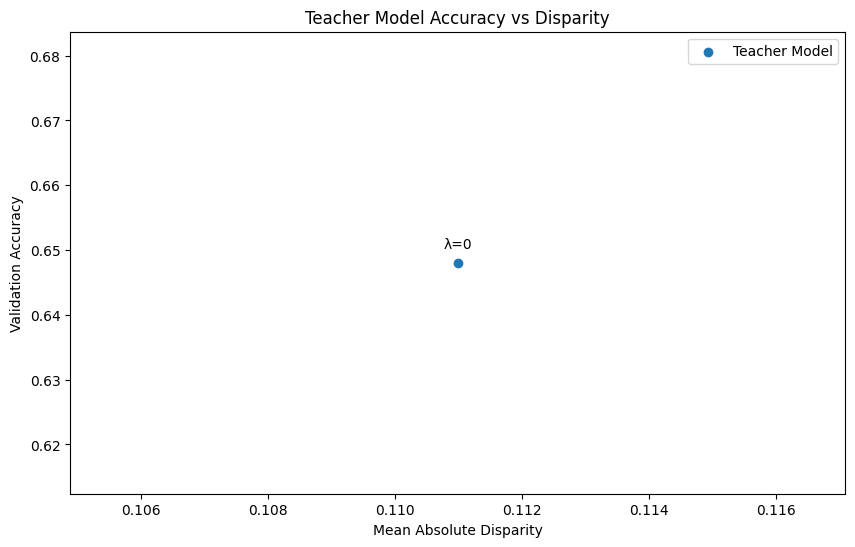

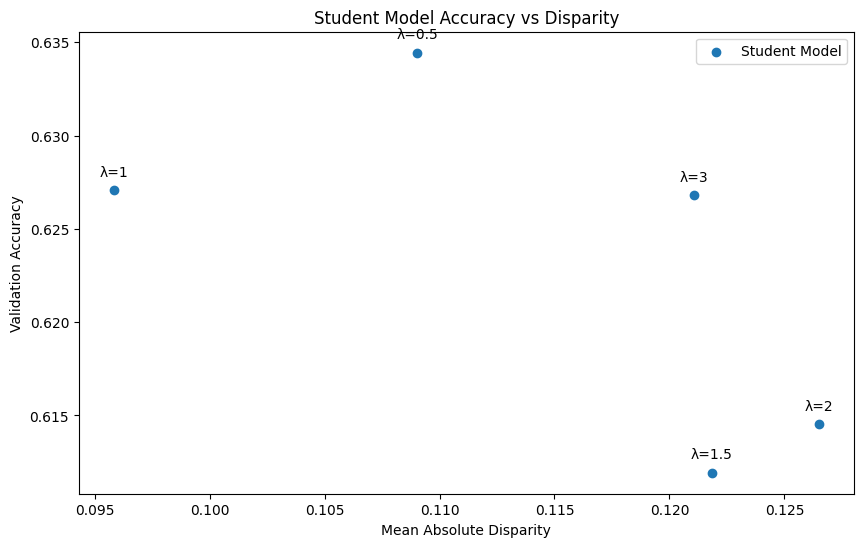

In [32]:
def plot_bias_variance_tradeoff(base_save_dir, model_type, lambda_list):
    bias_values = []
    accuracy_values = []

    for lambda_factor in lambda_list:
        model_path = os.path.join(base_save_dir, f'{model_type.upper()}_lambda_{lambda_factor}', f'{model_type.upper()}_best_model_lambda_{lambda_factor}.pth')
        if os.path.exists(model_path):
            model_state = torch.load(model_path)

            disparity = model_state['best_val_mean_abs_disparity']
            accuracy = model_state['best_val_accuracy']
            bias_values.append(disparity)
            accuracy_values.append(accuracy)

    # Plotting
    plt.figure(figsize=(10, 6))
    plt.scatter(bias_values, accuracy_values, label=f'{model_type.title()} Model')
    plt.xlabel('Mean Absolute Disparity')
    plt.ylabel('Validation Accuracy')
    plt.title(f'{model_type.title()} Model Accuracy vs Disparity')
    for i, lambda_factor in enumerate(lambda_list):
        plt.annotate(f'λ={lambda_factor}', (bias_values[i], accuracy_values[i]), textcoords="offset points", xytext=(0,10), ha='center')
    plt.legend()
    plt.show()

# Plot for Teacher
plot_bias_variance_tradeoff(base_save_dir, 'teacher', teacher_lambda_factor_list)

# Plot for Student
plot_bias_variance_tradeoff(base_save_dir, 'student', student_lambda_factor_list)

In [33]:
def compare_performance_metrics_for_demo(teacher, student, dataloader):
    teacher.eval()
    student.eval()

    detailed_info = []

    for batch in dataloader:
        inputs = batch['img'].to(device)
        labels = batch['label'].to(device)
        # Assuming gender or other attributes are part of 'target'
        attributes = batch['target'].to(device)  

        with torch.no_grad():
            teacher_outputs = teacher(inputs)
            student_outputs = student(inputs)

        teacher_preds = torch.argmax(teacher_outputs, dim=1)
        student_preds = torch.argmax(student_outputs, dim=1)

        for i in range(inputs.size(0)):
            if teacher_preds[i] != labels[i] and student_preds[i] == labels[i]:
                info = {
                    'image': inputs[i],
                    'actual_class': labels[i].item(),
                    'teacher_pred_class': teacher_preds[i].item(),
                    'student_pred_class': student_preds[i].item(),
                    'actual_attribute': attributes[i].item()
                }
                detailed_info.append(info)

    return detailed_info

In [34]:
def plot_images_with_class_filter(info_list, display_class, new_label_mapping, rows=10, cols=5):
    # Filter the info list based on the specified class, student correct and teacher incorrect predictions
    filtered_info = [info for info in info_list if info['actual_class'] == display_class and 
                     info['student_pred_class'] == display_class and 
                     info['teacher_pred_class'] != display_class]

    # Calculate the number of images to display based on the length of the filtered list
    num_images = len(filtered_info)
    if num_images == 0:
        print(f"No images to display for class {display_class}.")
        return  # Skip this class as there are no images to display

    total_plots = min(rows * cols, num_images)  # Ensure we don't exceed the number of filtered images

    # Determine the number of rows needed based on the number of images
    rows = (total_plots + cols - 1) // cols

    # Create a figure with the adjusted number of rows and columns
    fig, axes = plt.subplots(rows, cols, figsize=(15, 3 * rows))
    axes = axes.ravel()

    for i in range(total_plots):
        data = filtered_info[i]
        image = data['image']
        actual_class = new_label_mapping[data['actual_class']]  # Get class name from the mapping
        teacher_pred_class = new_label_mapping[data['teacher_pred_class']]  # Get class name from the mapping
        student_pred_class = new_label_mapping[data['student_pred_class']]  # Get class name from the mapping
        actual_attribute = round(data['actual_attribute'], 3)
    
        # Normalize the image for display
        image_display = image.cpu().numpy().transpose(1, 2, 0)
        image_display = (image_display - image_display.min()) / (image_display.max() - image_display.min())
    
        # Set the title with the class and attribute information
        title = f'Attr: {actual_attribute}\nTrue: {actual_class}\nTeacher: {teacher_pred_class}\nStudent: {student_pred_class}'
    
        axes[i].imshow(image_display)
        axes[i].set_title(title, fontsize=12, pad=4)
        axes[i].axis('off')

    # Turn off any unused axes
    for i in range(total_plots, len(axes)):
        axes[i].axis('off')

    # Adjust layout for clarity
    plt.tight_layout()
    plt.subplots_adjust(wspace=0.5, hspace=0.6)
    plt.show()


In [35]:
# Load the Teacher Model for a specific lambda value
def load_teacher_model(lambda_factor):
    lambda_dir = os.path.join(base_save_dir, f'TEACHER_lambda_{lambda_factor}')
    teacher_path = os.path.join(lambda_dir, f'TEACHER_best_model_lambda_{lambda_factor}.pth')

    teacher_model = models.efficientnet_b3(pretrained=False)
    num_ftrs = teacher_model.classifier[1].in_features
    teacher_model.classifier[1] = torch.nn.Linear(num_ftrs, num_classes)

    teacher_best_model_state = torch.load(teacher_path)
    teacher_model.load_state_dict(teacher_best_model_state['teacher_state_dict'])
    teacher_model = teacher_model.to(device)
    return teacher_model

# Load the Student Model for a specific lambda value
def load_student_model(lambda_factor):
    lambda_dir = os.path.join(base_save_dir, f'STUDENT_lambda_{lambda_factor}')
    student_path = os.path.join(lambda_dir, f'STUDENT_best_model_lambda_{lambda_factor}.pth')

    student_model = models.efficientnet_b0(pretrained=False)
    num_ftrs = student_model.classifier[1].in_features
    student_model.classifier[1] = torch.nn.Linear(num_ftrs, num_classes)

    student_best_model_state = torch.load(student_path)
    student_model.load_state_dict(student_best_model_state['student_state_dict'])
    student_model = student_model.to(device)
    return student_model

# Load models for a specific lambda value
teacher_lambda_factor = 0 
student_lambda_factor = 5

teacher_model = load_teacher_model(teacher_lambda_factor)
student_model = load_student_model(student_lambda_factor)

# Assuming 'testloader', 'new_label_mapping', and 'num_classes' are defined
# Get detailed info where student is correct and teacher is wrong
detailed_info = compare_performance_metrics_for_demo(teacher_model, student_model, testloader)

# Plot images
for i in range(num_classes):
    print('='*60)
    print(f'CLASS {i}: {new_label_mapping[i]}')
    print('='*60)
    plot_images_with_class_filter(detailed_info, display_class=i, new_label_mapping=new_label_mapping, rows=100, cols=5)


FileNotFoundError: [Errno 2] No such file or directory: 'Test_Dir10/STUDENT_lambda_5/STUDENT_best_model_lambda_5.pth'

In [ ]:
# Load the Teacher Model for a specific lambda value
def load_teacher_model(lambda_factor):
    lambda_dir = os.path.join(base_save_dir, f'TEACHER_lambda_{lambda_factor}')
    teacher_path = os.path.join(lambda_dir, f'TEACHER_best_model_lambda_{lambda_factor}.pth')

    teacher_model = models.efficientnet_b3(pretrained=False)
    num_ftrs = teacher_model.classifier[1].in_features
    teacher_model.classifier[1] = torch.nn.Linear(num_ftrs, num_classes)

    teacher_best_model_state = torch.load(teacher_path)
    teacher_model.load_state_dict(teacher_best_model_state['teacher_state_dict'])
    teacher_model = teacher_model.to(device)
    return teacher_model

# Load the Student Model for a specific lambda value
def load_student_model(lambda_factor):
    lambda_dir = os.path.join(base_save_dir, f'STUDENT_lambda_{lambda_factor}')
    student_path = os.path.join(lambda_dir, f'STUDENT_best_model_lambda_{lambda_factor}.pth')

    student_model = models.efficientnet_b0(pretrained=False)
    num_ftrs = student_model.classifier[1].in_features
    student_model.classifier[1] = torch.nn.Linear(num_ftrs, num_classes)

    student_best_model_state = torch.load(student_path)
    student_model.load_state_dict(student_best_model_state['student_state_dict'])
    student_model = student_model.to(device)
    return student_model

# Load models for a specific lambda value
teacher_lambda_factor = 0 
student_lambda_factor = 0.5

teacher_model = load_teacher_model(teacher_lambda_factor)
student_model = load_student_model(student_lambda_factor)

# Assuming 'testloader', 'new_label_mapping', and 'num_classes' are defined
# Get detailed info where student is correct and teacher is wrong
detailed_info = compare_performance_metrics_for_demo(teacher_model, student_model, testloader)

# Plot images
for i in range(num_classes):
    print('='*60)
    print(f'CLASS {i}: {new_label_mapping[i]}')
    print('='*60)
    plot_images_with_class_filter(detailed_info, display_class=i, new_label_mapping=new_label_mapping, rows=100, cols=5)


In [ ]:
# Load the Teacher Model for a specific lambda value
def load_teacher_model(lambda_factor):
    lambda_dir = os.path.join(base_save_dir, f'TEACHER_lambda_{lambda_factor}')
    teacher_path = os.path.join(lambda_dir, f'TEACHER_best_model_lambda_{lambda_factor}.pth')

    teacher_model = models.efficientnet_b3(pretrained=False)
    num_ftrs = teacher_model.classifier[1].in_features
    teacher_model.classifier[1] = torch.nn.Linear(num_ftrs, num_classes)

    teacher_best_model_state = torch.load(teacher_path)
    teacher_model.load_state_dict(teacher_best_model_state['teacher_state_dict'])
    teacher_model = teacher_model.to(device)
    return teacher_model

# Load the Student Model for a specific lambda value
def load_student_model(lambda_factor):
    lambda_dir = os.path.join(base_save_dir, f'STUDENT_lambda_{lambda_factor}')
    student_path = os.path.join(lambda_dir, f'STUDENT_best_model_lambda_{lambda_factor}.pth')

    student_model = models.efficientnet_b0(pretrained=False)
    num_ftrs = student_model.classifier[1].in_features
    student_model.classifier[1] = torch.nn.Linear(num_ftrs, num_classes)

    student_best_model_state = torch.load(student_path)
    student_model.load_state_dict(student_best_model_state['student_state_dict'])
    student_model = student_model.to(device)
    return student_model

# Load models for a specific lambda value
teacher_lambda_factor = 0 
student_lambda_factor = 3

teacher_model = load_teacher_model(teacher_lambda_factor)
student_model = load_student_model(student_lambda_factor)

# Assuming 'testloader', 'new_label_mapping', and 'num_classes' are defined
# Get detailed info where student is correct and teacher is wrong
detailed_info = compare_performance_metrics_for_demo(teacher_model, student_model, testloader)

# Plot images
for i in range(num_classes):
    print('='*60)
    print(f'CLASS {i}: {new_label_mapping[i]}')
    print('='*60)
    plot_images_with_class_filter(detailed_info, display_class=i, new_label_mapping=new_label_mapping, rows=100, cols=5)
